In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from tqdm.auto import tqdm
from matplotlib.lines import Line2D
from sklearn.cluster import DBSCAN

In [2]:
train_data = pd.read_csv('dataset/train_data.csv')
test_data = pd.read_csv('dataset/test_data.csv')
submission = pd.read_csv('dataset/answer_sample.csv')

In [3]:
train_data['data_type'] = 'train'
test_data['data_type'] = 'test'

In [4]:
def box_plot(data, title=""):
    plt.figure(figsize=(3,5))
    g = sns.boxplot(data=pd.DataFrame(data), showfliers=False)
    g.set_title(title, size=10)
    g.set_xticklabels(g.get_xticklabels())
    plt.show()

In [5]:
# train_data 분리

for i in range(8):
  globals()['train_data{}'.format(i)] = train_data[train_data['type'] == i]

# test_data 분리
for i in range(8):
  globals()['test_data{}'.format(i)] = test_data[test_data['type'] == i]

In [6]:
def plot_corr(data, name1, name2):
    plt.figure(figsize=(7,5))
    correlation = data[name1].corr(data[name2])
    j = 0
    color = ['green', 'yellow', 'red']
    for i in range(8):
        globals()['data{}'.format(i)] = data[data['type'] == i]
        if i == 1 or i == 2 or i == 3:
            sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
            j += 1
        else :
            sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue')
    plt.title('correlation: ' + str(np.round(correlation, 2)), fontsize=20)
    plt.xlabel(name1, fontsize=12)
    plt.ylabel(name2, fontsize=12)
    plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
    plt.show()

In [7]:
train_data['motor_rpm/motor_current'] = train_data['motor_rpm'] / train_data['motor_current']
train_data['air_inflow/motor_current'] = train_data['air_inflow'] / train_data['motor_current'] 

In [8]:
test_data['motor_rpm/motor_current'] = test_data['motor_rpm'] / test_data['motor_current']
test_data['air_inflow/motor_current'] = test_data['air_inflow'] / test_data['motor_current'] 

In [9]:
# 상관도 표 함수
def corr_matrix(data):
  plt.figure(figsize=(7,5))
  mask = np.zeros_like(data.corr(), dtype=np.bool)
  mask[np.triu_indices_from(mask)] = True
  g = sns.heatmap(data.corr(), cmap='RdYlGn_r', vmax=1, mask=mask, center=0, annot=True, annot_kws={"size": 10}, fmt=".2f", square=True,
                  cbar_kws={"shrink":.7})
  g.set_xticklabels(g.get_xmajorticklabels(), fontsize=10)
  g.set_yticklabels(g.get_xmajorticklabels(), fontsize=10)
  plt.show()

In [10]:
# 상관도 표 함수
def subplot_corr_matrix(data):
  f, axs = plt.subplots(4,2,figsize=(10,12))
  for i in range(8):
    globals()['data{}'.format(i)] = data[data['type']==i].drop(columns=['out_pressure', 'type'])
    mask = np.zeros_like(globals()['data{}'.format(i)].corr(), dtype = np.bool)
    mask[np.triu_indices_from(mask)] = True
    g = sns.heatmap(globals()['data{}'.format(i)].corr(), cmap='RdYlGn_r', vmax=1,vmin=0,  mask=mask, center=0, annot=True, annot_kws={"size":10},
                    fmt=".2f", square=True, ax=axs[int(i/2), i%2], cbar_kws={"shrink":.7})
    g.set_xticklabels(g.get_xmajorticklabels(), fontsize=4)
    g.set_yticklabels(g.get_xmajorticklabels(), fontsize=4)
    axs[int(i/2), i%2].set_title('type={}'.format(i),size=4)
  plt.tight_layout()
  plt.show()

In [1795]:
def sub_plot_corr(data,data2,  name1, name2):
  plt.figure(figsize=(10,5))
  correlation = data[name1].corr(data[name2])
  mask = data2['label']==1
  j = 0
  color = ['green', 'yellow', 'red']
  for i in range(8):
    globals()['data{}'.format(i)] = data[data['type'] == i]
    plt.subplot(1,2,1)
    if i == 1 or i == 2 or i == 3:
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue')
  g.set_title("train_data", size=10)
#   g.set_xticklabels(g.get_xticklabels())
#   g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
  j = 0
  for i in range(8):
    globals()['data{}'.format(i)] = data2[data2['type'] == i]
    plt.subplot(1,2,2)
    if i == 1 or i == 2 or i == 3:
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue') 
  g2 = sns.scatterplot(data=data2[mask], x=name1, y=name2, color='black')
  g2.set_title("test_data", size=10)
#   g2.set_xticklabels(g.get_xticklabels())
#   g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
  plt.tight_layout()
  plt.show()

In [12]:
train_data = train_data[train_data['motor_vibe']<=20].reset_index(drop=True)

In [13]:
def custom_split_data(data, name1, name2):
  data[name1+'/'+name2] = np.NaN
  for i in tqdm(range(len(data))):
    if data['type'][i] == 1:
      data[name1+'/'+name2][i] = data[name1][i] / data[name2][i]
    elif data['type'][i] == 2:
      data[name1+'/'+name2][i] = data[name1][i] / data[name2][i]
    elif data['type'][i] == 3:
      data[name1+'/'+name2][i] = data[name1][i] / data[name2][i]
    else:
      data[name1+'/'+name2][i] = data[name1][i] / data[name2][i]
  return data

In [14]:
def custom_split_data_horse(data, name1):
  data[name1+'/horse_power'] = np.NaN
  for i in tqdm(range(len(data))):
    if data['type'][i] == 1:
      data[name1+'/horse_power'][i] = data[name1][i] / 20
    elif data['type'][i] == 2:
      data[name1+'/horse_power'][i] = data[name1][i] / 10
    elif data['type'][i] == 3:
      data[name1+'/horse_power'][i] = data[name1][i] / 50
    else:
      data[name1+'/horse_power'][i] = data[name1][i] / 30
  return data

In [15]:
train_data = custom_split_data(train_data, 'air_inflow', 'motor_rpm')
test_data = custom_split_data(test_data, 'air_inflow', 'motor_rpm')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [16]:
train_data = custom_split_data(train_data, 'motor_current', 'motor_rpm')
test_data = custom_split_data(test_data, 'motor_current', 'motor_rpm')
train_data = custom_split_data_horse(train_data, 'motor_current')
test_data = custom_split_data_horse(test_data, 'motor_current')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [17]:
train_data = custom_split_data(train_data, 'motor_vibe', 'motor_temp')
test_data = custom_split_data(test_data, 'motor_vibe', 'motor_temp')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [18]:
train_data = custom_split_data(train_data, 'motor_temp', 'air_end_temp')
test_data = custom_split_data(test_data, 'motor_temp', 'air_end_temp')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

# data split

In [1146]:
train_data = custom_split_data_mul(train_data, 'motor_current', 'motor_temp')
test_data = custom_split_data_mul(test_data, 'motor_current', 'motor_temp')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [1165]:
train_data = custom_split_data_mul(train_data, 'motor_current*motor_temp', 'motor_vibe')
test_data = custom_split_data_mul(test_data, 'motor_current*motor_temp', 'motor_vibe')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [1170]:
train_data = custom_split_data_mul(train_data, 'motor_current*motor_temp*motor_vibe', 'motor_rpm')
test_data = custom_split_data_mul(test_data, 'motor_current*motor_temp*motor_vibe', 'motor_rpm')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [1339]:
train_data = custom_split_data_mul(train_data, 'motor_vibe', 'motor_rpm')
test_data = custom_split_data_mul(test_data, 'motor_vibe', 'motor_rpm')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [1356]:
train_data = custom_split_data(train_data, 'motor_vibe', 'motor_rpm')
test_data = custom_split_data(test_data, 'motor_vibe', 'motor_rpm')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [1384]:
train_data = custom_split_data(train_data, 'motor_rpm','motor_vibe')
test_data = custom_split_data(test_data, 'motor_rpm', 'motor_vibe')

  0%|          | 0/2447 [00:00<?, ?it/s]

  0%|          | 0/7389 [00:00<?, ?it/s]

In [1140]:
def custom_split_data_mul(data, name1, name2):
  data[name1+'*'+name2] = np.NaN
  for i in tqdm(range(len(data))):
    if data['type'][i] == 1:
      data[name1+'*'+name2][i] = data[name1][i] * data[name2][i]
    elif data['type'][i] == 2:
      data[name1+'*'+name2][i] = data[name1][i] * data[name2][i]
    elif data['type'][i] == 3:
      data[name1+'*'+name2][i] = data[name1][i] * data[name2][i]
    else:
      data[name1+'*'+name2][i] = data[name1][i] * data[name2][i]
  return data

In [19]:
def sub_plot_corr_plus(data,data2,  name1, name2):
  plt.figure(figsize=(10,5))
  correlation = data[name1].corr(data[name2])
  j = 0
  color = ['green', 'yellow', 'red']
  for i in range(8):
    globals()['data{}'.format(i)] = data[data['type'] == i]
    plt.subplot(1,2,1)
    if i == 1 or i == 2 or i == 3:
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue')
  g.set_title("train_data", size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
  j = 0
  for i in range(8):
    globals()['data{}'.format(i)] = data2[data2['type'] == i]
    plt.subplot(1,2,2)
    if i == 1 or i == 2 or i == 3:
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue') 
  data_ = data4[data4['out_pressure']!=0.7] 
  g2 = sns.scatterplot(data=data_, x=name1, y=name2, color='black') 
  g2.set_title("test_data", size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
  plt.tight_layout()
  plt.show()

In [20]:
def sub_plot_corr_plus2(data,data2,  name1, name2):
  plt.figure(figsize=(10,5))
  correlation = data[name1].corr(data[name2])
  k = 0
  j = 0
  color = ['green', 'yellow', 'red']
  color2 = ['#03ffee','#003ea1','#0b9630','#7e02ab','#a1790d']
  for i in range(8):
    globals()['data{}'.format(i)] = data[data['type'] == i]
    plt.subplot(1,2,1)
    if i == 1 or i == 2 or i == 3:
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color2[k]) 
      k += 1
  g.set_title("train_data", size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = 0','type = 1', 'type = 2','type = 3', 'type = 4', 'type = 5', 'type = 6', 'type = 7'])
  j = 0
  k = 0
  for i in range(8):
    globals()['data{}'.format(i)] = data2[data2['type'] == i]
    plt.subplot(1,2,2)
    if i == 1 or i == 2 or i == 3:
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color2[k]) 
      k += 1
  g2.set_title("test_data", size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = 0','type = 1', 'type = 2','type = 3', 'type = 4', 'type = 5', 'type = 6', 'type = 7'])
  plt.tight_layout()
  plt.show()

In [1390]:
sum_data = pd.concat([train_data, test_data]).reset_index()
sum_data

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,data_type,...,motor_vibe/motor_temp,motor_temp/air_end_temp,motor_temp*air_end_temp,motor_temp*motor_temp,motor_current*motor_temp,motor_current*motor_temp*motor_vibe,motor_current*motor_temp*motor_vibe*motor_rpm,motor_vibe*motor_rpm,motor_vibe/motor_rpm,motor_rpm/motor_vibe
0,0,1.59,41.00,0.7,20.53,1680.0,58.67,2.93,0,train,...,0.049940,1.430976,2405.4700,3442.1689,1204.4951,3529.170643,5.929007e+06,4922.40,0.001744,573.378840
1,1,2.97,59.28,0.7,38.40,3142.0,74.91,3.75,0,train,...,0.050060,1.263664,4440.6648,5611.5081,2876.5440,10787.040000,3.389288e+07,11782.50,0.001194,837.866667
2,2,1.91,45.29,0.7,24.73,2023.0,62.48,3.12,0,train,...,0.049936,1.379554,2829.7192,3903.7504,1545.1304,4820.806848,9.752492e+06,6311.76,0.001542,648.397436
3,3,2.37,51.33,0.7,30.63,2506.0,67.84,3.39,0,train,...,0.049971,1.321644,3482.2272,4602.2656,2077.9392,7044.213888,1.765280e+07,8495.34,0.001353,739.233038
4,4,1.90,45.21,0.7,24.65,2017.0,62.41,3.12,0,train,...,0.049992,1.380447,2821.5561,3895.0081,1538.4065,4799.828280,9.681254e+06,6293.04,0.001547,646.474359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9831,7384,2.12,48.08,0.7,27.45,2246.0,64.96,3.25,7,test,...,0.050031,1.351082,3123.2768,4219.8016,1783.1520,5795.244000,1.301612e+07,7299.50,0.001447,691.076923
9832,7385,1.48,39.63,0.7,19.19,1570.0,57.44,2.87,7,test,...,0.049965,1.449407,2276.3472,3299.3536,1102.2736,3163.525232,4.966735e+06,4505.90,0.001828,547.038328
9833,7386,1.56,40.61,0.7,20.15,1649.0,58.32,2.92,7,test,...,0.050069,1.436099,2368.3752,3401.2224,1175.1480,3431.432160,5.658432e+06,4815.08,0.001771,564.726027
9834,7387,1.59,40.99,0.7,20.52,1679.0,58.66,2.93,7,test,...,0.049949,1.431081,2404.4734,3440.9956,1203.7032,3526.850376,5.921582e+06,4919.47,0.001745,573.037543


In [1391]:
for i in range(8):
  globals()['test_data_{}'.format(i)] = test_data[test_data['type'] == i].reset_index()
for i in range(8):
  globals()['train_data_{}'.format(i)] = train_data[train_data['type'] == i].reset_index()
for i in range(8):
  globals()['sum_data_{}'.format(i)] = sum_data[sum_data['type'] == i].reset_index()

In [23]:
def sub_plot_type(data1, data2, type1, name1, name2):
  plt.figure(figsize=(10,5))
  color = ['#03ffee', 'green', 'yellow', 'red', '#003ea1','#0b9630','#7e02ab','#a1790d']
  plt.subplot(1,2,1)
  g = sns.scatterplot(data=data1, x=name1, y=name2, color=color[type1])
  g.set_title('test_data', size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = '+str(type1)])

  plt.subplot(1,2,2)
  g2 = sns.scatterplot(data=data2, x=name1, y=name2, color=color[type1])
  g2.set_title('train_data', size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = '+str(type1)])
  plt.tight_layout()
  plt.show()

In [24]:
def sub_plot_type_result(data1, data2, type1, name1, name2):
  plt.figure(figsize=(10,5))
  color = ['#03ffee', 'green', 'yellow', 'red', '#003ea1','#0b9630','#7e02ab','#a1790d']
  plt.subplot(1,2,1)
  g = sns.scatterplot(data=data1, x=name1, y=name2, color=color[type1])
  g.set_title('sum_data', size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = '+str(type1)])

  plt.subplot(1,2,2)
  g2 = sns.scatterplot(data=data2, x=name1, y=name2, color=color[type1])
  g2.set_title('pred_data', size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = '+str(type1)])
  plt.tight_layout()
  plt.show()

In [25]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances

In [26]:
def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ != 0
    # non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    # non_cores = X[non_core_mask]
    
    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20, c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    # plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)

In [1392]:
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3

In [1393]:
sum_data_power_30 = pd.concat([sum_data_0, sum_data_4, sum_data_5, sum_data_6, sum_data_7]).reset_index(drop=True)
sum_data_power_20 = sum_data_1
sum_data_power_10 = sum_data_2
sum_data_power_50 = sum_data_3

In [29]:
def sub_plot_power(data1, data2, data3, data4, name1, name2):
  plt.figure(figsize=(10,5))
  plt.subplot(1,2,1)
  g = sns.scatterplot(data=data1, x=name1, y=name2)
  g.set_title('sum_data', size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['sum_data'])

  plt.subplot(1,2,2)
  g2 = sns.scatterplot(data=data2, x=name1, y=name2)
  g2.set_title('train_data', size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=[''])
  plt.tight_layout()
  plt.show()

In [30]:
def sub_plot_power_all(data1, data2, data3, data4, name1, name2):
  plt.figure(figsize=(10,5))
  plt.subplot(2,2,1)
  g = sns.scatterplot(data=data1, x=name1, y=name2)
  g.set_title('power = 10', size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['sum_data'])

  plt.subplot(2,2,2)
  g2 = sns.scatterplot(data=data2, x=name1, y=name2)
  g2.set_title('power = 20', size=10)
  g2.set_xticklabels(g2.get_xticklabels())
  g2.set_yticklabels(g2.get_yticklabels())
  g2.set_ylim(g2.get_ylim())
  plt.legend(labels=['sum_data'])

  plt.subplot(2,2,3)
  g3 = sns.scatterplot(data=data3, x=name1, y=name2)
  g3.set_title('power = 30', size=10)
  g3.set_xticklabels(g3.get_xticklabels())
  g3.set_yticklabels(g3.get_yticklabels())
  g3.set_ylim(g3.get_ylim())
  plt.legend(labels=['sum_data'])

  plt.subplot(2,2,4)
  g4 = sns.scatterplot(data=data4, x=name1, y=name2)
  g4.set_title('power = 50', size=10)
  g4.set_xticklabels(g4.get_xticklabels())
  g4.set_yticklabels(g4.get_yticklabels())
  g4.set_ylim(g4.get_ylim())  
  plt.legend(labels=['sum_data'])
  plt.tight_layout()
  plt.show()

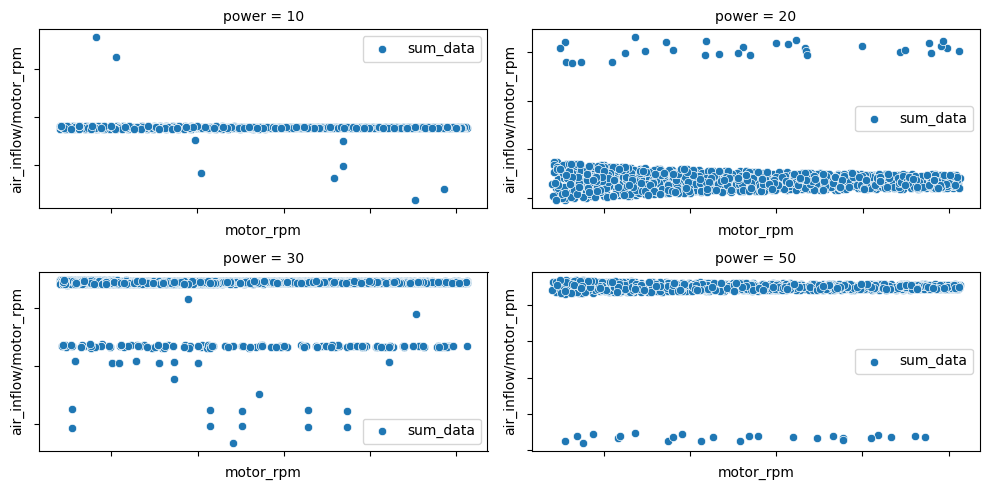

In [31]:
sub_plot_power_all(sum_data_power_10, sum_data_power_20, sum_data_power_30, sum_data_power_50, 'motor_rpm', 'air_inflow/motor_rpm')

In [1830]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
scaler_ = MinMaxScaler(feature_range=(-1,1))
def train_dbscan(data_, x1, x2, eps=0.2, min_samples=7, metric='euclidean'):
    X = data_[x1]
    y = data_[x2]
    z_= np.empty((len(X),2))
    z_[:,0] = X
    z_[:,1] = y
    X_scaled_ = scaler_.fit_transform(z_[:,0].reshape(-1,1))
    y_scaled_ = scaler_.fit_transform(z_[:,1].reshape(-1,1))
    z_scaled_ = np.empty((len(X_scaled_),2))
    z_scaled_[:,0] = X_scaled_.reshape(1,-1)
    z_scaled_[:,1] = y_scaled_.reshape(1,-1)
    
    #   print(pd.DataFrame(z_scaled_).info())
    dbscan_ = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
    dbscan_.fit(z_scaled_)
    labels_ = dbscan_.labels_
    labels__ = np.where(labels_ == 0, 0, 1)
    # labels_[labels_ != 0] = -1
    return dbscan_, z_scaled_, labels__

In [1713]:
def plot_dbscan3(dbscan, X, size, show_xlabels=True, show_ylabels=True):
#     core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
#     core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = X['label'] != 0
    real_mask = X['label'] == 0
#     non_core_mask = ~(core_mask | anomalies_mask)

#     cores = dbscan.components_
    anomalies = X[anomalies_mask]
    real = X[real_mask]
#     non_cores = X[non_core_mask]
    print(len(dbscan.labels_))
#     plt.scatter(cores[:, 0], cores[:, 1],
#                 c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(real['x1'], real['x2'], marker='*', s=20, c='purple')
    plt.scatter(anomalies['x1'], anomalies['x2'],
                c="r", marker="x", s=100)
#     plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)

In [34]:
def plot_dbscan2(dbscan, X, size, show_xlabels=True, show_ylabels=True):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ != 0
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]
    
    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20, c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)

In [1148]:
def plot_dbscan(dbscan, X, labels, size, show_xlabels=True, show_ylabels=True):
    # core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    # core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = labels == -1
    real_mask = labels == 0
    # non_core_mask = ~(core_mask | anomalies_mask)

    # cores = dbscan.components_
    anomalies = X[anomalies_mask]
    real = X[real_mask]
    # non_cores = X[non_core_mask]
    
    # plt.scatter(cores[:, 0], cores[:, 1],
    #             c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(real[:, 0], real[:, 1], marker='*', s=20, c='purple')
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    # plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)

# rpm당 공기흡입량

In [1823]:
test_data['label'] = 0
sum_data = pd.concat([train_data, test_data]).reset_index()
sum_data

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,data_type,...,motor_temp/air_end_temp,motor_temp*air_end_temp,motor_temp*motor_temp,motor_current*motor_temp,motor_current*motor_temp*motor_vibe,motor_current*motor_temp*motor_vibe*motor_rpm,motor_vibe*motor_rpm,motor_vibe/motor_rpm,motor_rpm/motor_vibe,label
0,0,1.59,41.00,0.7,20.53,1680.0,58.67,2.93,0,train,...,1.430976,2405.4700,3442.1689,1204.4951,3529.170643,5.929007e+06,4922.40,0.001744,573.378840,NaN
1,1,2.97,59.28,0.7,38.40,3142.0,74.91,3.75,0,train,...,1.263664,4440.6648,5611.5081,2876.5440,10787.040000,3.389288e+07,11782.50,0.001194,837.866667,NaN
2,2,1.91,45.29,0.7,24.73,2023.0,62.48,3.12,0,train,...,1.379554,2829.7192,3903.7504,1545.1304,4820.806848,9.752492e+06,6311.76,0.001542,648.397436,NaN
3,3,2.37,51.33,0.7,30.63,2506.0,67.84,3.39,0,train,...,1.321644,3482.2272,4602.2656,2077.9392,7044.213888,1.765280e+07,8495.34,0.001353,739.233038,NaN
4,4,1.90,45.21,0.7,24.65,2017.0,62.41,3.12,0,train,...,1.380447,2821.5561,3895.0081,1538.4065,4799.828280,9.681254e+06,6293.04,0.001547,646.474359,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9831,7384,2.12,48.08,0.7,27.45,2246.0,64.96,3.25,7,test,...,1.351082,3123.2768,4219.8016,1783.1520,5795.244000,1.301612e+07,7299.50,0.001447,691.076923,0.0
9832,7385,1.48,39.63,0.7,19.19,1570.0,57.44,2.87,7,test,...,1.449407,2276.3472,3299.3536,1102.2736,3163.525232,4.966735e+06,4505.90,0.001828,547.038328,0.0
9833,7386,1.56,40.61,0.7,20.15,1649.0,58.32,2.92,7,test,...,1.436099,2368.3752,3401.2224,1175.1480,3431.432160,5.658432e+06,4815.08,0.001771,564.726027,0.0
9834,7387,1.59,40.99,0.7,20.52,1679.0,58.66,2.93,7,test,...,1.431081,2404.4734,3440.9956,1203.7032,3526.850376,5.921582e+06,4919.47,0.001745,573.037543,0.0


In [1824]:
for i in range(8):
  globals()['test_data_{}'.format(i)] = test_data[test_data['type'] == i].reset_index()
for i in range(8):
  globals()['train_data_{}'.format(i)] = train_data[train_data['type'] == i].reset_index()
for i in range(8):
  globals()['sum_data_{}'.format(i)] = sum_data[sum_data['type'] == i].reset_index()

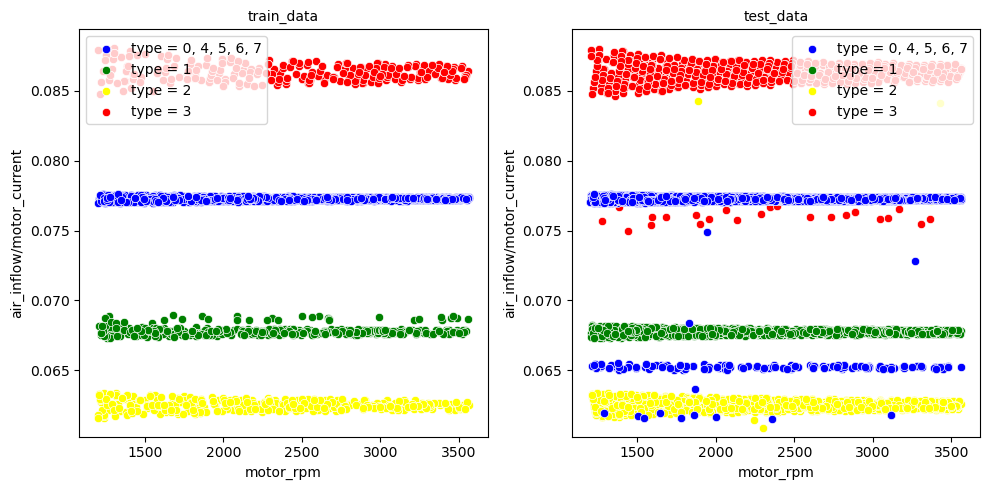

In [1825]:
sub_plot_corr(train_data, test_data, 'motor_rpm', 'air_inflow/motor_current')

In [1826]:
train_data_0

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,data_type,...,motor_vibe/motor_temp,motor_temp/air_end_temp,motor_temp*air_end_temp,motor_temp*motor_temp,motor_current*motor_temp,motor_current*motor_temp*motor_vibe,motor_current*motor_temp*motor_vibe*motor_rpm,motor_vibe*motor_rpm,motor_vibe/motor_rpm,motor_rpm/motor_vibe
0,0,1.59,41.00,0.7,20.53,1680.0,58.67,2.93,0,train,...,0.049940,1.430976,2405.4700,3442.1689,1204.4951,3529.170643,5.929007e+06,4922.40,0.001744,573.378840
1,1,2.97,59.28,0.7,38.40,3142.0,74.91,3.75,0,train,...,0.050060,1.263664,4440.6648,5611.5081,2876.5440,10787.040000,3.389288e+07,11782.50,0.001194,837.866667
2,2,1.91,45.29,0.7,24.73,2023.0,62.48,3.12,0,train,...,0.049936,1.379554,2829.7192,3903.7504,1545.1304,4820.806848,9.752492e+06,6311.76,0.001542,648.397436
3,3,2.37,51.33,0.7,30.63,2506.0,67.84,3.39,0,train,...,0.049971,1.321644,3482.2272,4602.2656,2077.9392,7044.213888,1.765280e+07,8495.34,0.001353,739.233038
4,4,1.90,45.21,0.7,24.65,2017.0,62.41,3.12,0,train,...,0.049992,1.380447,2821.5561,3895.0081,1538.4065,4799.828280,9.681254e+06,6293.04,0.001547,646.474359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427,427,1.32,37.49,0.7,17.10,1399.0,55.54,2.78,0,train,...,0.050054,1.481462,2082.1946,3084.6916,949.7340,2640.260520,3.693724e+06,3889.22,0.001987,503.237410
428,428,1.80,43.85,0.7,23.32,1908.0,61.20,3.06,0,train,...,0.050000,1.395667,2683.6200,3745.4400,1427.1840,4367.183040,8.332585e+06,5838.48,0.001604,623.529412
429,429,2.79,56.99,0.7,36.17,2959.0,72.88,3.64,0,train,...,0.049945,1.278821,4153.4312,5311.4944,2636.0696,9595.293344,2.839247e+07,10770.76,0.001230,812.912088
430,430,2.25,49.79,0.7,29.13,2383.0,66.48,3.32,0,train,...,0.049940,1.335208,3310.0392,4419.5904,1936.5624,6429.387168,1.532123e+07,7911.56,0.001393,717.771084


In [1831]:
dbscan, z_scaled, labels = train_dbscan(sum_data_0, 'motor_rpm', 'air_inflow/motor_current', eps=0.1)
dbscan1, z_scaled1, labels1 = train_dbscan(sum_data_1, 'motor_rpm', 'air_inflow/motor_current', eps=0.2)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_2, 'motor_rpm', 'air_inflow/motor_current', eps=0.05)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_3, 'motor_rpm', 'air_inflow/motor_current', eps=0.3)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_4, 'motor_rpm', 'air_inflow/motor_current', eps=0.1)
dbscan5, z_scaled5, labels5 = train_dbscan(sum_data_5, 'motor_rpm', 'air_inflow/motor_current', eps=0.3)
dbscan6, z_scaled6, labels6 = train_dbscan(sum_data_6, 'motor_rpm', 'air_inflow/motor_current', eps=0.1)
dbscan7, z_scaled7, labels7 = train_dbscan(sum_data_7, 'motor_rpm', 'air_inflow/motor_current', eps=0.3)

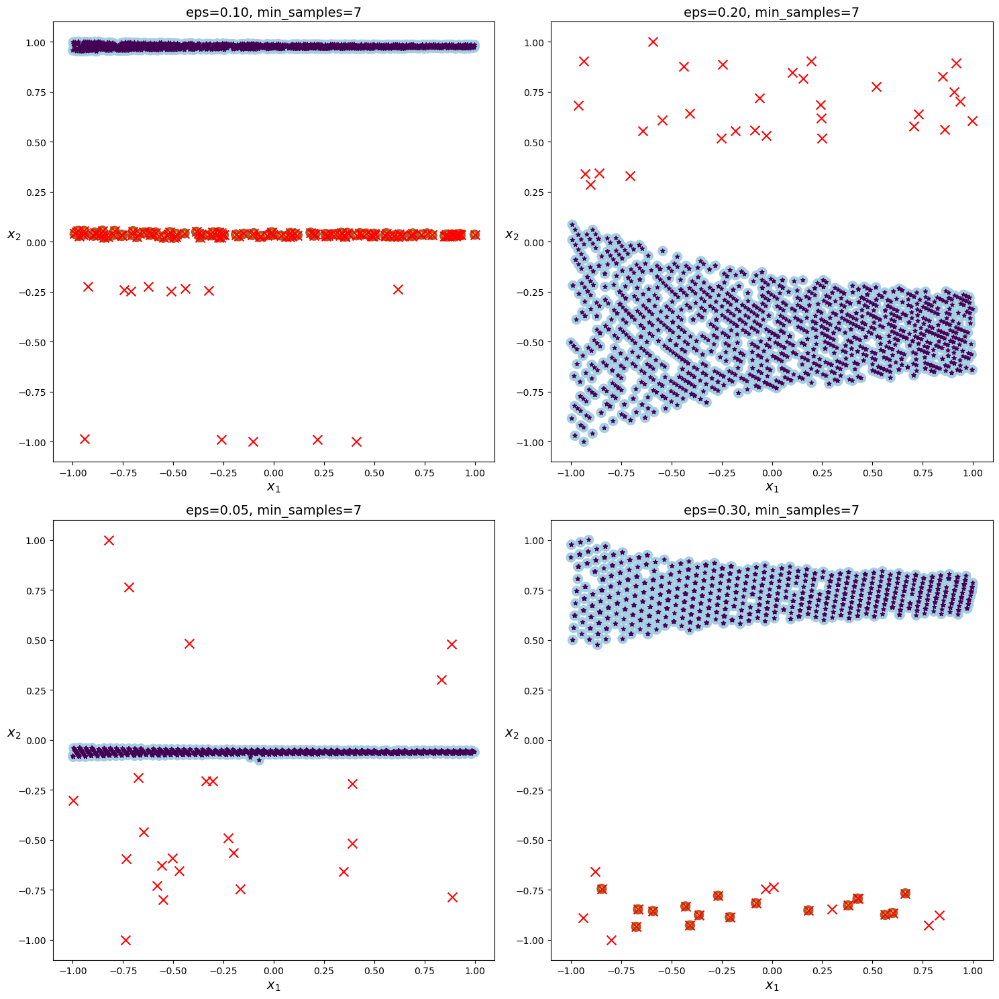

In [1832]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan1, z_scaled1, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan2,z_scaled2, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan3, z_scaled3, size=100)

plt.tight_layout()

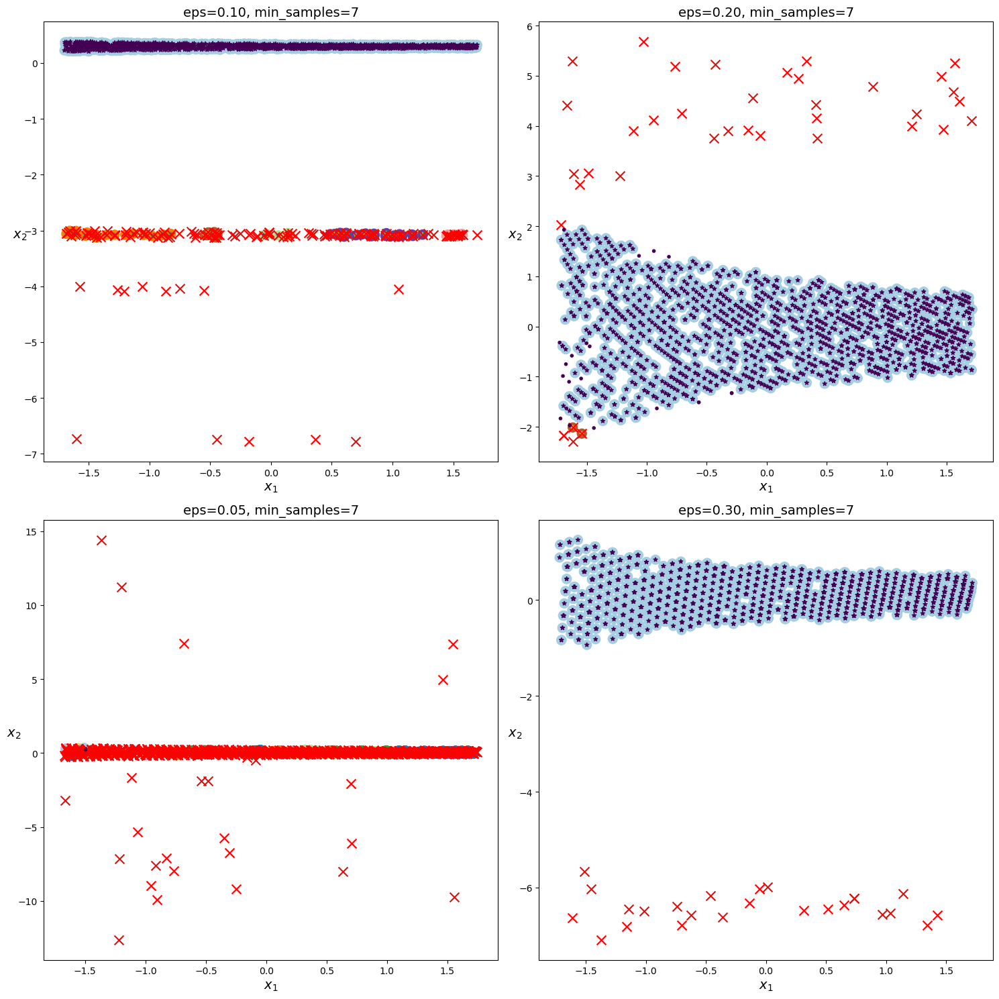

In [1829]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan1, z_scaled1, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan2,z_scaled2, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan3, z_scaled3, size=100)

plt.tight_layout()

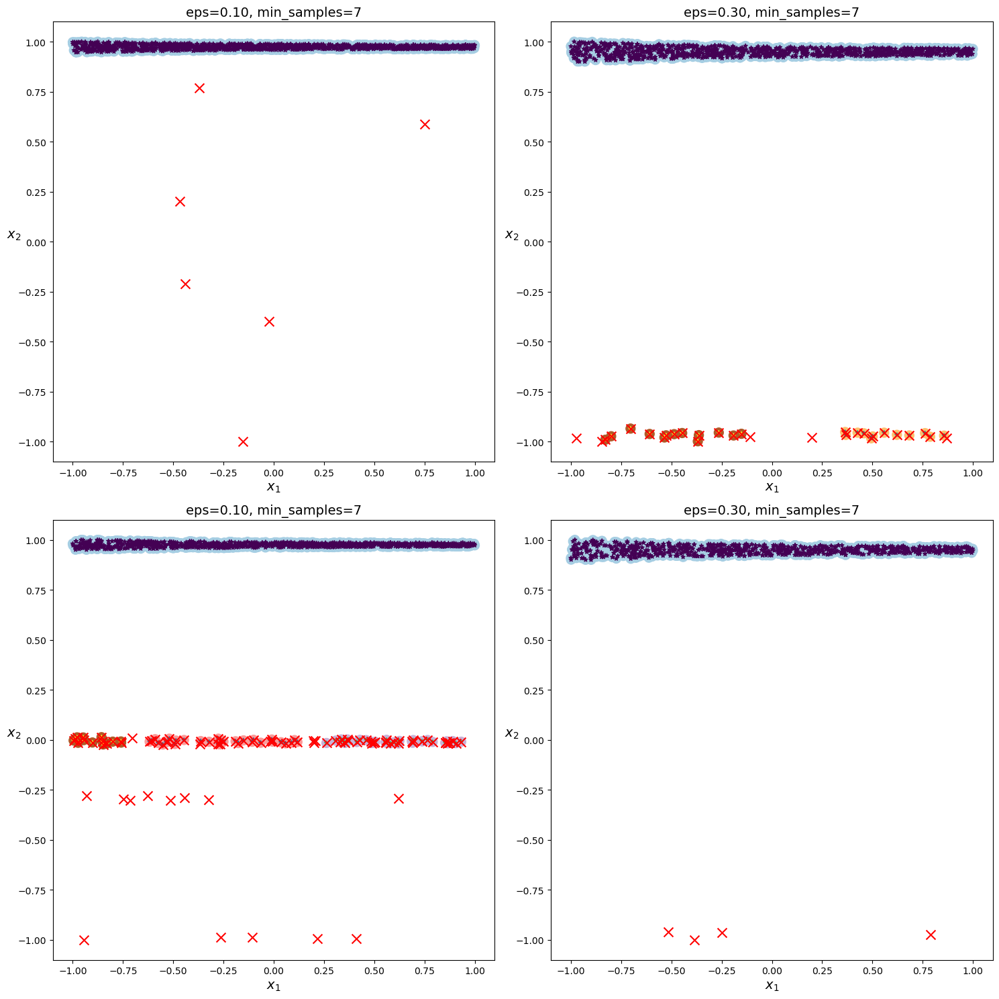

In [1767]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan5, z_scaled5, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan6,z_scaled6, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan7, z_scaled7, size=100)

plt.tight_layout()

In [1768]:
real_data_power_0 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels, columns=['label']),
                                sum_data_0['index'],sum_data_0['data_type']], axis=1).reset_index(drop=True)
real_data_power_1 = pd.concat([pd.DataFrame(z_scaled1, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                               sum_data_1['index'],sum_data_1['data_type']], axis=1).reset_index(drop=True)
real_data_power_2 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_2['index'],sum_data_2['data_type']], axis=1).reset_index(drop=True)
real_data_power_3 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                                sum_data_3['index'],sum_data_3['data_type']], axis=1).reset_index(drop=True)
real_data_power_4 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_4['index'],sum_data_4['data_type']], axis=1).reset_index(drop=True)
real_data_power_5 = pd.concat([pd.DataFrame(z_scaled5, columns=['x1', 'x2']),pd.DataFrame(labels5, columns=['label']),
                               sum_data_5['index'],sum_data_5['data_type']], axis=1).reset_index(drop=True)
real_data_power_6 = pd.concat([pd.DataFrame(z_scaled6, columns=['x1', 'x2']),pd.DataFrame(labels6, columns=['label']),
                               sum_data_6['index'],sum_data_6['data_type']], axis=1).reset_index(drop=True)
real_data_power_7 = pd.concat([pd.DataFrame(z_scaled7, columns=['x1', 'x2']),pd.DataFrame(labels7, columns=['label']),
                                sum_data_7['index'],sum_data_7['data_type']], axis=1).reset_index(drop=True)



train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

In [1769]:
def sub_plot_corr(data,data2,  name1, name2):
  plt.figure(figsize=(10,5))
  correlation = data[name1].corr(data[name2])
  j = 0
  color = ['green', 'yellow', 'red']
  for i in range(8):
    globals()['data{}'.format(i)] = data[data['type'] == i]
    plt.subplot(1,2,1)
    if i == 1 or i == 2 or i == 3:
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue')
  g.set_title("train_data", size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
  j = 0
  for i in range(8):
    globals()['data{}'.format(i)] = data2[data2['type'] == i]
    plt.subplot(1,2,2)
    if i == 1 or i == 2 or i == 3:
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color=color[j])
      j += 1
    else :
      g2 = sns.scatterplot(data=globals()['data{}'.format(i)], x=name1, y=name2, color='blue') 
  g2.set_title("test_data", size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = 0, 4, 5, 6, 7','type = 1', 'type = 2','type = 3'])
  plt.tight_layout()
  plt.show()

In [1770]:
def sub_plot_corr2(train_data, test_data, name1, name2):
    g = sns.scatterplot(data=train_data, x=name1, y=name2, s= 70, markers='*' )
    g = sns.scatterplot(data=test_data, x=name1, y=name2, s=40, alpha=0.2)
    mask = test_data['label'] == 1
    g = sns.scatterplot(data=test_data[mask], x=name1, y=name2, color="black")
    g.set_title("train_data & test_data", size=10)
#     g.set_xticklabels(g.get_xticklabels())
#     g.set_yticklabels(g.get_yticklabels())
    plt.legend(labels=['train','test'])
    plt.show()

In [1771]:
import numpy as np
import scipy as sp

def dbscan_predict(dbscan_model, X_new, metric=sp.spatial.distance.euclidean):
    # Result is noise by default
    y_new = np.ones(shape=len(X_new), dtype=int)*-1 

    # Iterate all input samples for a label
    for j, x_new in enumerate(X_new):
        # Find a core sample closer than EPS
        for i, x_core in enumerate(dbscan_model.components_): 
            if metric(x_new, x_core) < dbscan_model.eps:
                # Assign label of x_core to x_new
                y_new[j] = dbscan_model.labels_[dbscan_model.core_sample_indices_[i]]
                break

    return y_new

In [1772]:
dbscan_predict(dbscan, np.array([[-0.5, -0.6],[0,0]]))

array([-1,  1])

1728


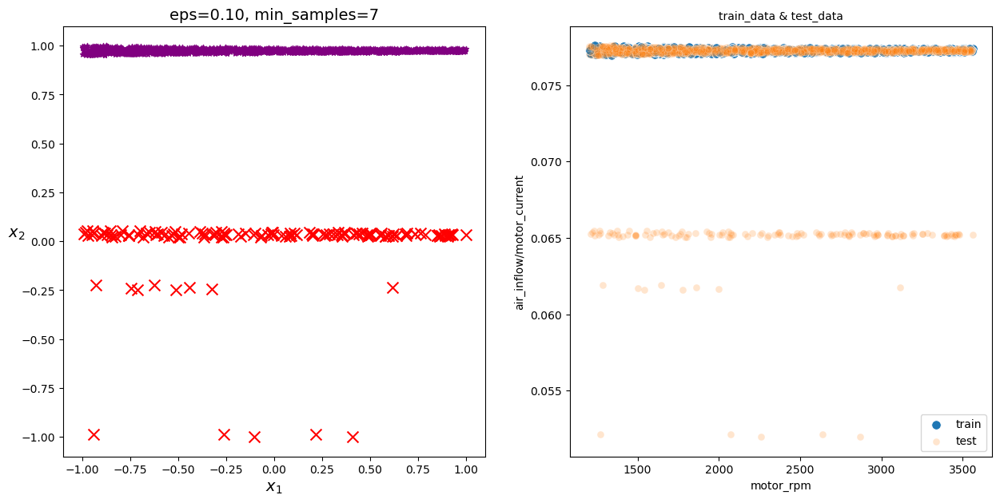

<Figure size 640x480 with 0 Axes>

In [1773]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_0, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_0, test_data_0, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

1460


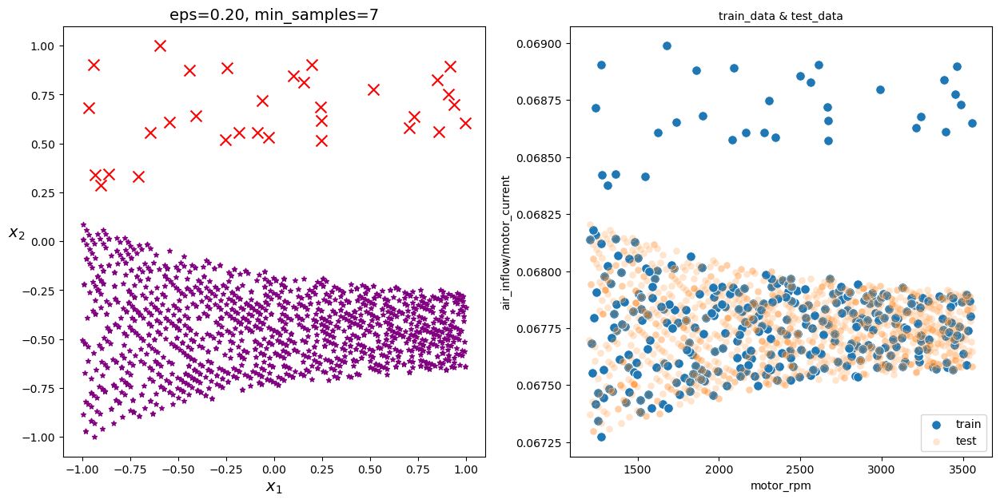

<Figure size 640x480 with 0 Axes>

In [1774]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan1, real_data_power_1, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_1, test_data_1, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

1464


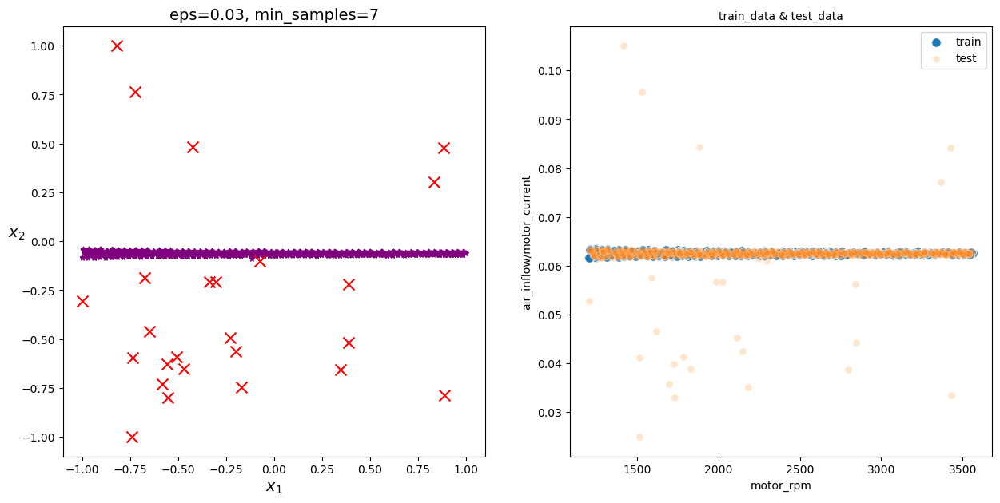

<Figure size 640x480 with 0 Axes>

In [1775]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_2, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_2, test_data_2, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

In [1783]:
real_data_power_2['label'][real_data_power_2['x2'] > 0]=0 
real_data_power_2['label'][real_data_power_2['x2'] > 0]

610    0
611    0
616    0
621    0
629    0
Name: label, dtype: int32

1224


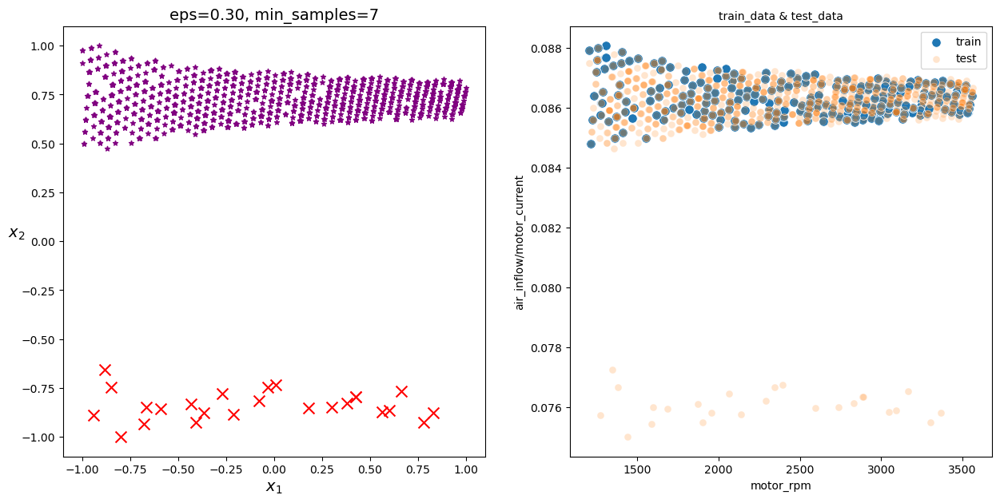

<Figure size 640x480 with 0 Axes>

In [1776]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_3, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_3, test_data_3, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

1224


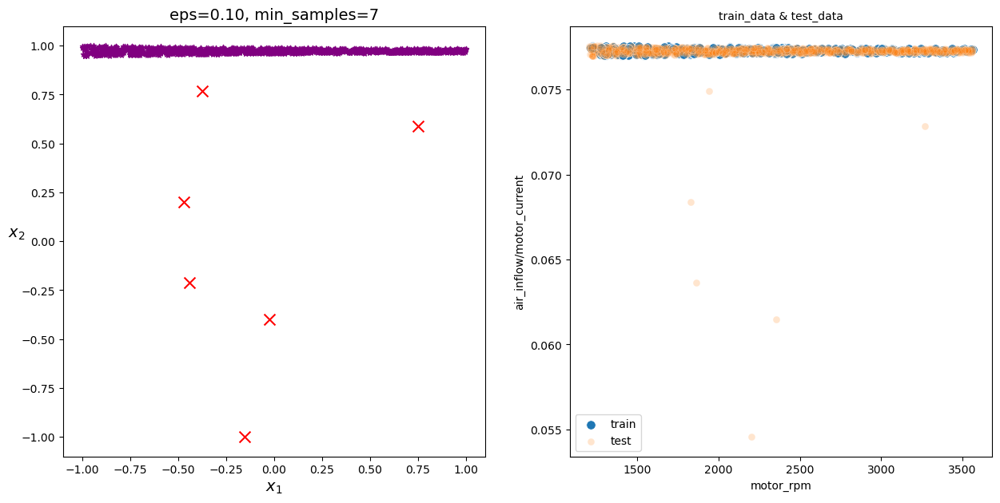

<Figure size 640x480 with 0 Axes>

In [1777]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_4, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_4, test_data_4, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

996


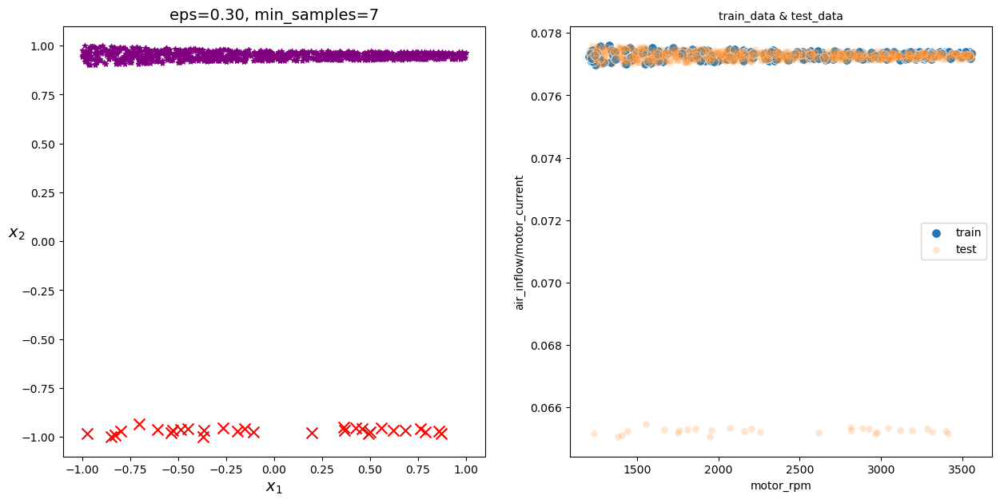

<Figure size 640x480 with 0 Axes>

In [1778]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan5, real_data_power_5, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_5, test_data_5, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

996


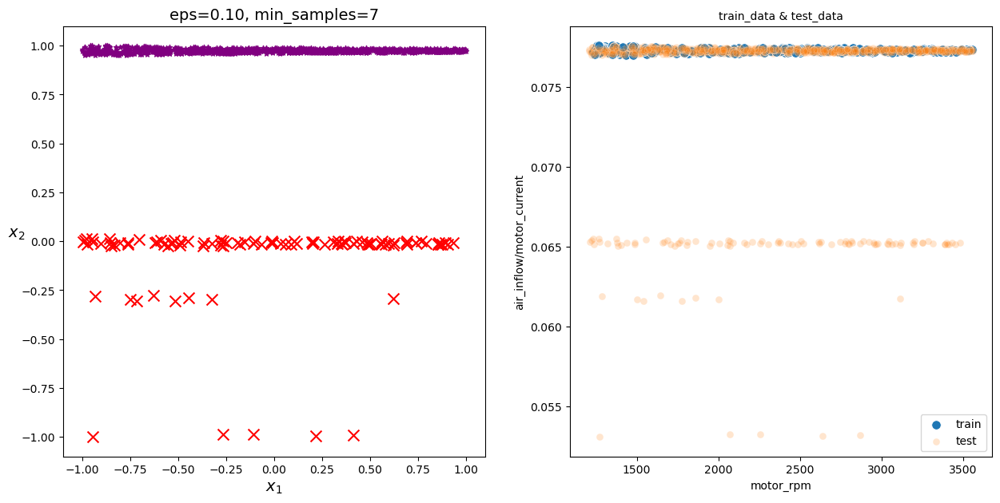

<Figure size 640x480 with 0 Axes>

In [1779]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan6, real_data_power_6, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_6, test_data_6, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

744


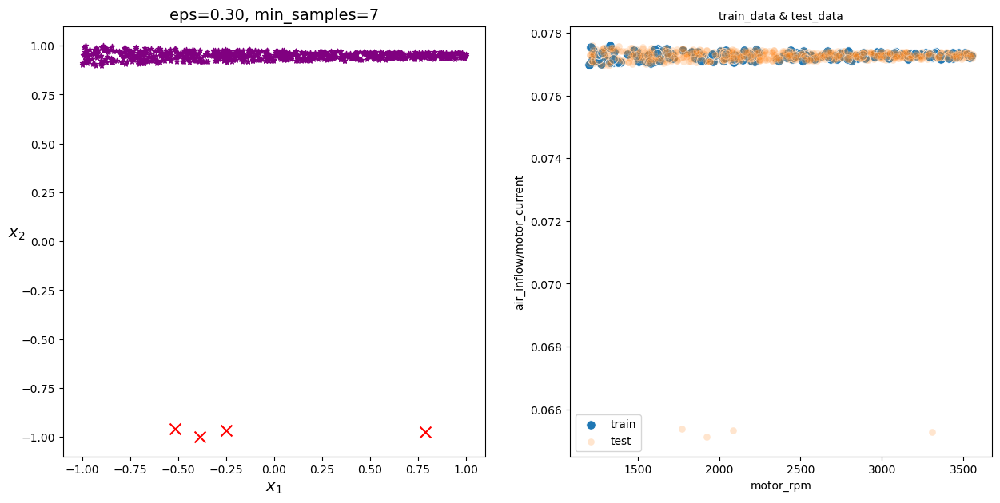

<Figure size 640x480 with 0 Axes>

In [1781]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan7, real_data_power_7, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_7, test_data_7, 'motor_rpm','air_inflow/motor_current')

plt.tight_layout()

In [1784]:
final_data = pd.concat([real_data_power_0[real_data_power_0['data_type'] == 'test'], real_data_power_1[real_data_power_1['data_type'] == 'test'],
           real_data_power_2[real_data_power_2['data_type'] == 'test'], real_data_power_3[real_data_power_3['data_type'] == 'test'],
                       real_data_power_4[real_data_power_4['data_type'] == 'test'], real_data_power_5[real_data_power_5['data_type'] == 'test'],
                       real_data_power_6[real_data_power_6['data_type'] == 'test'], real_data_power_7[real_data_power_7['data_type'] == 'test']])

In [1559]:
# final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
#            real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])

In [1785]:
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [1786]:
submission = pd.read_csv('dataset/answer_sample.csv')
submission['label']=0
submission

,type,label
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
7384,7,0
7385,7,0
7386,7,0
7387,7,0


In [1787]:
submission['label'] = final_data['label']

In [1567]:
submission['label'].value_counts()

0    7073
1     316
Name: label, dtype: int64

In [1788]:
submission['label'].value_counts()

0    7060
1     329
Name: label, dtype: int64

In [1789]:
submission['label'][test_data[test_data['out_pressure'] != 0.7]['out_pressure'].index] = 1

In [1790]:
submission['label'].value_counts()

0    7053
1     336
Name: label, dtype: int64

In [1791]:
test_data['label'] = submission['label']

In [1792]:
for i in range(8):
  globals()['test_data_{}'.format(i)] = test_data[test_data['type'] == i].reset_index()
for i in range(8):
  globals()['train_data_{}'.format(i)] = train_data[train_data['type'] == i].reset_index()

# 전류당 진동

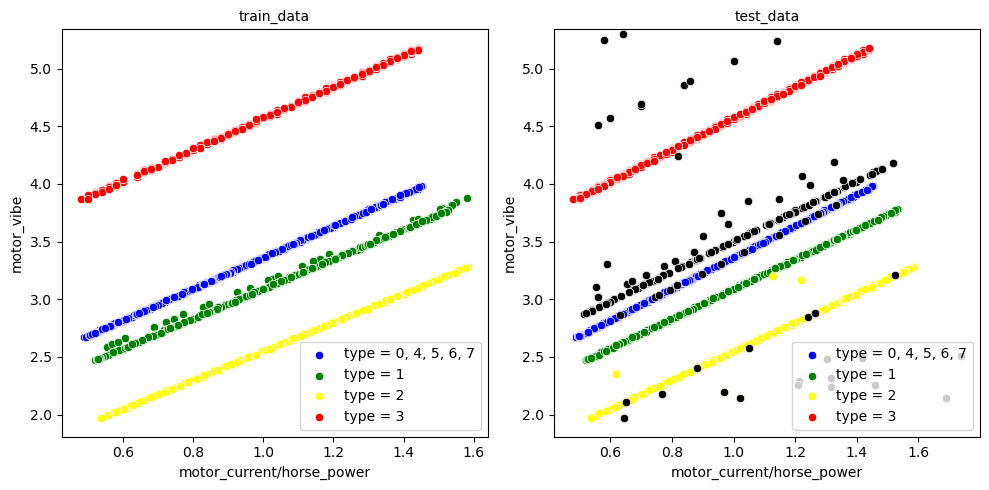

In [1797]:
sub_plot_corr(train_data, test_data, 'motor_current/horse_power', 'motor_vibe')

In [1799]:
dbscan, z_scaled, labels = train_dbscan(sum_data_0, 'motor_current/horse_power', 'motor_vibe', eps=0.1)
dbscan1, z_scaled1, labels1 = train_dbscan(sum_data_1, 'motor_current/horse_power', 'motor_vibe', eps=0.2)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_2, 'motor_current/horse_power', 'motor_vibe', eps=0.02)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_3, 'motor_current/horse_power', 'motor_vibe', eps=0.3)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_4, 'motor_current/horse_power', 'motor_vibe', eps=0.1)
dbscan5, z_scaled5, labels5 = train_dbscan(sum_data_5, 'motor_current/horse_power', 'motor_vibe', eps=0.3)
dbscan6, z_scaled6, labels6 = train_dbscan(sum_data_6, 'motor_current/horse_power', 'motor_vibe', eps=0.1)
dbscan7, z_scaled7, labels7 = train_dbscan(sum_data_7, 'motor_current/horse_power', 'motor_vibe', eps=0.3)

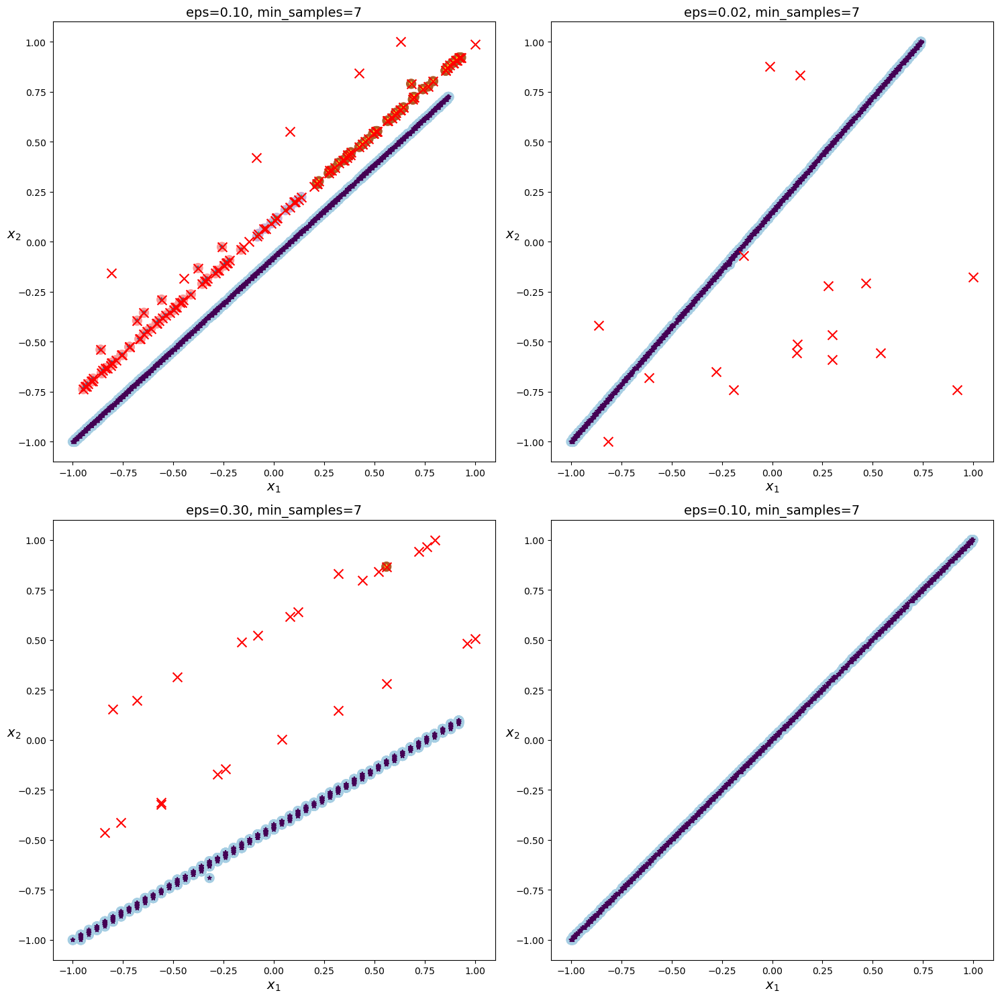

In [1800]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

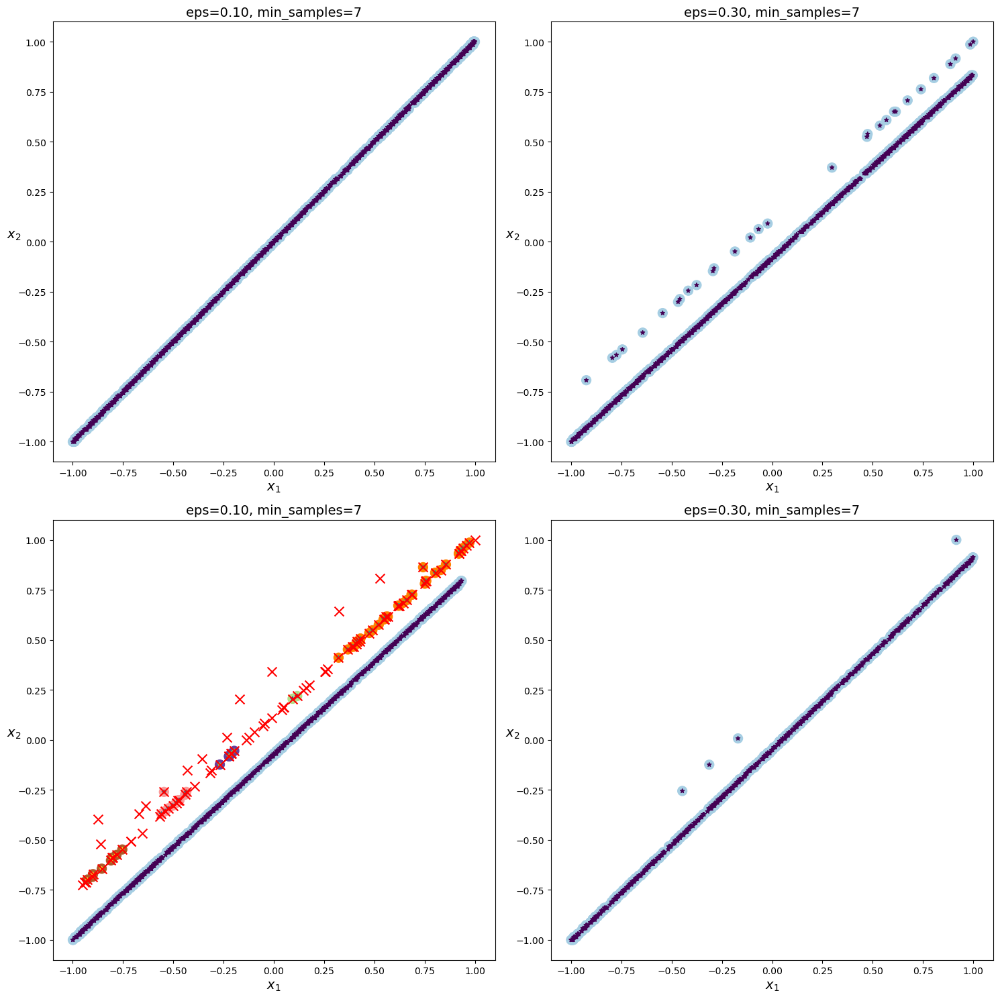

In [1801]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan5, z_scaled5, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan6,z_scaled6, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan7, z_scaled7, size=100)

plt.tight_layout()

In [1802]:
real_data_power_0 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels, columns=['label']),
                                sum_data_0['index'],sum_data_0['data_type']], axis=1).reset_index(drop=True)
real_data_power_1 = pd.concat([pd.DataFrame(z_scaled1, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                               sum_data_1['index'],sum_data_1['data_type']], axis=1).reset_index(drop=True)
real_data_power_2 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_2['index'],sum_data_2['data_type']], axis=1).reset_index(drop=True)
real_data_power_3 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                                sum_data_3['index'],sum_data_3['data_type']], axis=1).reset_index(drop=True)
real_data_power_4 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_4['index'],sum_data_4['data_type']], axis=1).reset_index(drop=True)
real_data_power_5 = pd.concat([pd.DataFrame(z_scaled5, columns=['x1', 'x2']),pd.DataFrame(labels5, columns=['label']),
                               sum_data_5['index'],sum_data_5['data_type']], axis=1).reset_index(drop=True)
real_data_power_6 = pd.concat([pd.DataFrame(z_scaled6, columns=['x1', 'x2']),pd.DataFrame(labels6, columns=['label']),
                               sum_data_6['index'],sum_data_6['data_type']], axis=1).reset_index(drop=True)
real_data_power_7 = pd.concat([pd.DataFrame(z_scaled7, columns=['x1', 'x2']),pd.DataFrame(labels7, columns=['label']),
                                sum_data_7['index'],sum_data_7['data_type']], axis=1).reset_index(drop=True)



train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

In [1582]:
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

1728


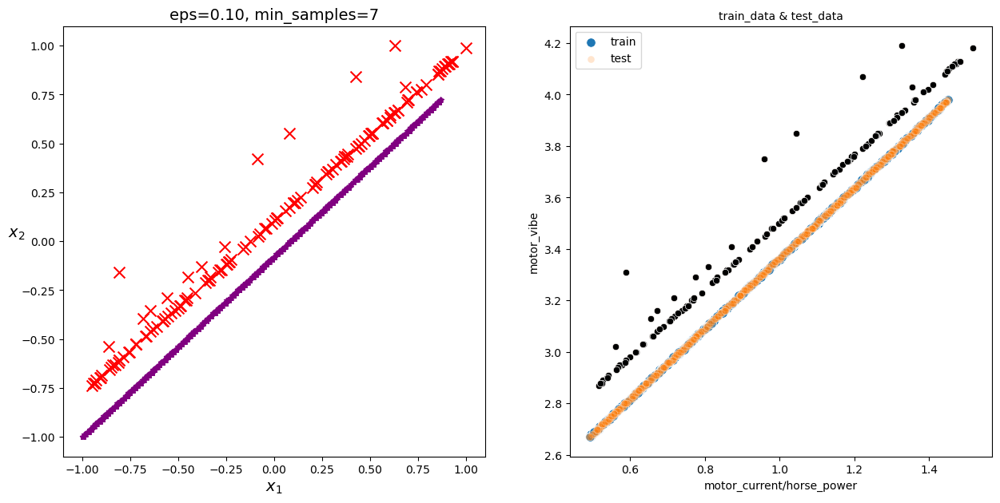

<Figure size 640x480 with 0 Axes>

In [1803]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_0, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_0, test_data_0, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

1460


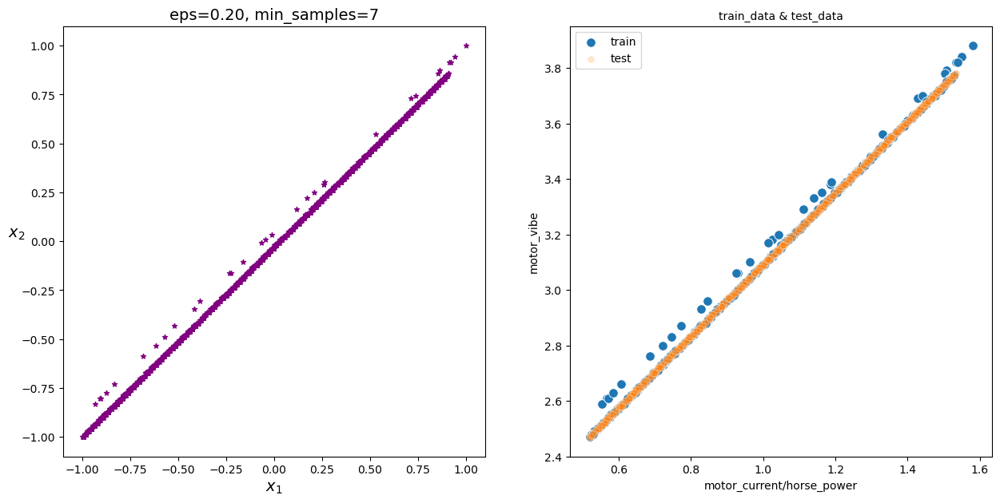

<Figure size 640x480 with 0 Axes>

In [1804]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan1, real_data_power_1, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_1, test_data_1, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

1464


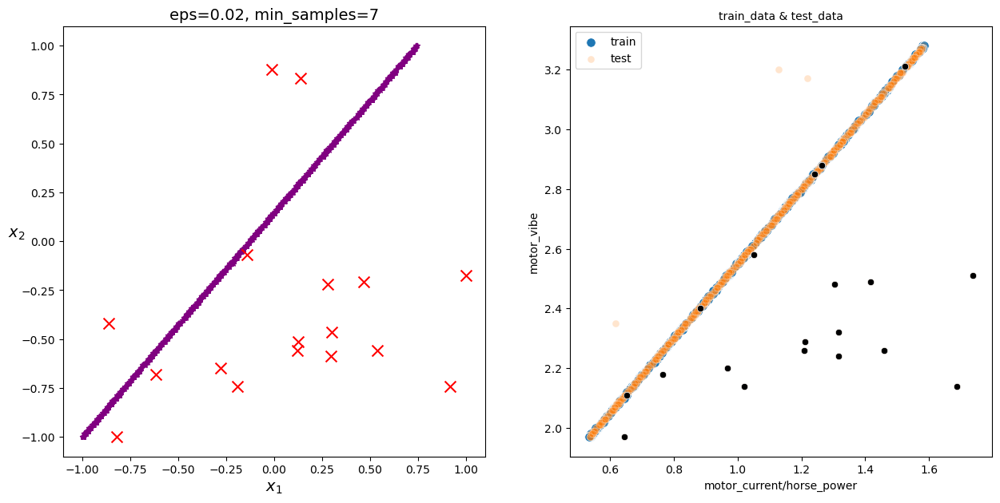

<Figure size 640x480 with 0 Axes>

In [1805]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_2, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_2, test_data_2, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

1224


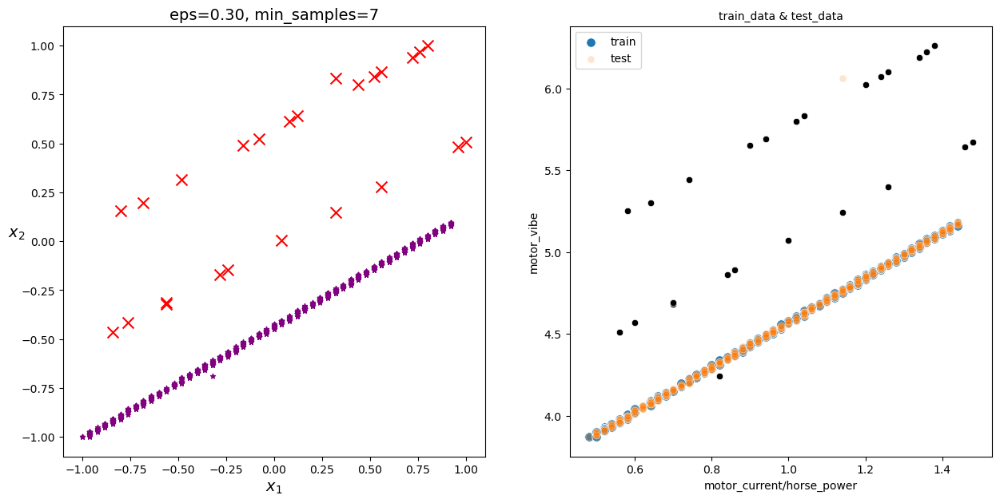

<Figure size 640x480 with 0 Axes>

In [1806]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_3, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_3, test_data_3, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

1224


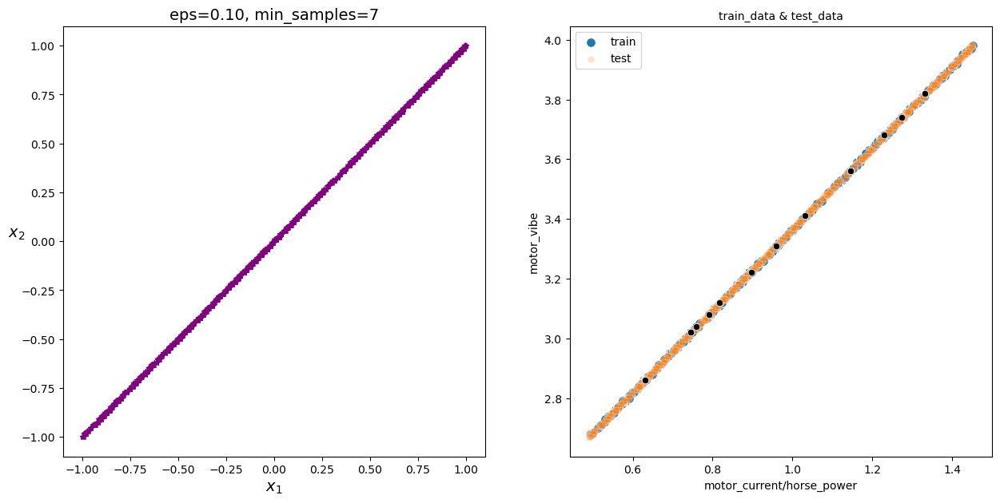

<Figure size 640x480 with 0 Axes>

In [1807]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_4, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_4, test_data_4, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

996


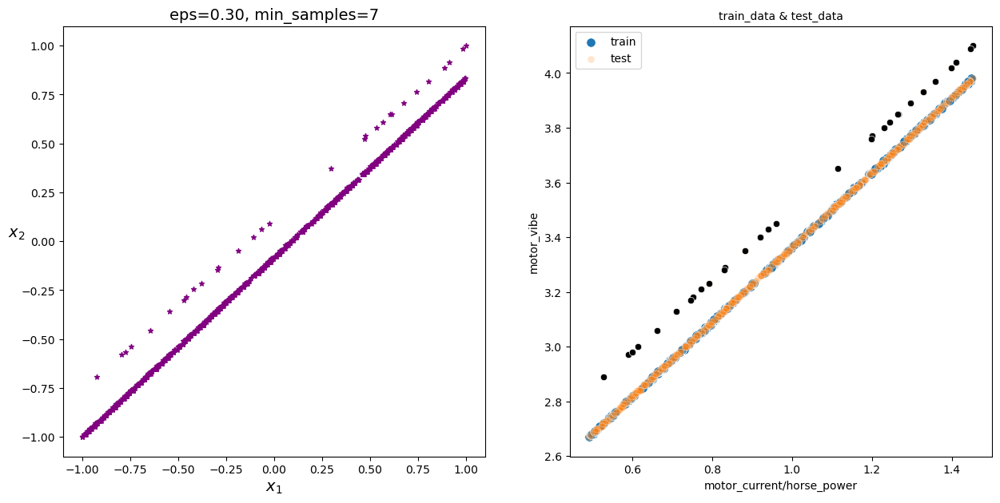

<Figure size 640x480 with 0 Axes>

In [1808]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan5, real_data_power_5, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_5, test_data_5, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

996


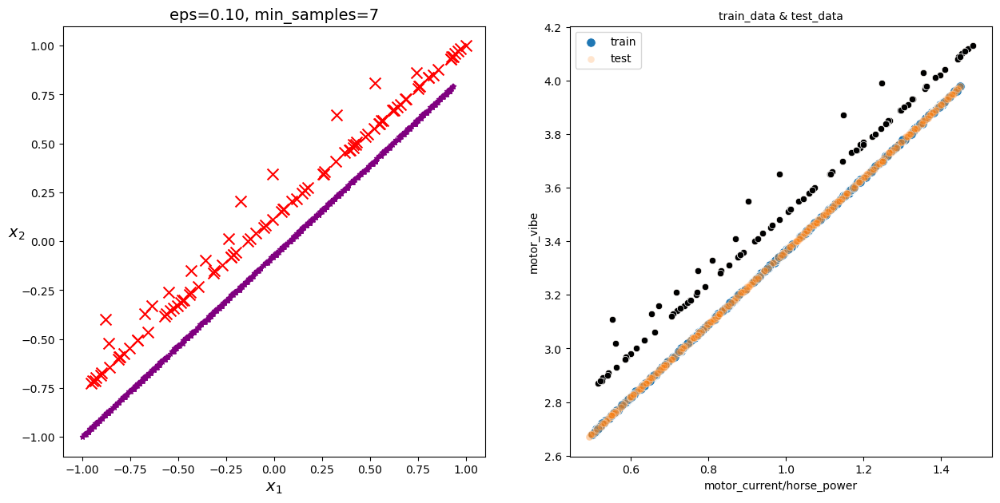

<Figure size 640x480 with 0 Axes>

In [1810]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan6, real_data_power_6, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_6, test_data_6, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

744


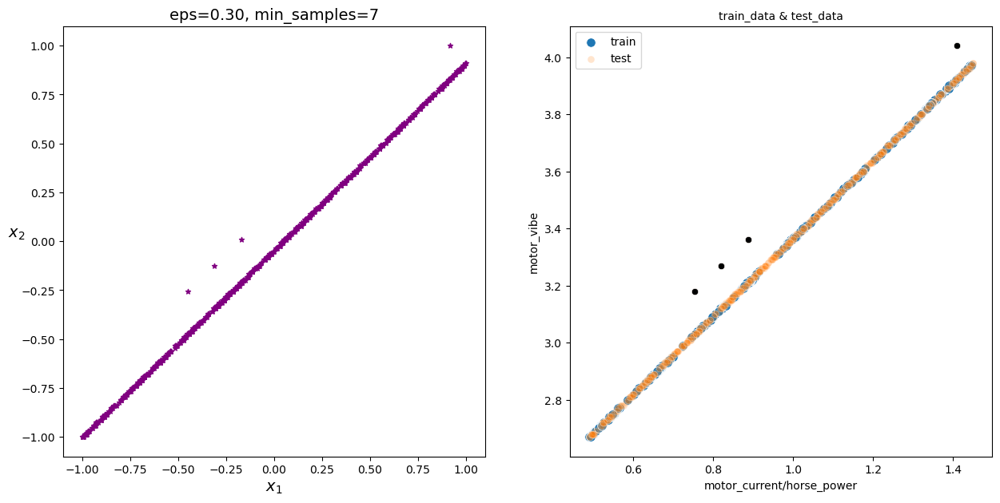

<Figure size 640x480 with 0 Axes>

In [1811]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan7, real_data_power_7, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_7, test_data_7, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

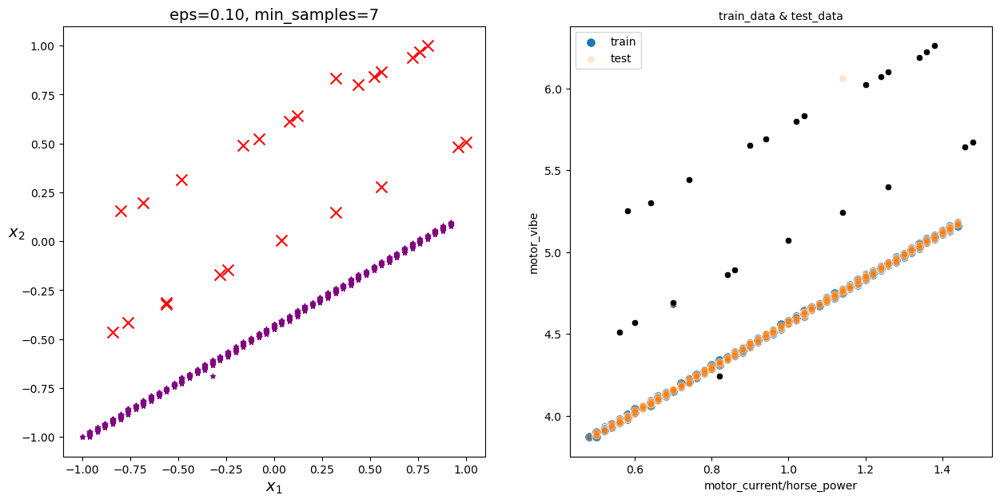

<Figure size 640x480 with 0 Axes>

In [1586]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'motor_current/horse_power', 'motor_vibe')

plt.tight_layout()

In [1812]:
final_data = pd.concat([real_data_power_0[real_data_power_0['data_type'] == 'test'], real_data_power_1[real_data_power_1['data_type'] == 'test'],
           real_data_power_2[real_data_power_2['data_type'] == 'test'], real_data_power_3[real_data_power_3['data_type'] == 'test'],
                       real_data_power_4[real_data_power_4['data_type'] == 'test'], real_data_power_5[real_data_power_5['data_type'] == 'test'],
                       real_data_power_6[real_data_power_6['data_type'] == 'test'], real_data_power_7[real_data_power_7['data_type'] == 'test']])

In [1599]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])

In [1813]:
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [1814]:
submission['label'].value_counts()

0    7053
1     336
Name: label, dtype: int64

In [1604]:
submission['label'].value_counts()

0    7073
1     316
Name: label, dtype: int64

In [1815]:
submission2 = submission.copy()

In [1816]:
submission2['label'][final_data[final_data['label'] == 1]['label'].index] = 1

In [1608]:
submission2['label'].value_counts()

0    7051
1     338
Name: label, dtype: int64

In [1817]:
submission2['label'].value_counts()

0    7049
1     340
Name: label, dtype: int64

In [1818]:
submission.to_csv('0411_4.csv', index=False)

# 전류당 온도

In [1819]:
test_data['label'] = submission2['label']
for i in range(8):
  globals()['test_data_{}'.format(i)] = test_data[test_data['type'] == i].reset_index()

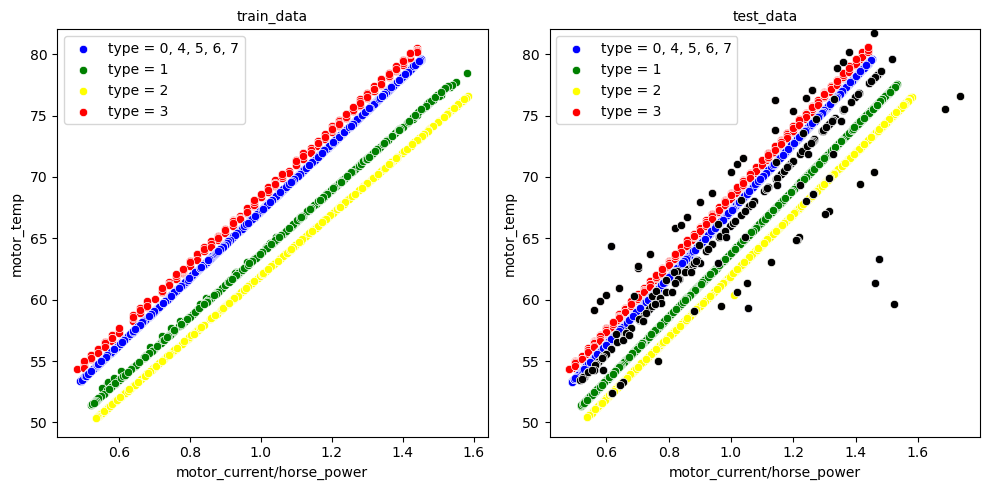

In [1820]:
sub_plot_corr(train_data, test_data, 'motor_current/horse_power', 'motor_temp')

In [1622]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'motor_current/horse_power', 'motor_temp', eps=0.05)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'motor_current/horse_power', 'motor_temp', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'motor_current/horse_power', 'motor_temp', eps=0.01)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'motor_current/horse_power', 'motor_temp', eps=0.045)
dbscan4_, z_scaled4_, labels4_ = train_dbscan(sum_data_power_50, 'motor_current/horse_power', 'motor_temp', eps=0.05)

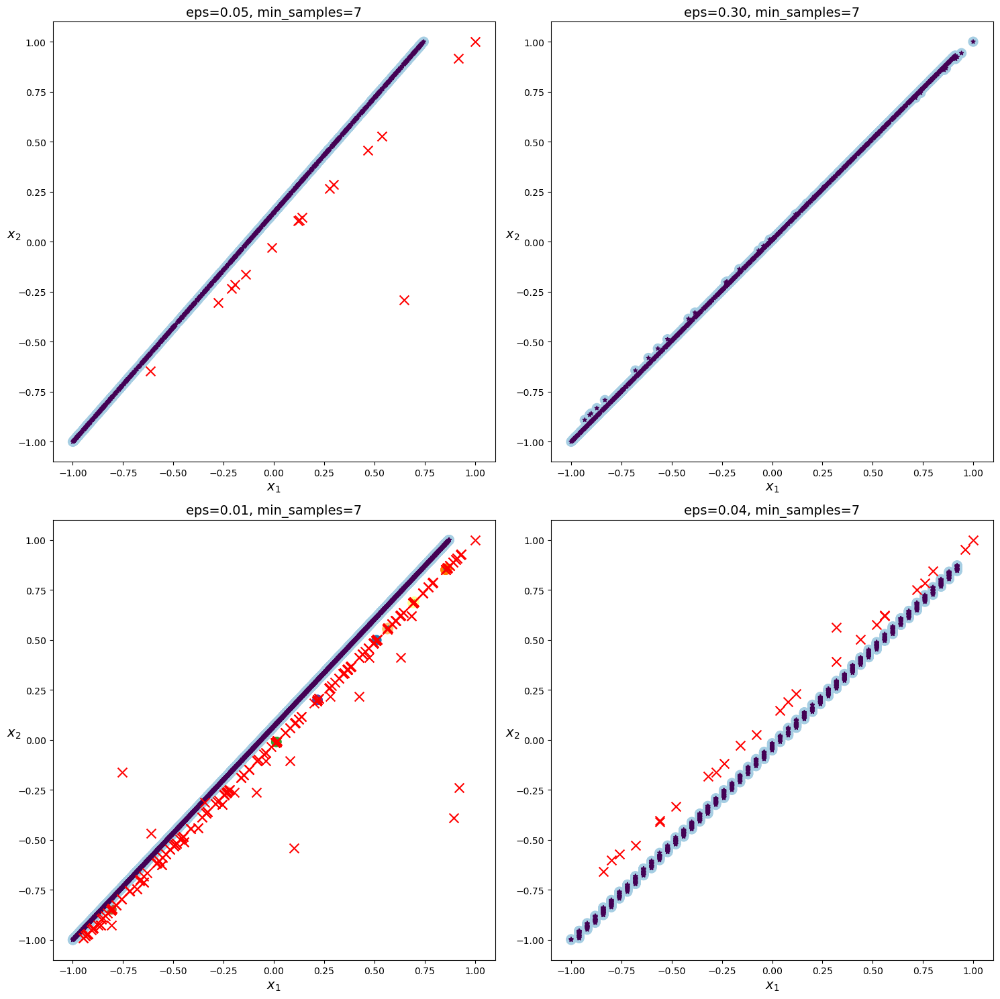

In [1623]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1624]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)
real_data_power_50_ = pd.concat([pd.DataFrame(z_scaled4_, columns=['x1', 'x2']),pd.DataFrame(labels4_, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)

In [1625]:
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

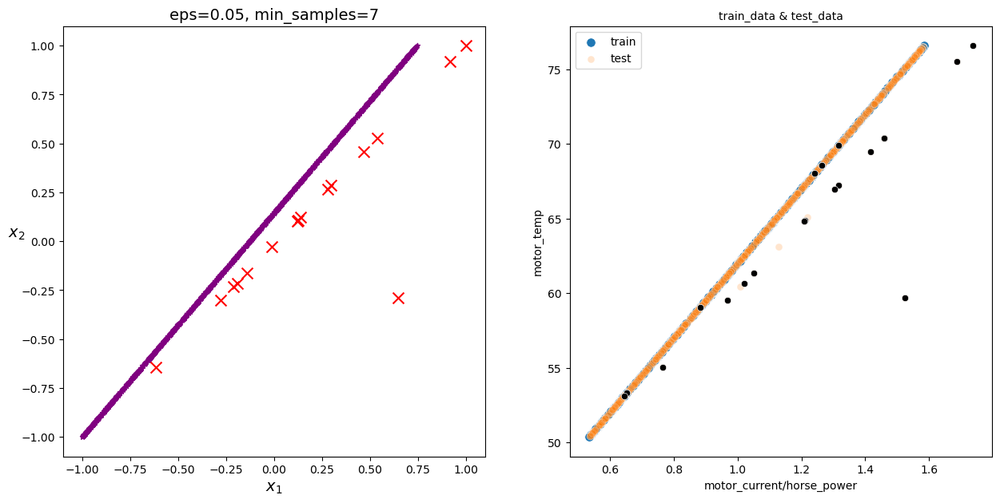

<Figure size 640x480 with 0 Axes>

In [1626]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'motor_current/horse_power', 'motor_temp')

plt.tight_layout()

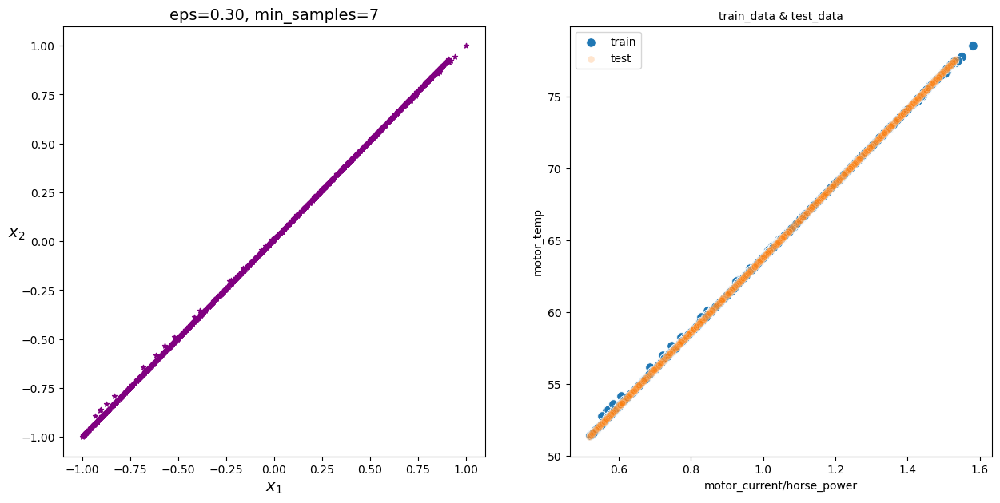

<Figure size 640x480 with 0 Axes>

In [1627]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'motor_current/horse_power', 'motor_temp')

plt.tight_layout()

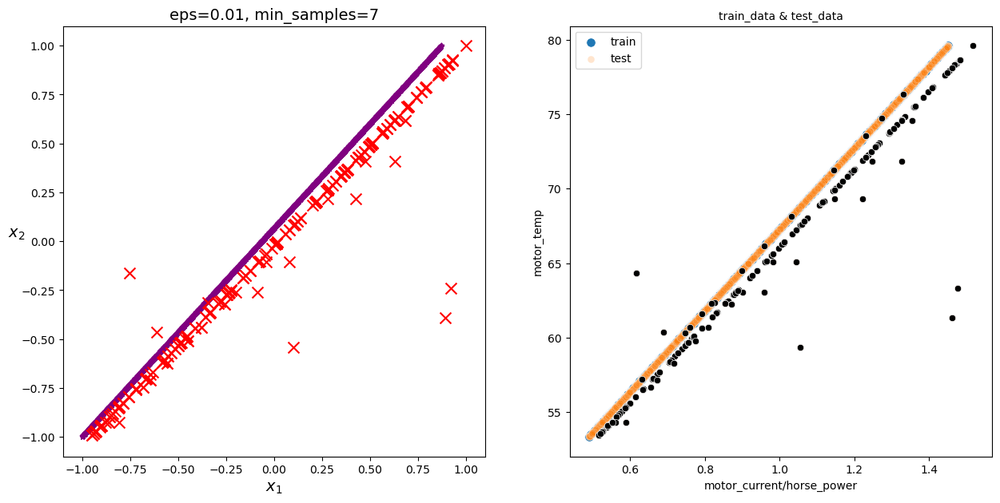

<Figure size 640x480 with 0 Axes>

In [1628]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'motor_current/horse_power', 'motor_temp')

plt.tight_layout()

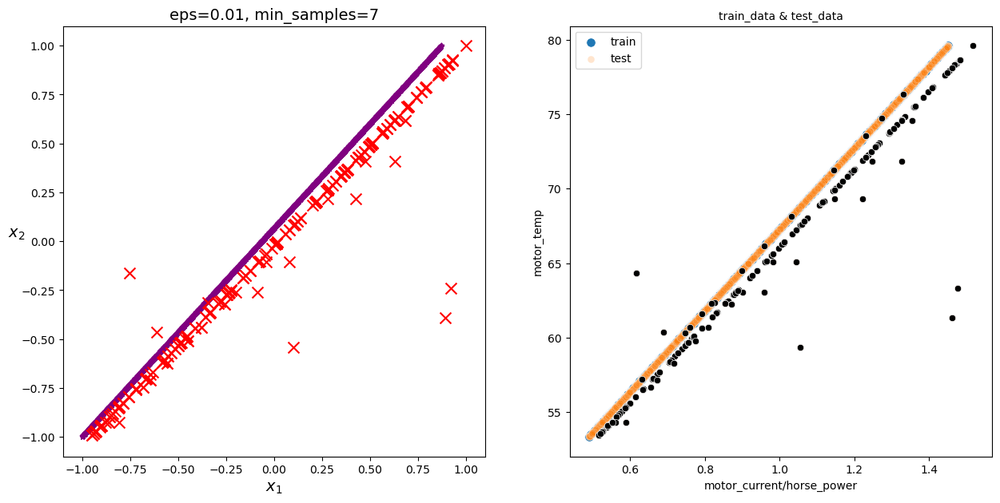

<Figure size 640x480 with 0 Axes>

In [1629]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'motor_current/horse_power', 'motor_temp')

plt.tight_layout()

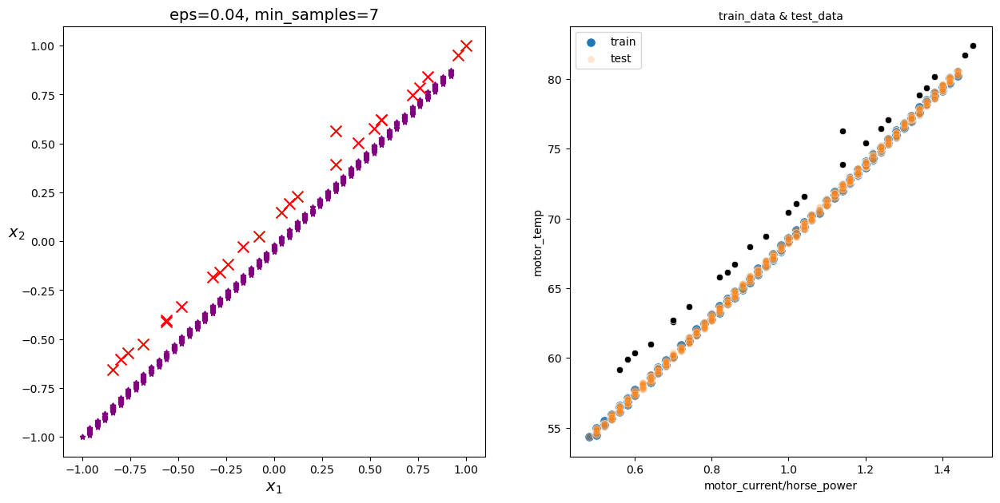

<Figure size 640x480 with 0 Axes>

In [1630]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'motor_current/horse_power', 'motor_temp')

plt.tight_layout()

In [1631]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])

In [1634]:
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [1635]:
submission2.value_counts('label')

label
0    7051
1     338
dtype: int64

In [1636]:
submission3 = submission2.copy()

In [1637]:
submission3['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission3['label'].value_counts()

0    7048
1     341
Name: label, dtype: int64

In [1638]:
submission3.to_csv('0411_3.csv', index=False)

In [517]:
#3955, 3960
#real_data_power_50[real_data_power_50['label'] != real_data_power_50_['label']]['index']

# rpm당 공기흡입 (여긴 하지마)

In [1639]:
test_data['label'] = submission2['label']
for i in range(8):
  globals()['test_data_{}'.format(i)] = test_data[test_data['type'] == i].reset_index()

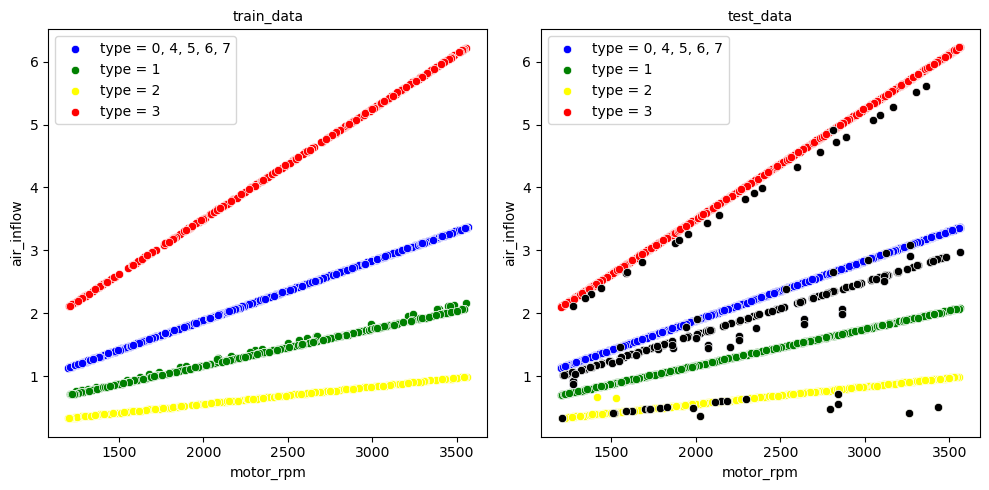

In [1640]:
sub_plot_corr(train_data, test_data, 'motor_rpm', 'air_inflow')

In [1641]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'motor_rpm', 'air_inflow', eps=0.05)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'motor_rpm', 'air_inflow', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'motor_rpm', 'air_inflow', eps=0.009)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'motor_rpm', 'air_inflow', eps=0.05)

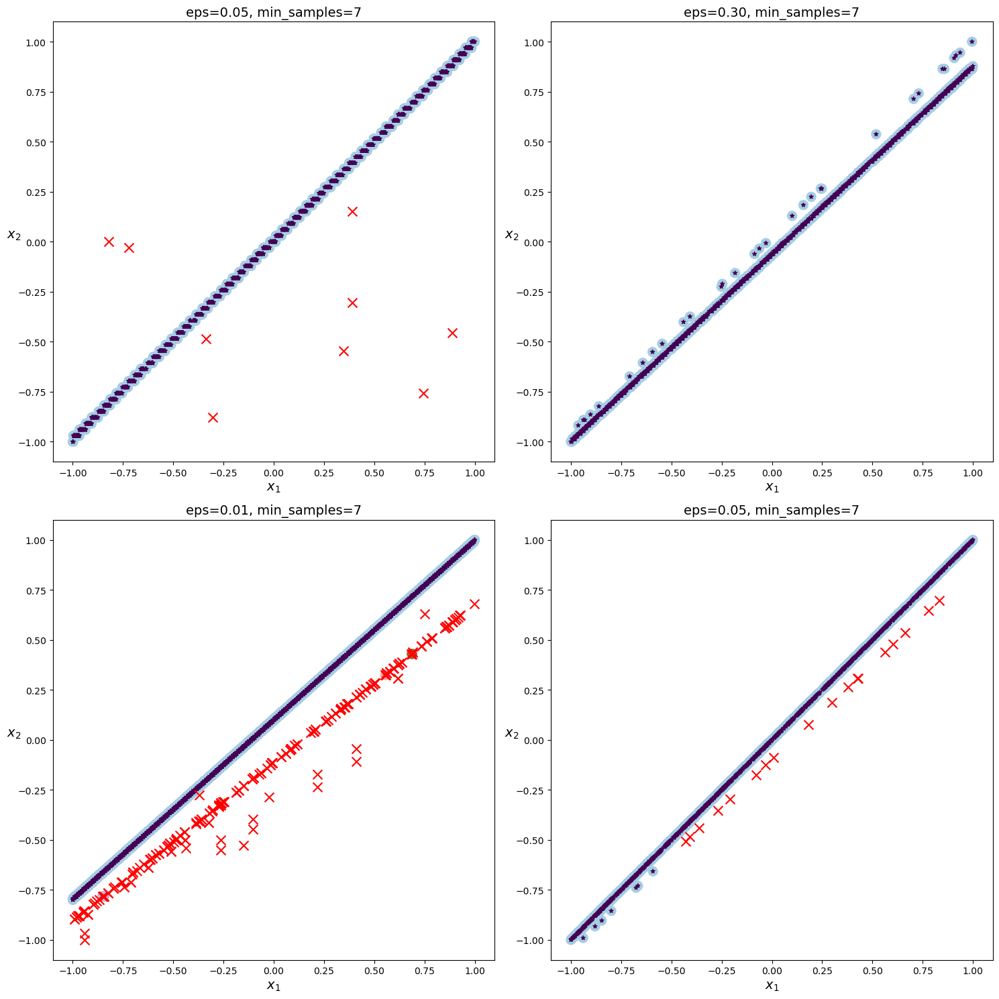

In [1642]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1643]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)

In [1644]:
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

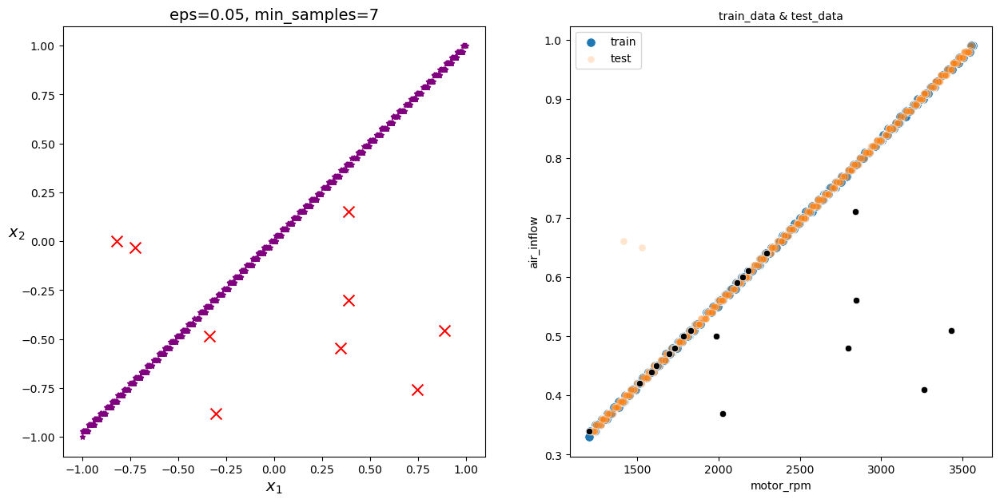

<Figure size 640x480 with 0 Axes>

In [1645]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'motor_rpm', 'air_inflow')

plt.tight_layout()

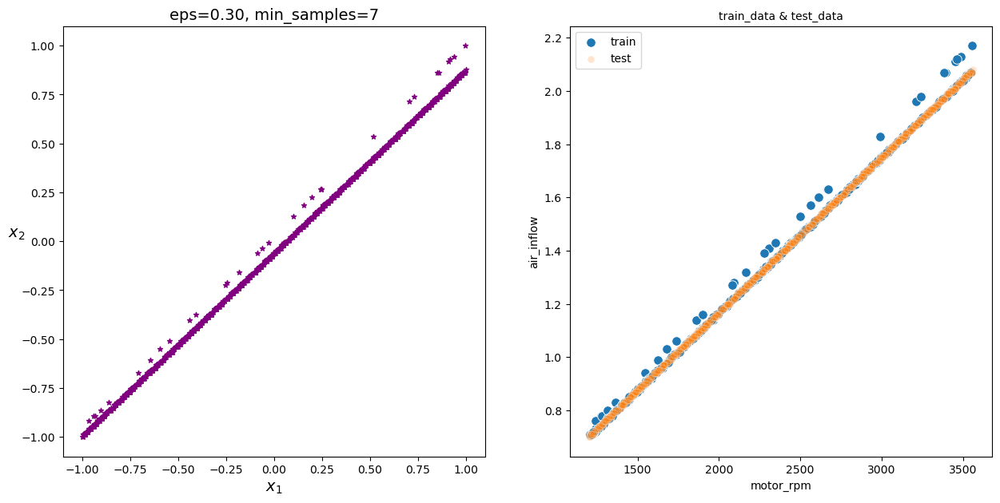

<Figure size 640x480 with 0 Axes>

In [1647]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'motor_rpm', 'air_inflow')

plt.tight_layout()

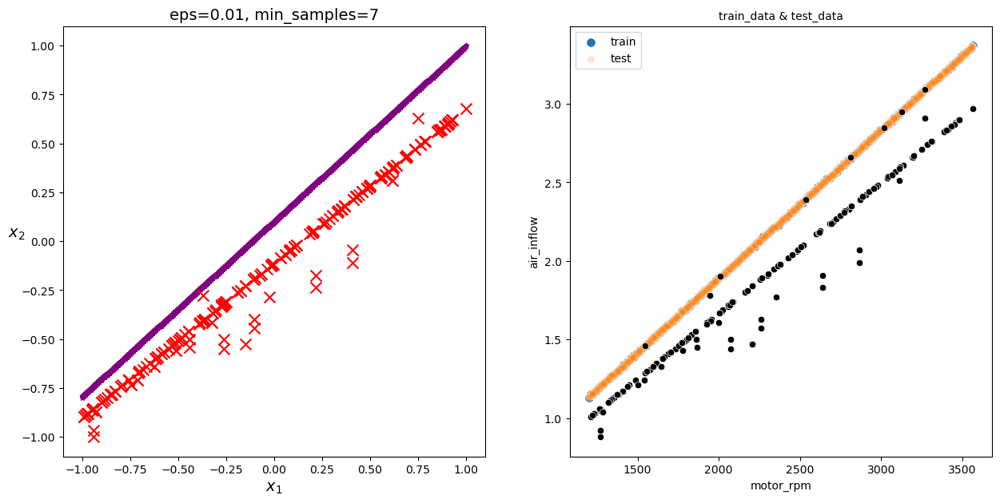

<Figure size 640x480 with 0 Axes>

In [1648]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'motor_rpm', 'air_inflow')

plt.tight_layout()

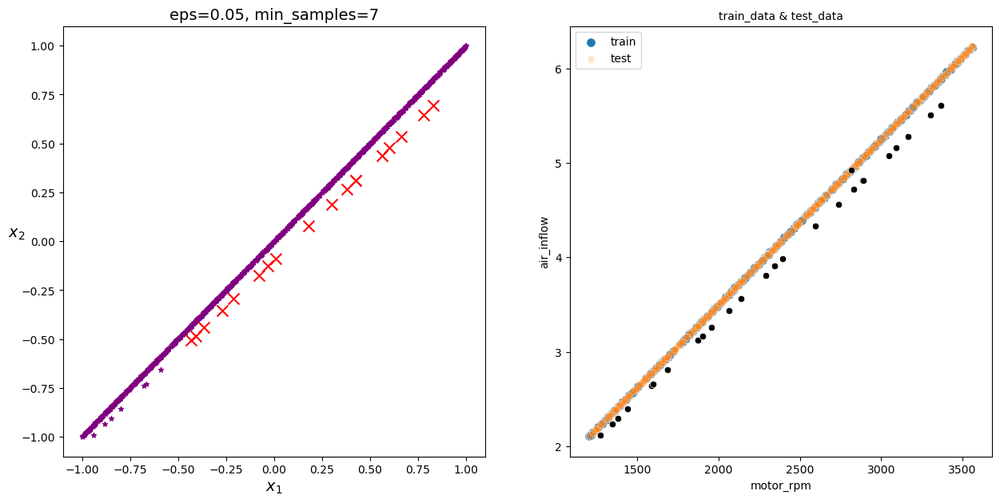

<Figure size 640x480 with 0 Axes>

In [1649]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'motor_rpm', 'air_inflow')

plt.tight_layout()

# 모터온도당 말단 온도

In [1650]:
test_data['label'] = submission2['label']
for i in range(8):
  globals()['test_data_{}'.format(i)] = test_data[test_data['type'] == i].reset_index()

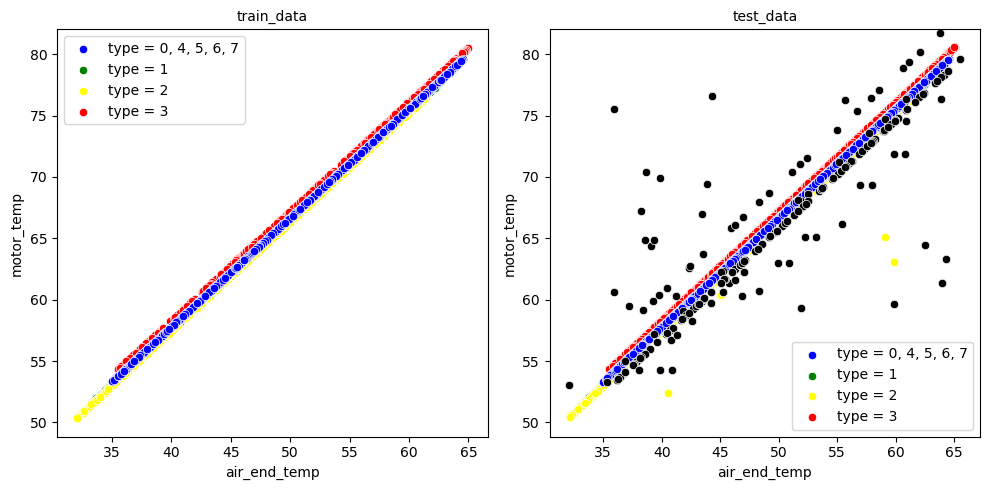

In [1651]:
sub_plot_corr(train_data, test_data, 'air_end_temp', 'motor_temp')

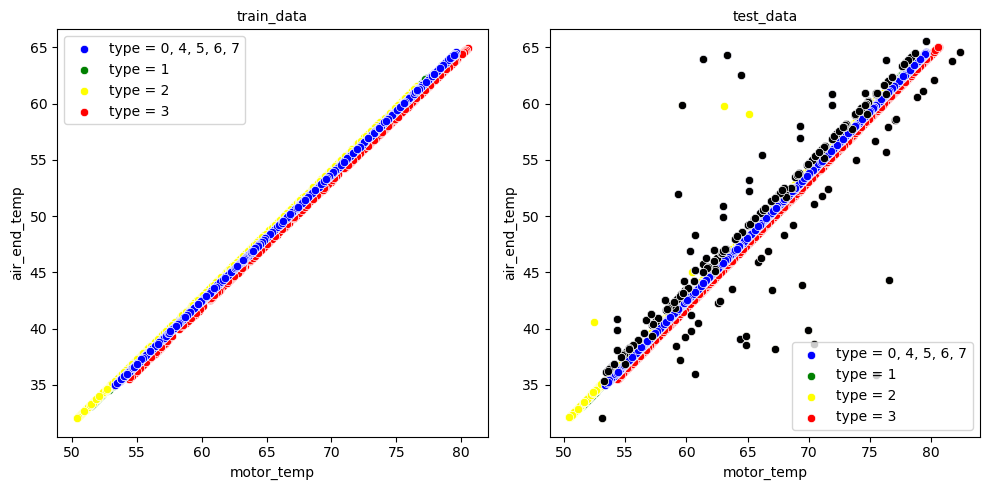

In [1652]:
sub_plot_corr(train_data, test_data, 'motor_temp', 'air_end_temp')

In [1653]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'motor_temp', 'air_end_temp', eps=0.02)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'motor_temp', 'air_end_temp', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'motor_temp', 'air_end_temp', eps=0.01)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'motor_temp', 'air_end_temp', eps=0.05)

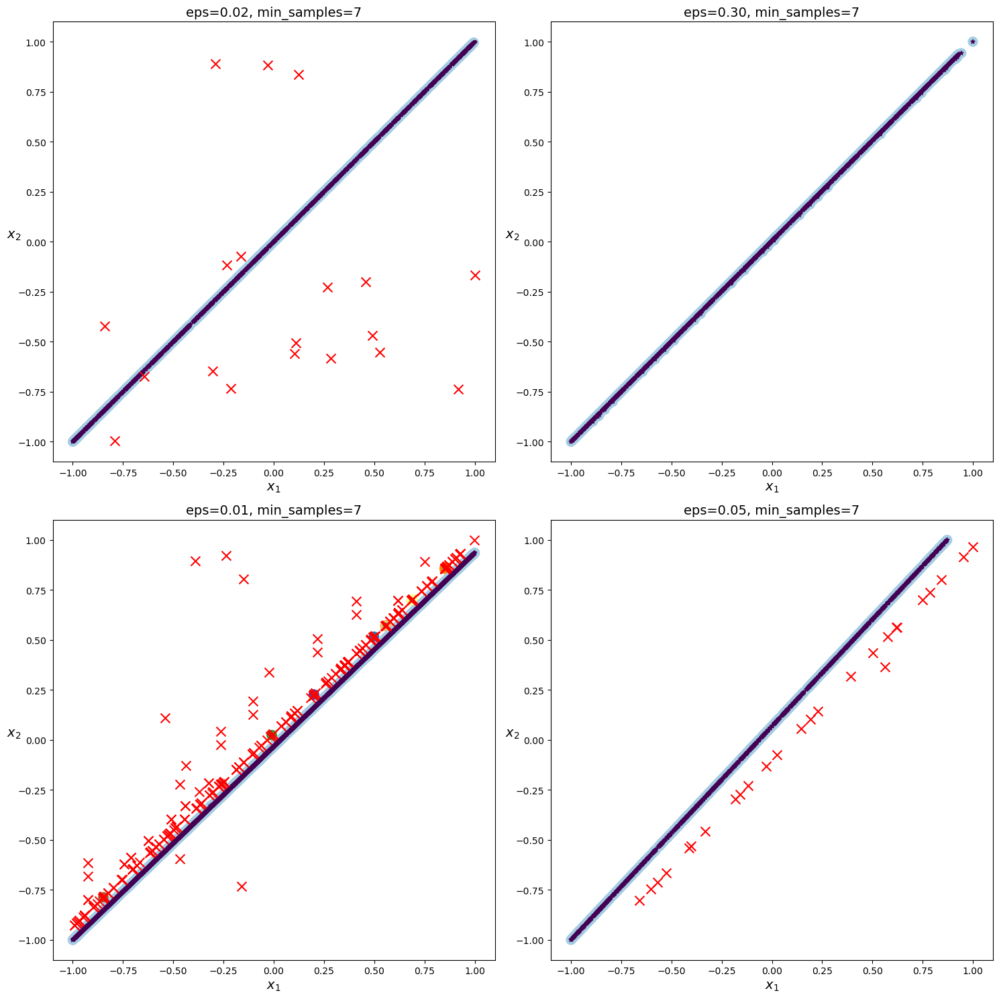

In [1654]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1655]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)

In [1656]:
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

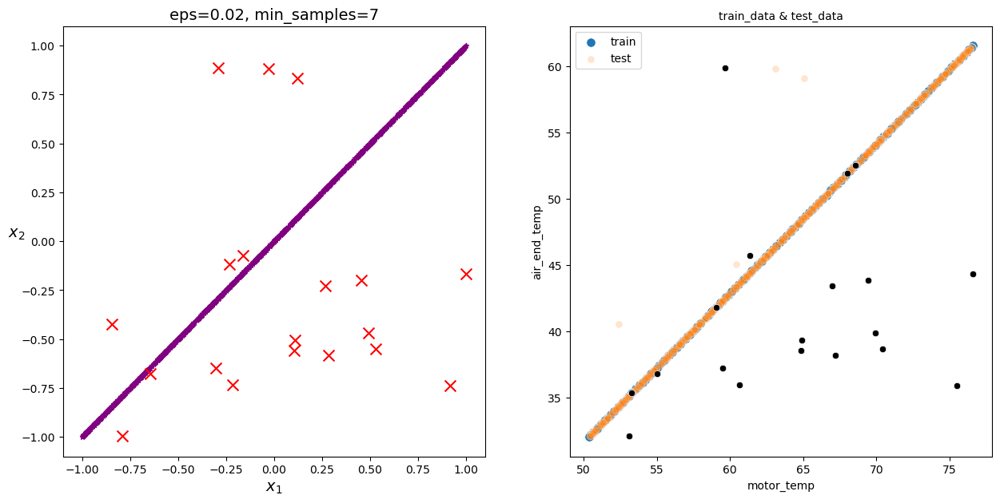

<Figure size 640x480 with 0 Axes>

In [1657]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'motor_temp', 'air_end_temp')

plt.tight_layout()

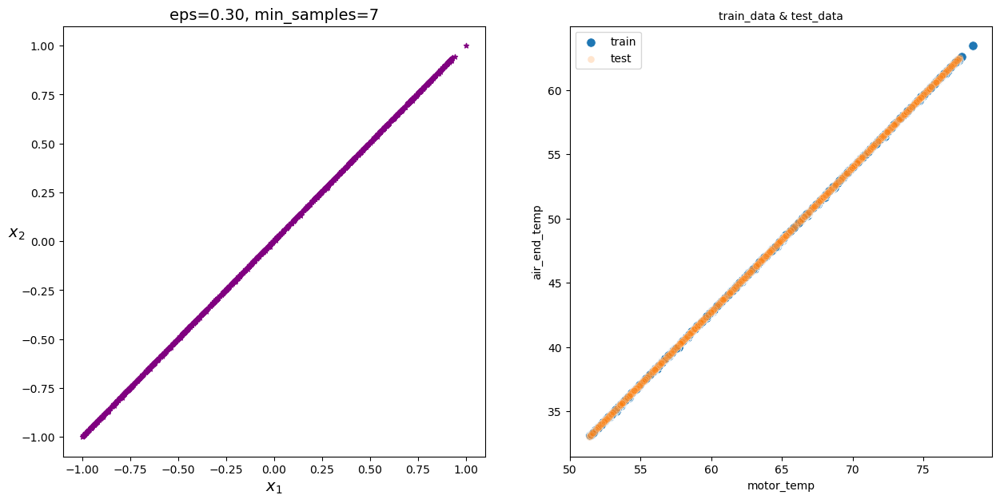

<Figure size 640x480 with 0 Axes>

In [1658]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'motor_temp', 'air_end_temp')

plt.tight_layout()

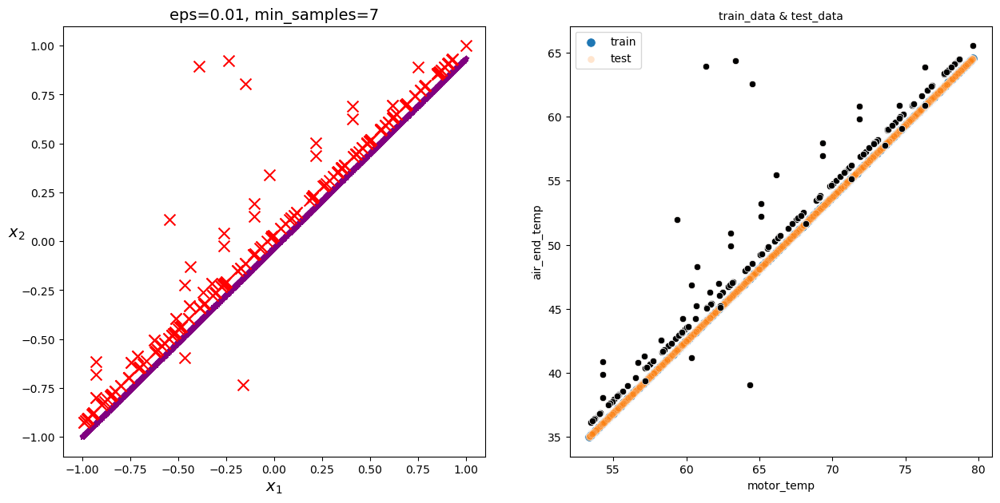

<Figure size 640x480 with 0 Axes>

In [1659]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'motor_temp', 'air_end_temp')

plt.tight_layout()

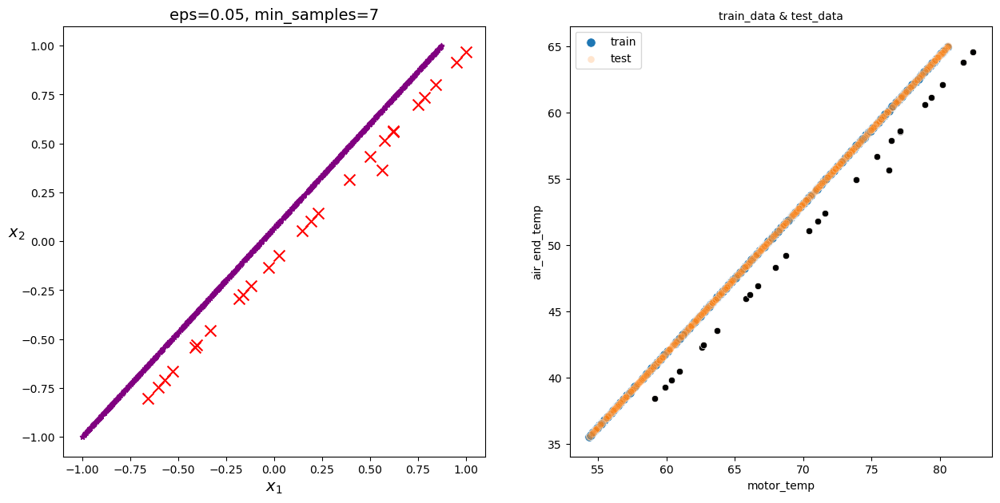

<Figure size 640x480 with 0 Axes>

In [1660]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'motor_temp', 'air_end_temp')

plt.tight_layout()

In [1131]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])

In [1132]:
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [1133]:
submission6.value_counts('label')

label
0    7047
1     342
dtype: int64

In [1135]:
submission7 = submission6.copy()

In [1136]:
submission7['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission7['label'].value_counts()

0    7047
1     342
Name: label, dtype: int64

# 과전류 고온도

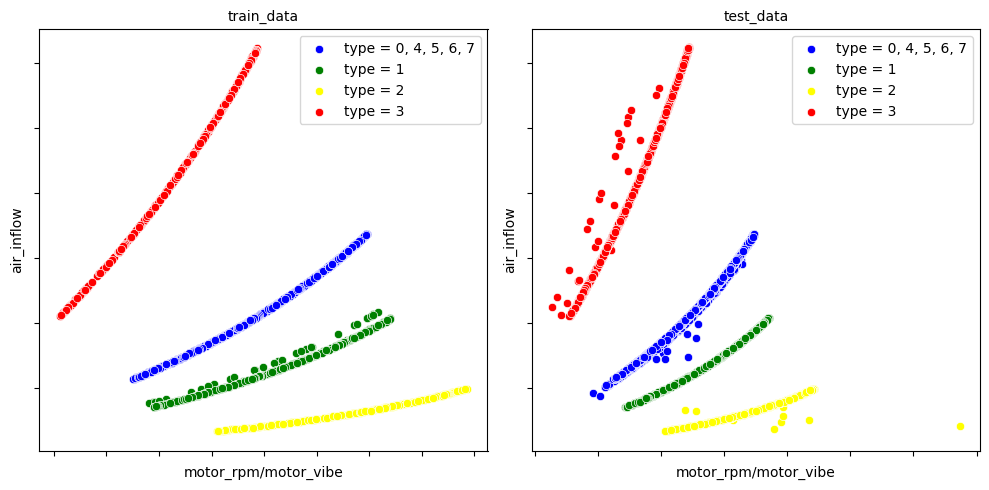

In [1532]:
sub_plot_corr(train_data, test_data, 'motor_rpm/motor_vibe','air_inflow')

In [1537]:
dbscan, z_scaled, labels = train_dbscan(sum_data_0, 'motor_rpm/motor_vibe','air_inflow', eps=0.015)
dbscan1, z_scaled1, labels1 = train_dbscan(sum_data_1, 'motor_rpm/motor_vibe','air_inflow', eps=0.05)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_2, 'motor_rpm/motor_vibe','air_inflow', eps=0.05)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_3, 'motor_rpm/motor_vibe','air_inflow', eps=0.05)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_4, 'motor_rpm/motor_vibe','air_inflow', eps=0.03)
dbscan5, z_scaled5, labels5 = train_dbscan(sum_data_5, 'motor_rpm/motor_vibe','air_inflow', eps=0.022241)
dbscan6, z_scaled6, labels6 = train_dbscan(sum_data_6, 'motor_rpm/motor_vibe','air_inflow', eps=0.028, min_samples=10)
dbscan7, z_scaled7, labels7 = train_dbscan(sum_data_7, 'motor_rpm/motor_vibe','air_inflow', eps=0.04)

In [1460]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'air_inflow', 'motor_current*motor_temp', eps=0.04)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'air_inflow', 'motor_current*motor_temp', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'air_inflow', 'motor_current*motor_temp', eps=0.02)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'air_inflow', 'motor_current*motor_temp', eps=0.05)

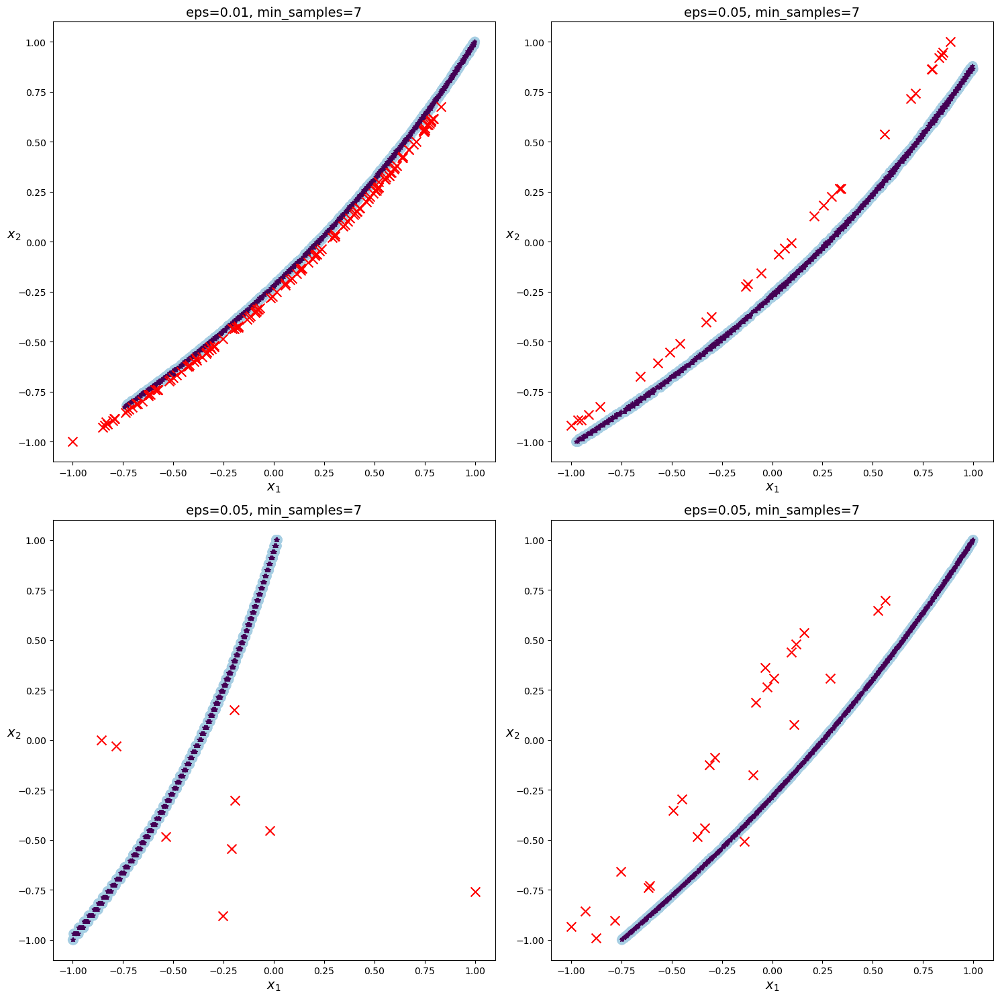

In [1412]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan1, z_scaled1, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan2,z_scaled2, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan3, z_scaled3, size=100)

plt.tight_layout()

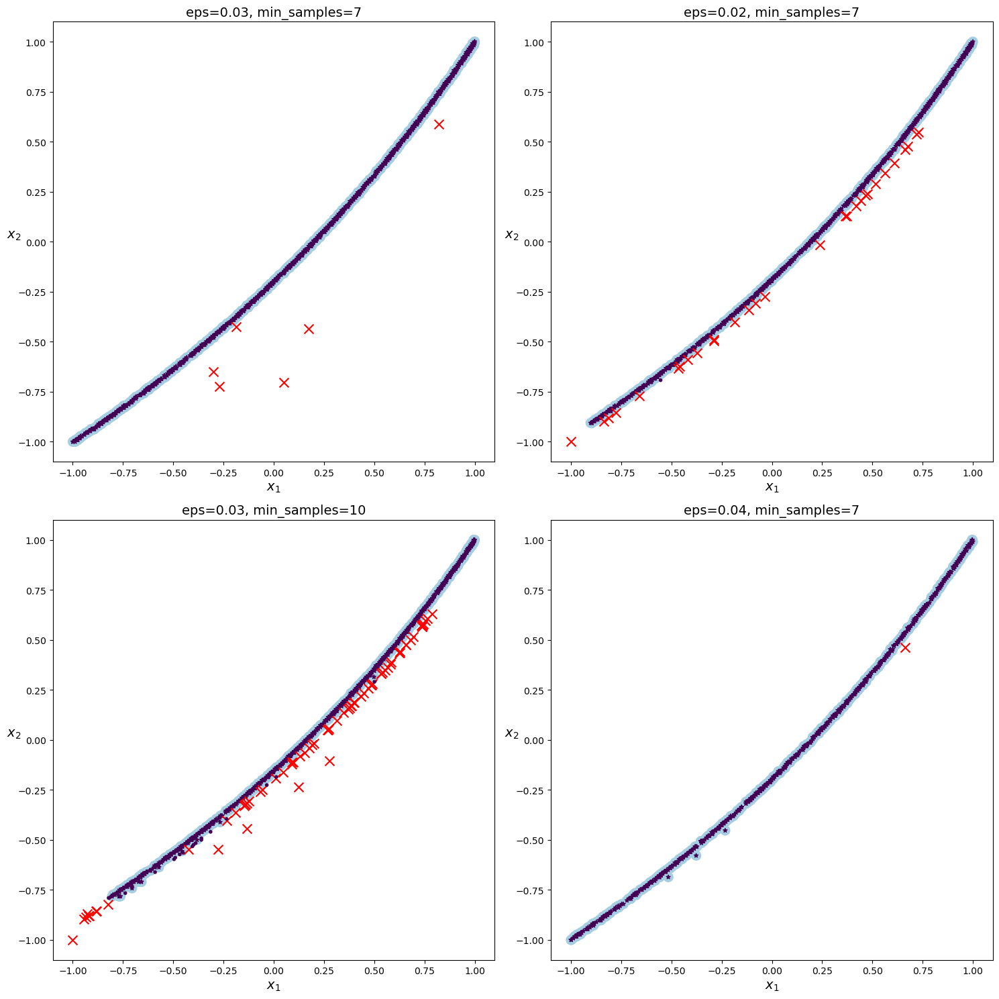

In [1538]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan5, z_scaled5, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan6,z_scaled6, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan7, z_scaled7, size=100)

plt.tight_layout()

In [1500]:
real_data_power_0 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels, columns=['label']),
                                sum_data_0['index'],sum_data_0['data_type']], axis=1).reset_index(drop=True)
real_data_power_1 = pd.concat([pd.DataFrame(z_scaled1, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                               sum_data_1['index'],sum_data_1['data_type']], axis=1).reset_index(drop=True)
real_data_power_2 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_2['index'],sum_data_2['data_type']], axis=1).reset_index(drop=True)
real_data_power_3 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                                sum_data_3['index'],sum_data_3['data_type']], axis=1).reset_index(drop=True)
real_data_power_4 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_4['index'],sum_data_4['data_type']], axis=1).reset_index(drop=True)
real_data_power_5 = pd.concat([pd.DataFrame(z_scaled5, columns=['x1', 'x2']),pd.DataFrame(labels5, columns=['label']),
                               sum_data_5['index'],sum_data_5['data_type']], axis=1).reset_index(drop=True)
real_data_power_6 = pd.concat([pd.DataFrame(z_scaled6, columns=['x1', 'x2']),pd.DataFrame(labels6, columns=['label']),
                               sum_data_6['index'],sum_data_6['data_type']], axis=1).reset_index(drop=True)
real_data_power_7 = pd.concat([pd.DataFrame(z_scaled7, columns=['x1', 'x2']),pd.DataFrame(labels7, columns=['label']),
                                sum_data_7['index'],sum_data_7['data_type']], axis=1).reset_index(drop=True)



train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

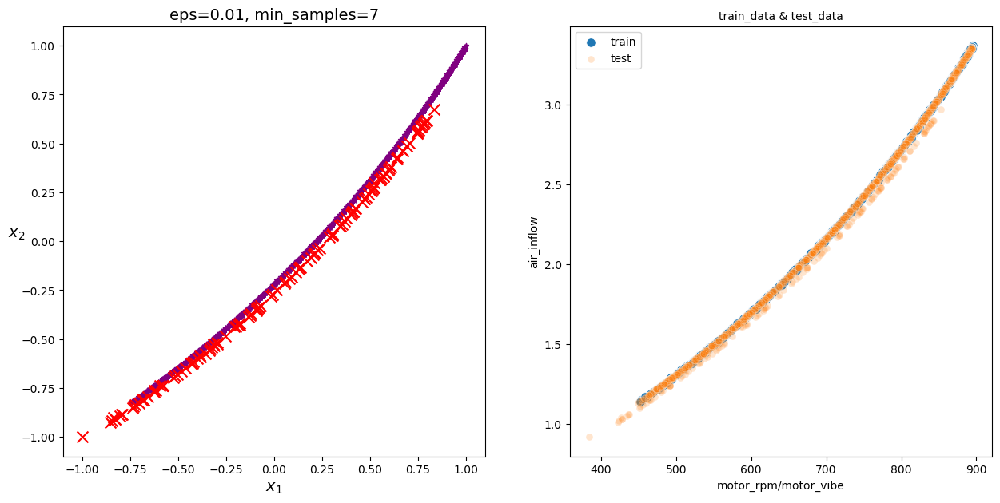

<Figure size 640x480 with 0 Axes>

In [1501]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_0, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_0, test_data_0, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

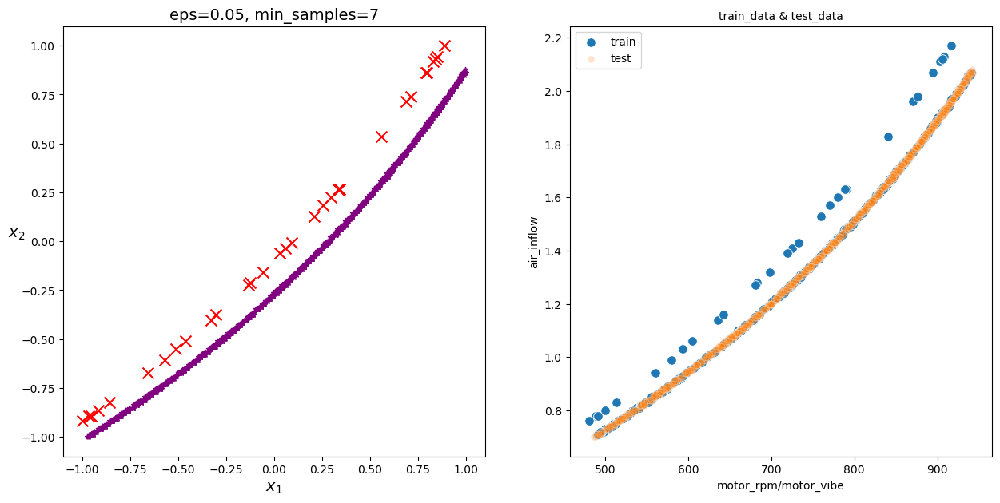

<Figure size 640x480 with 0 Axes>

In [1503]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan1, real_data_power_1, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_1, test_data_1, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

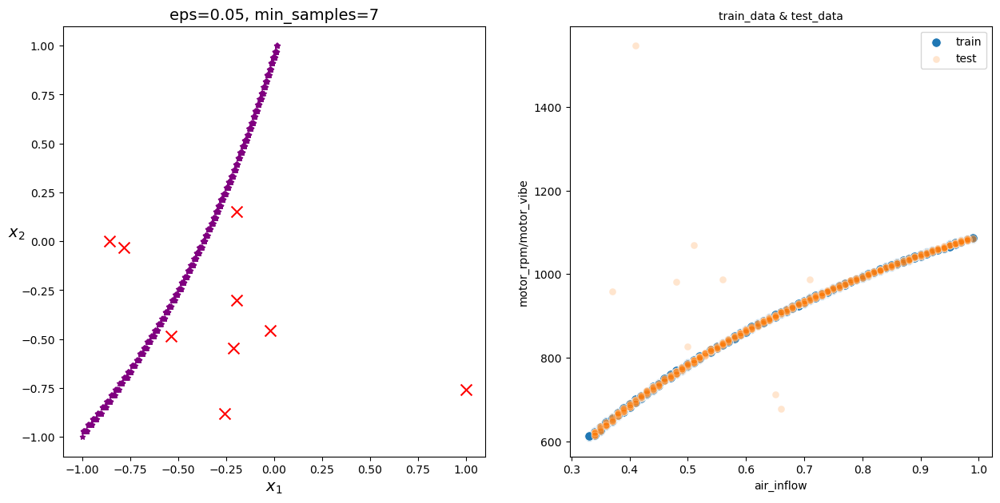

<Figure size 640x480 with 0 Axes>

In [1530]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_2, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_2, test_data_2, 'air_inflow','motor_rpm/motor_vibe')

plt.tight_layout()

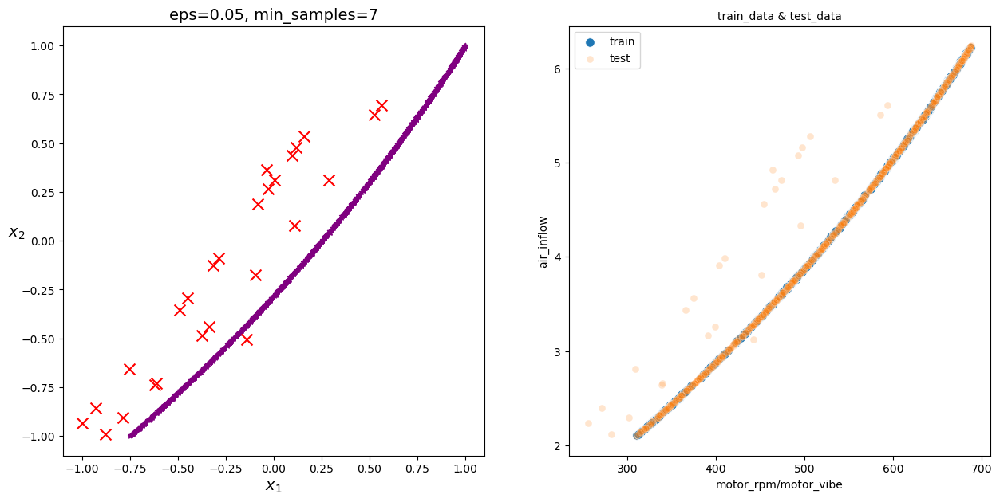

<Figure size 640x480 with 0 Axes>

In [1505]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_3, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_3, test_data_3, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

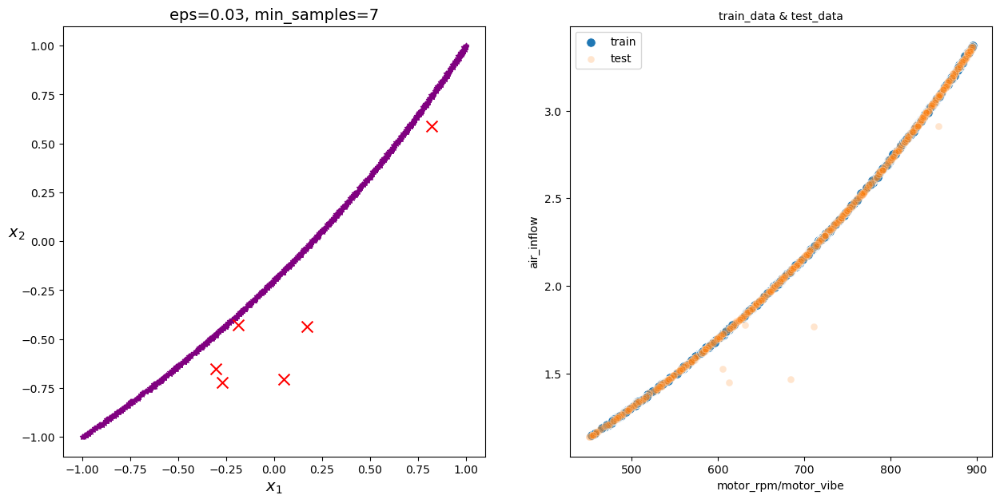

<Figure size 640x480 with 0 Axes>

In [1506]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_4, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_4, test_data_4, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

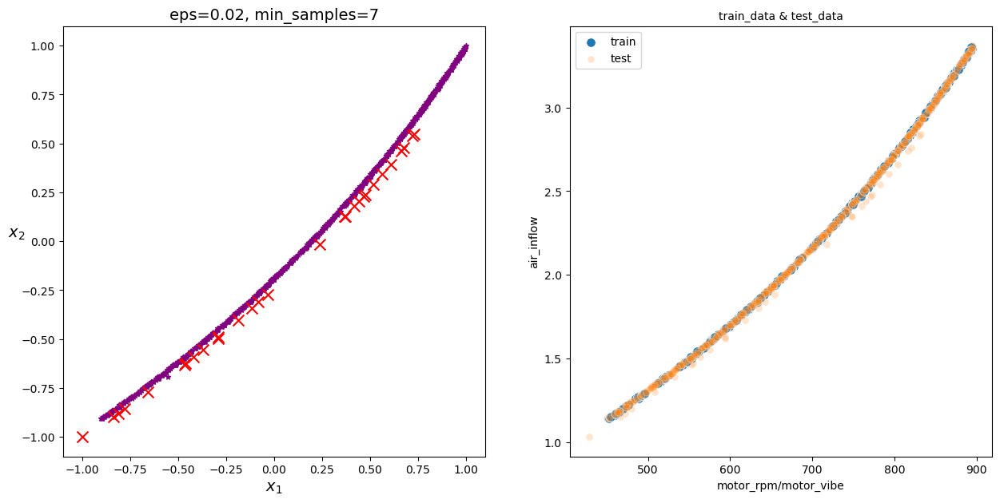

<Figure size 640x480 with 0 Axes>

In [1507]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan5, real_data_power_5, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_5, test_data_5, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

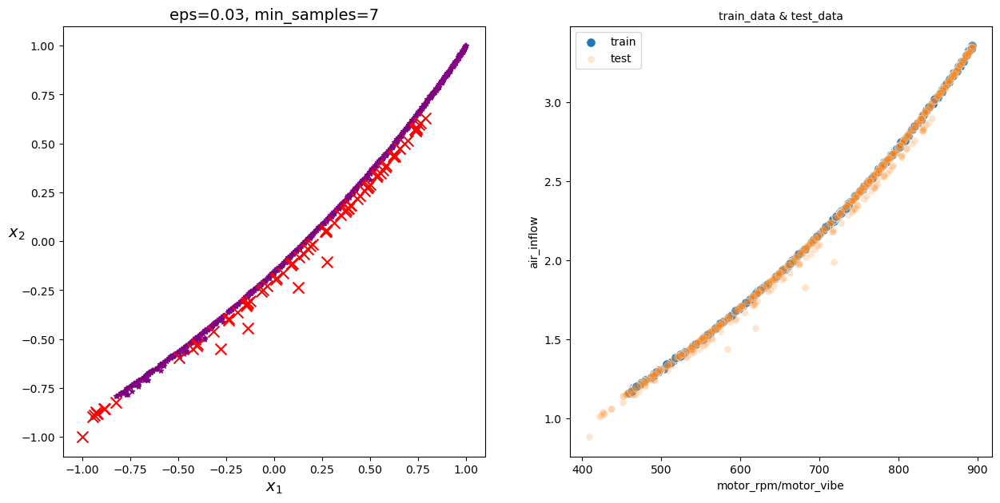

<Figure size 640x480 with 0 Axes>

In [1509]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan6, real_data_power_6, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_6, test_data_6, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

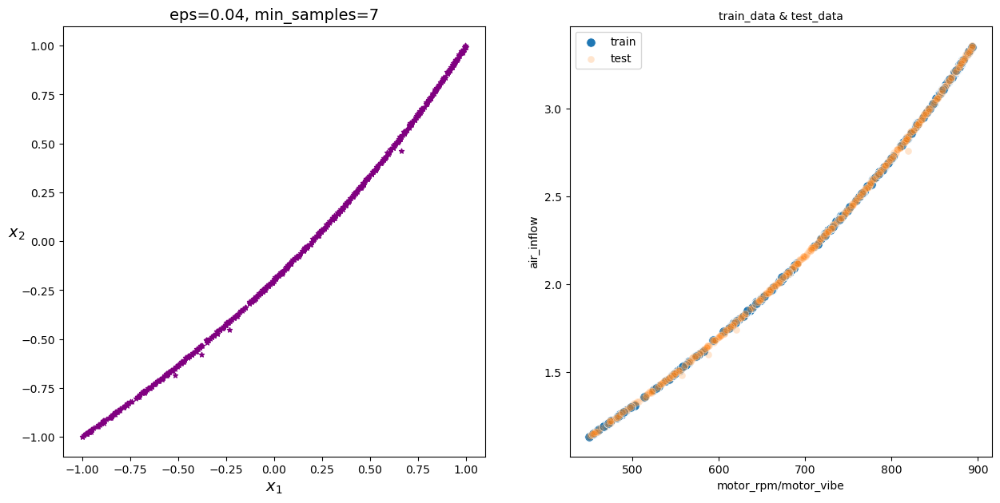

<Figure size 640x480 with 0 Axes>

In [1540]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan7, real_data_power_7, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_7, test_data_7, 'motor_rpm/motor_vibe','air_inflow')

plt.tight_layout()

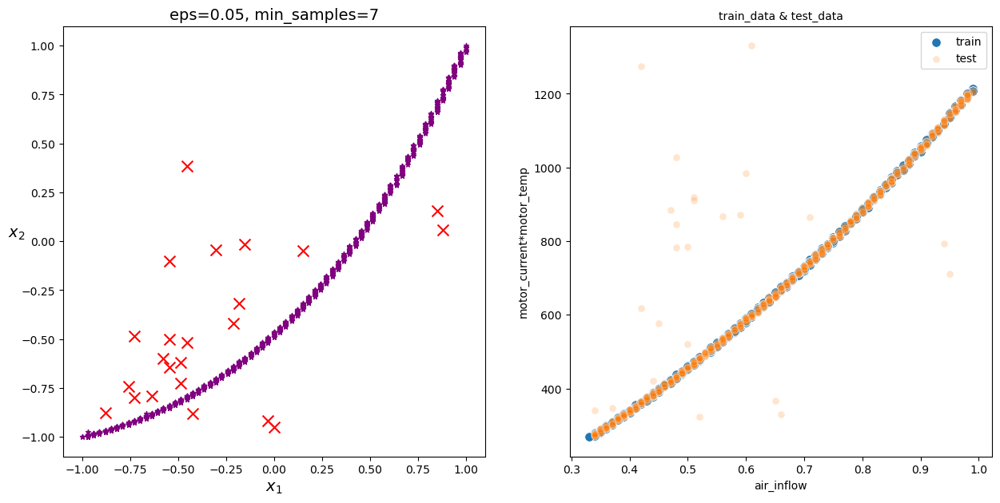

<Figure size 640x480 with 0 Axes>

In [1245]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'air_inflow', 'motor_current*motor_temp')

plt.tight_layout()

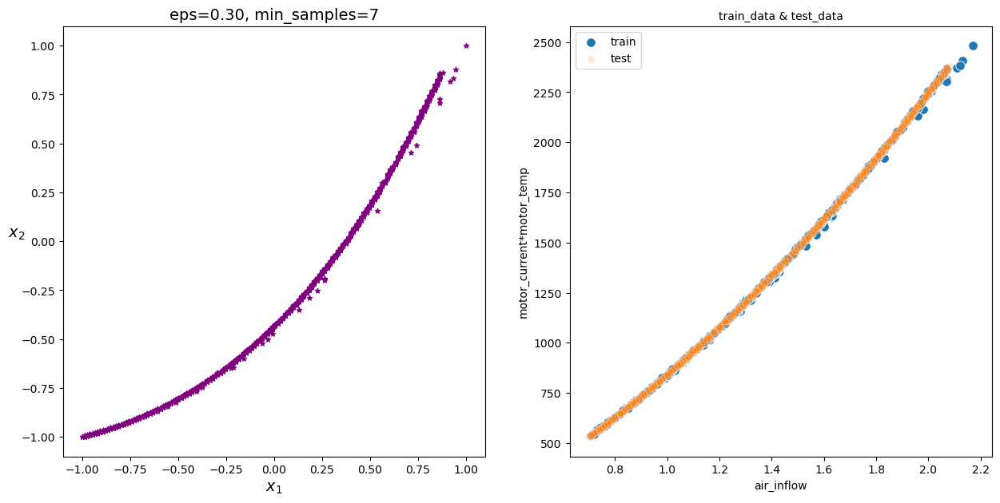

<Figure size 640x480 with 0 Axes>

In [1246]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'air_inflow', 'motor_current*motor_temp')

plt.tight_layout()

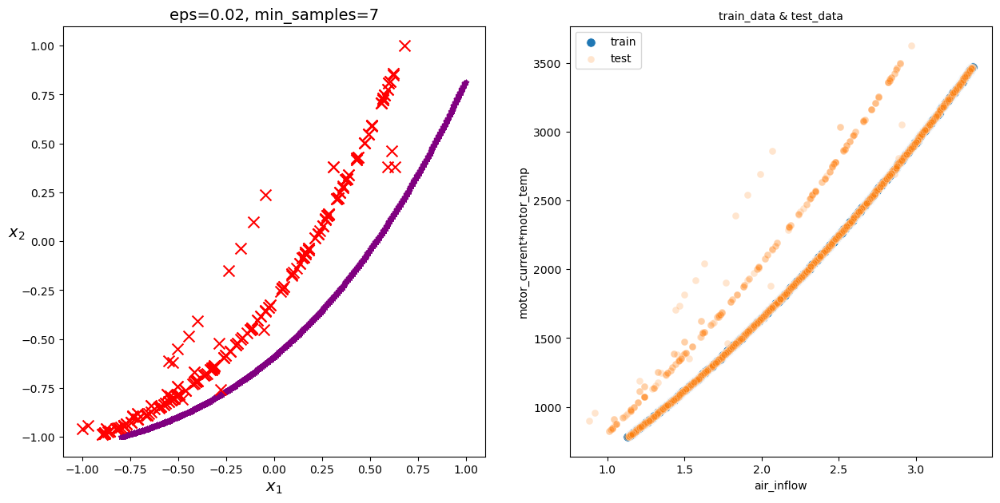

<Figure size 640x480 with 0 Axes>

In [1247]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'air_inflow', 'motor_current*motor_temp')

plt.tight_layout()

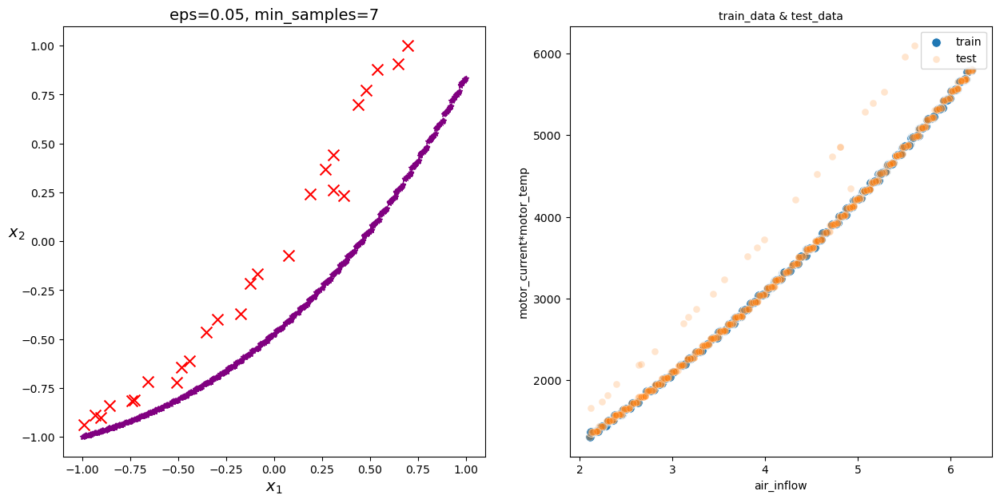

<Figure size 640x480 with 0 Axes>

In [1248]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'air_inflow', 'motor_current*motor_temp')

plt.tight_layout()

In [1541]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [1335]:
submission7.value_counts('label')

label
0    7047
1     342
dtype: int64

In [1250]:
submission8.value_counts('label')

label
0    7045
1     344
dtype: int64

In [1542]:
submission9.value_counts('label')

label
0    7045
1     344
dtype: int64

In [1543]:
submission10 = submission9.copy()

In [1544]:
submission10['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission10['label'].value_counts()

0    7045
1     344
Name: label, dtype: int64

In [1204]:
submission8.to_csv('0411_1.csv',index=False)

# 모터 전류당 말단 온도

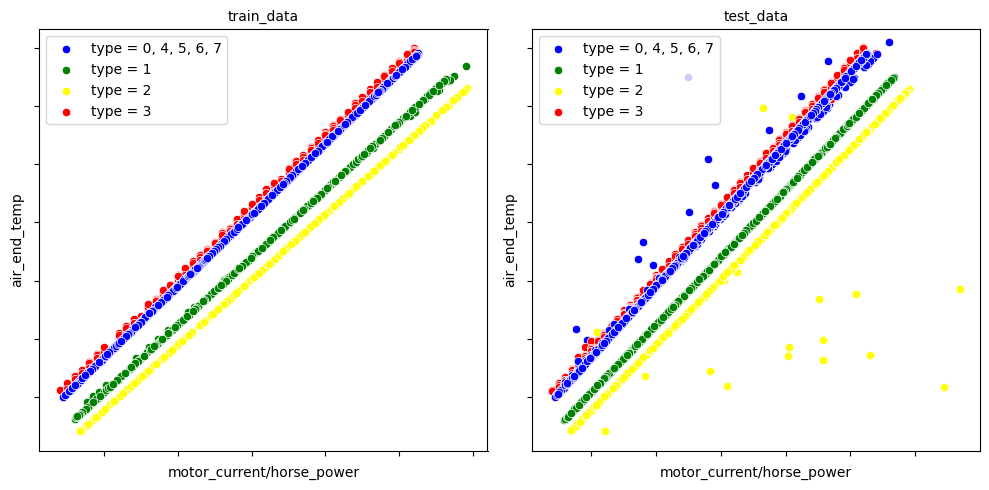

In [96]:
sub_plot_corr(train_data, test_data, 'motor_current/horse_power', 'air_end_temp')

In [248]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'motor_current/horse_power', 'air_end_temp', eps=0.05)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'motor_current/horse_power', 'air_end_temp', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'motor_current/horse_power', 'air_end_temp', eps=0.01)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'motor_current/horse_power', 'air_end_temp', eps=0.05)

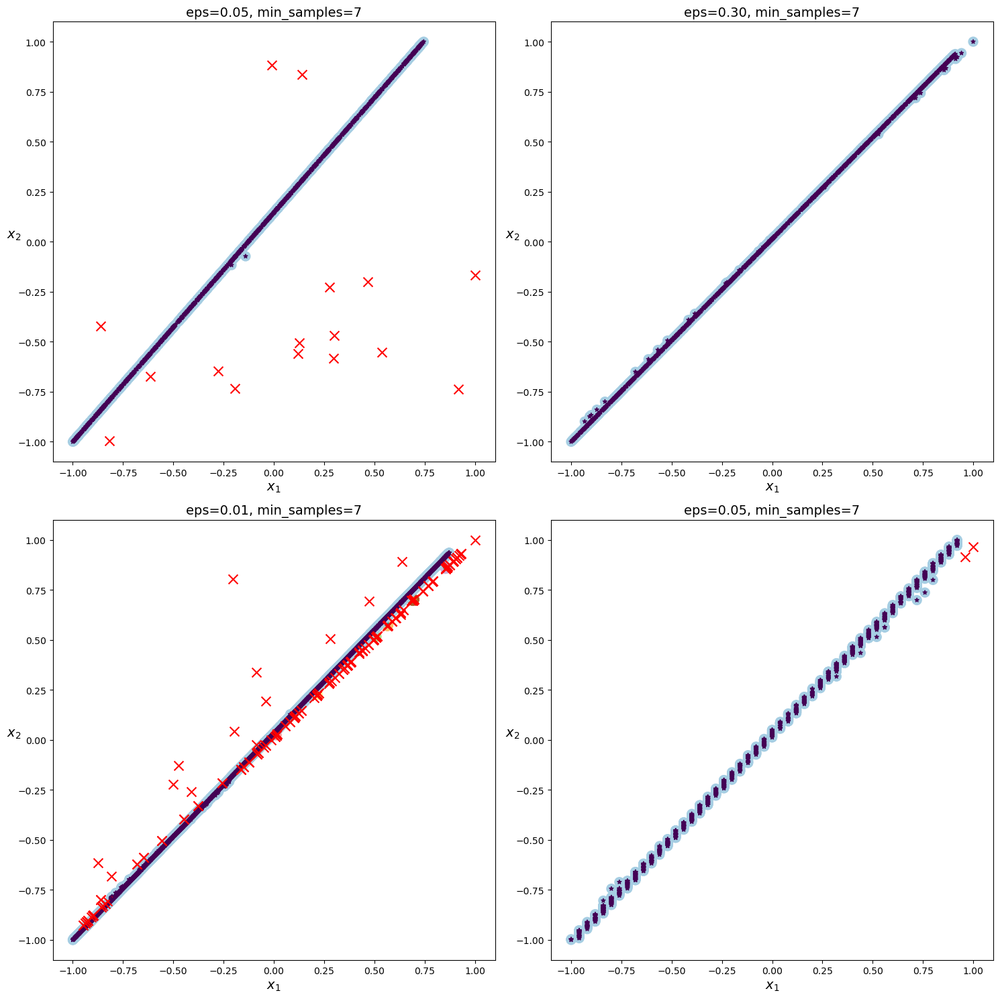

In [249]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

# rpm당 전류

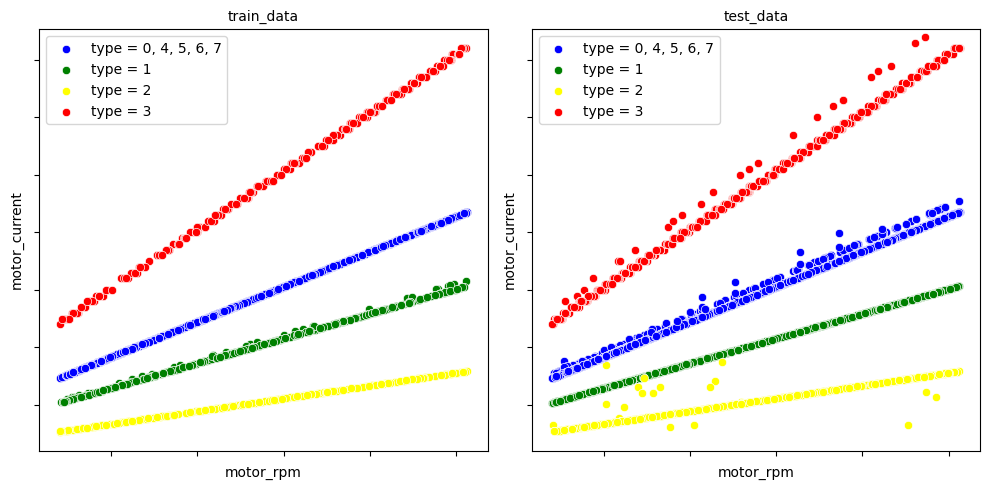

In [537]:
sub_plot_corr(train_data, test_data, 'motor_rpm', 'motor_current')

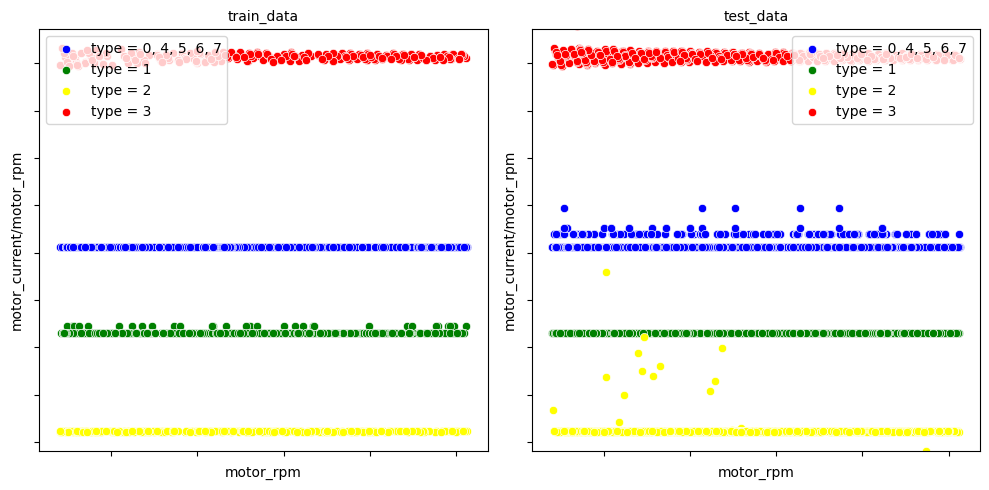

In [538]:
sub_plot_corr(train_data, test_data, 'motor_rpm', 'motor_current/motor_rpm')

In [539]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'motor_rpm', 'motor_current/motor_rpm', eps=0.02)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'motor_rpm', 'motor_current/motor_rpm', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'motor_rpm', 'motor_current/motor_rpm', eps=0.1)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'motor_rpm', 'motor_current/motor_rpm', eps=0.1)

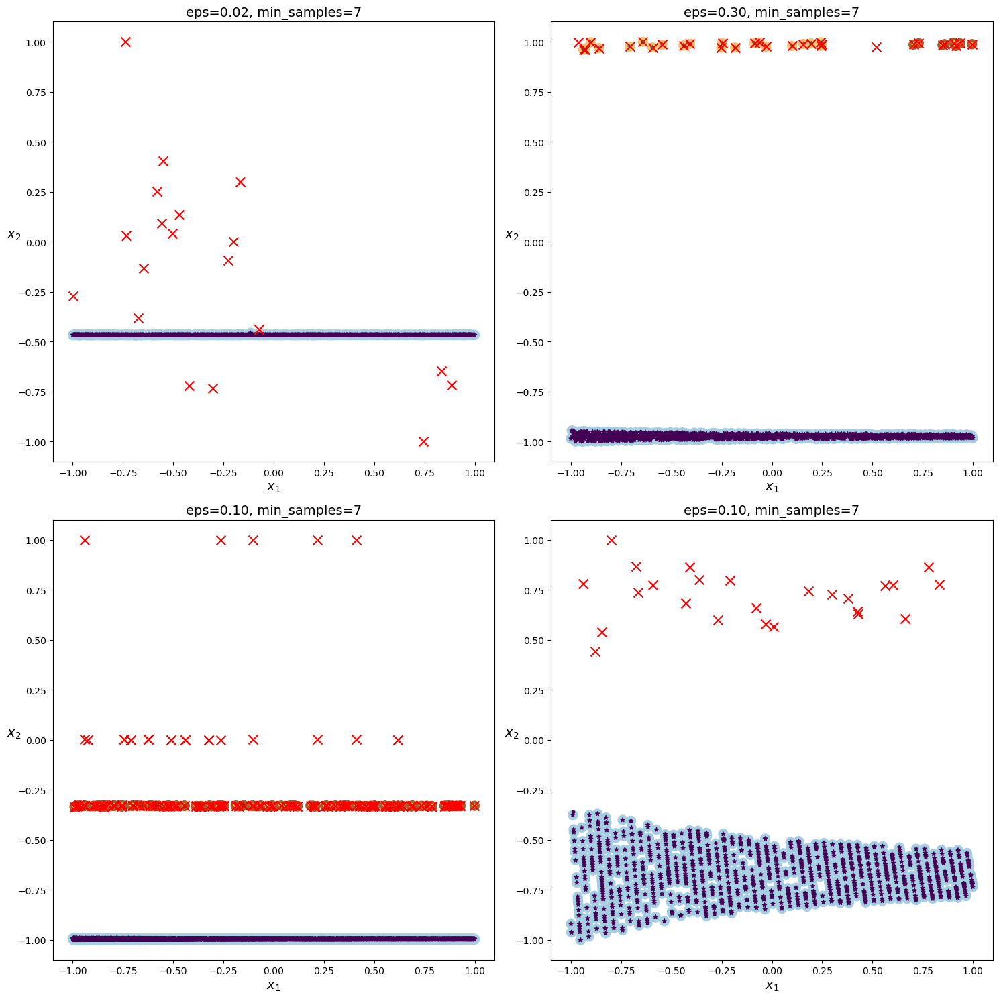

In [540]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [541]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

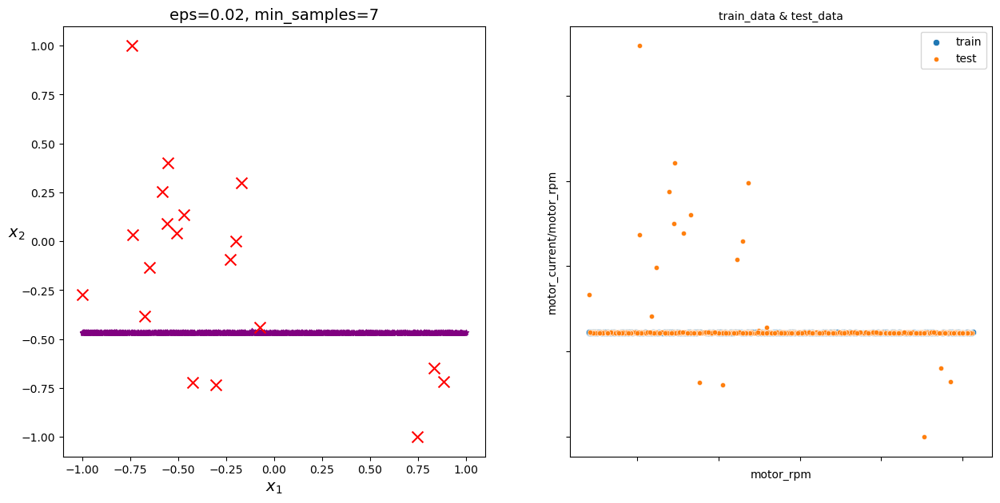

<Figure size 640x480 with 0 Axes>

In [542]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'motor_rpm', 'motor_current/motor_rpm')

plt.tight_layout()

In [543]:
# real_data_power_20['label'][real_data_power_20[real_data_power_20['x2'] > 0]['label'].index] = 0

In [544]:
index = [real_data_power_20['label'][real_data_power_20[real_data_power_20['x2'] > 0]['label'].index]]

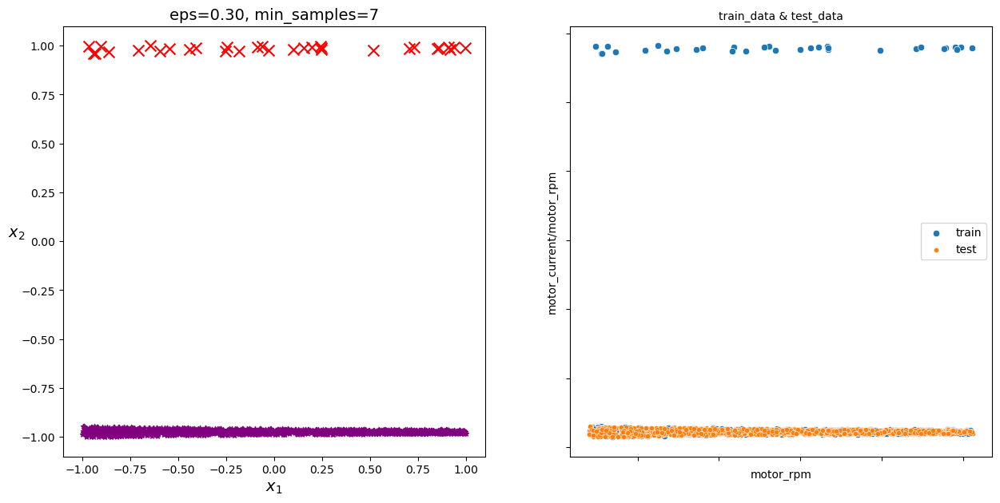

<Figure size 640x480 with 0 Axes>

In [545]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'motor_rpm', 'motor_current/motor_rpm')

plt.tight_layout()

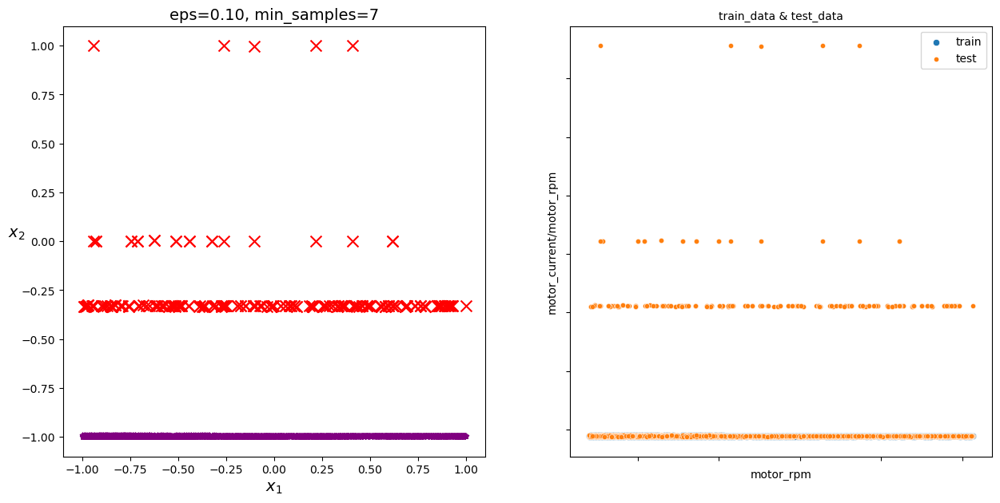

<Figure size 640x480 with 0 Axes>

In [546]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'motor_rpm', 'motor_current/motor_rpm')

plt.tight_layout()

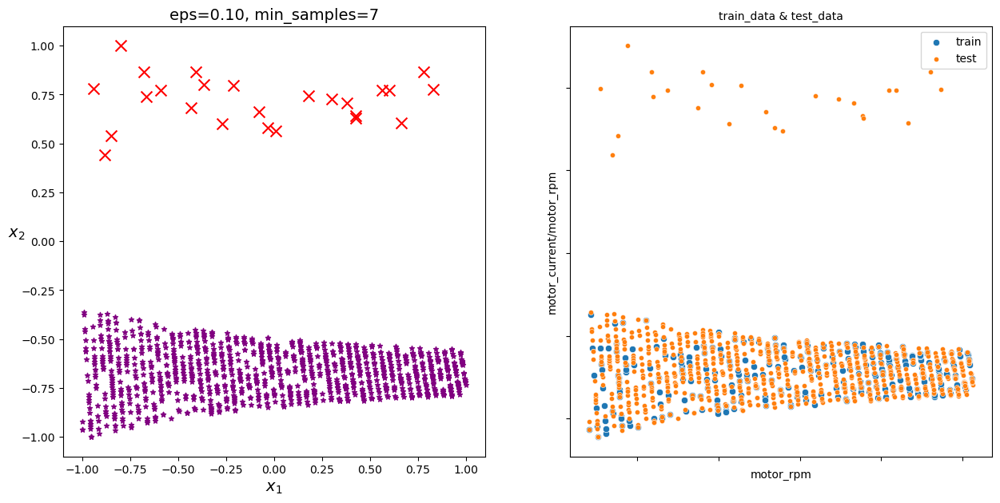

<Figure size 640x480 with 0 Axes>

In [547]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'motor_rpm', 'motor_current/motor_rpm')

plt.tight_layout()

In [548]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [549]:
submission3['label'].value_counts()

0    7047
1     342
Name: label, dtype: int64

In [550]:
submission3['label'][real_data_power_20['index'][real_data_power_20[real_data_power_20['x2'] > 0]['label'].index]].unique()

array([0])

In [551]:
submission4 = submission3.copy()

In [552]:
submission4['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission4['label']

0       0
1       0
2       0
3       0
4       0
       ..
7384    0
7385    0
7386    0
7387    0
7388    0
Name: label, Length: 7389, dtype: int32

In [553]:
submission4.value_counts('label')

label
0    7047
1     342
dtype: int64

In [554]:
submission4.to_csv('real_submission.csv', index=True)

# 흡입량/rpm 당 전류

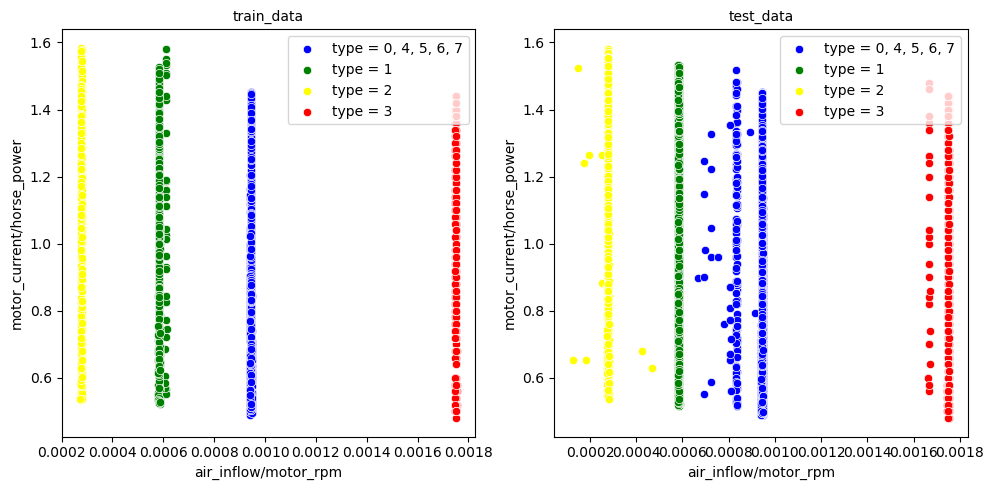

In [976]:
sub_plot_corr(train_data, test_data, 'air_inflow/motor_rpm', 'motor_current/horse_power')

In [998]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'air_inflow/motor_rpm', 'motor_current/horse_power', eps=0.1)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'air_inflow/motor_rpm', 'motor_current/horse_power', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'air_inflow/motor_rpm', 'motor_current/horse_power', eps=0.1)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'air_inflow/motor_rpm', 'motor_current/horse_power', eps=0.1)

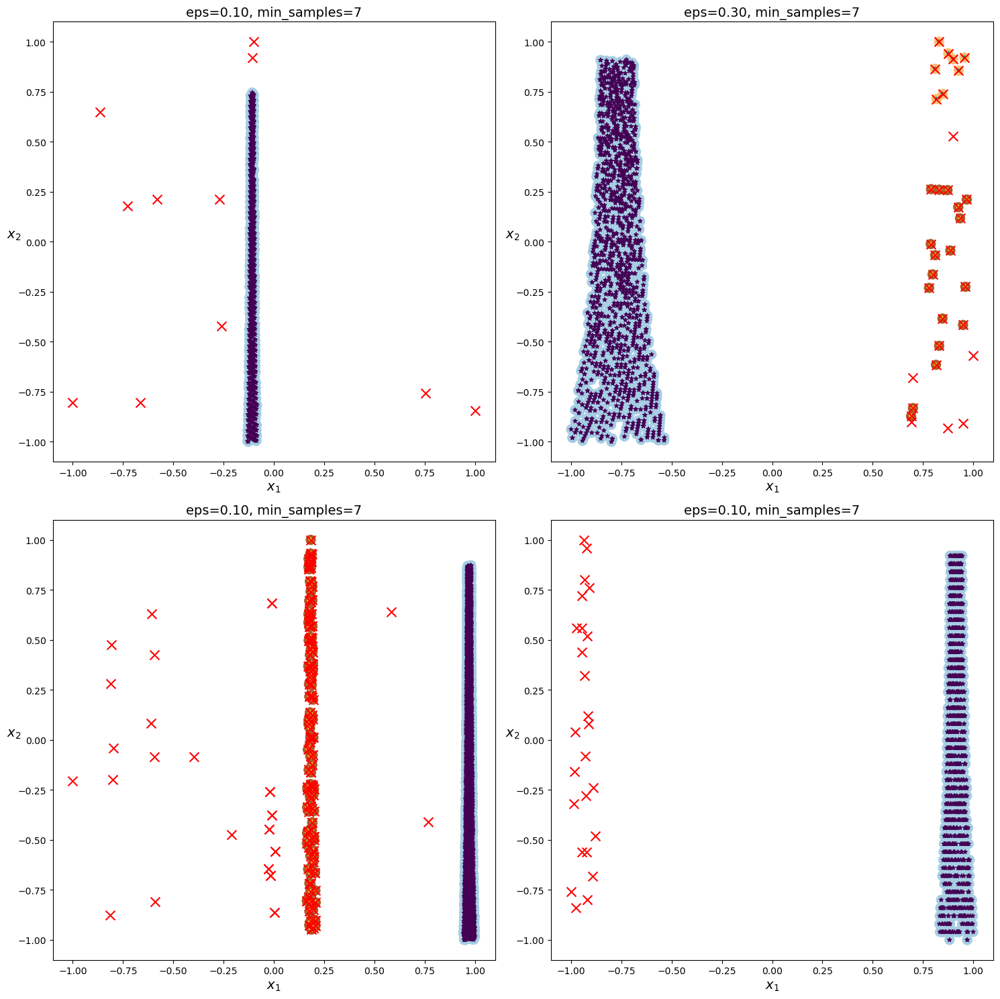

In [999]:
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1000]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

In [1001]:
real_data_power_10[real_data_power_10['index'] == 2647]

,x1,x2,label,index,data_type
610,1.0,-0.843724,1,2647,test


In [1002]:
real_data_power_10[real_data_power_10['index'] == 2648]

,x1,x2,label,index,data_type
611,0.754188,-0.757273,1,2648,test


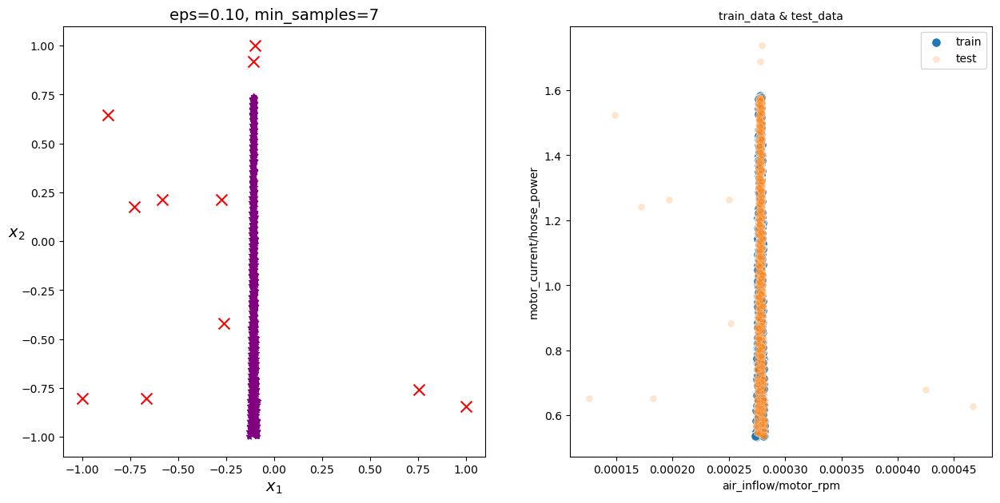

<Figure size 640x480 with 0 Axes>

In [1003]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'air_inflow/motor_rpm', 'motor_current/horse_power')

plt.tight_layout()

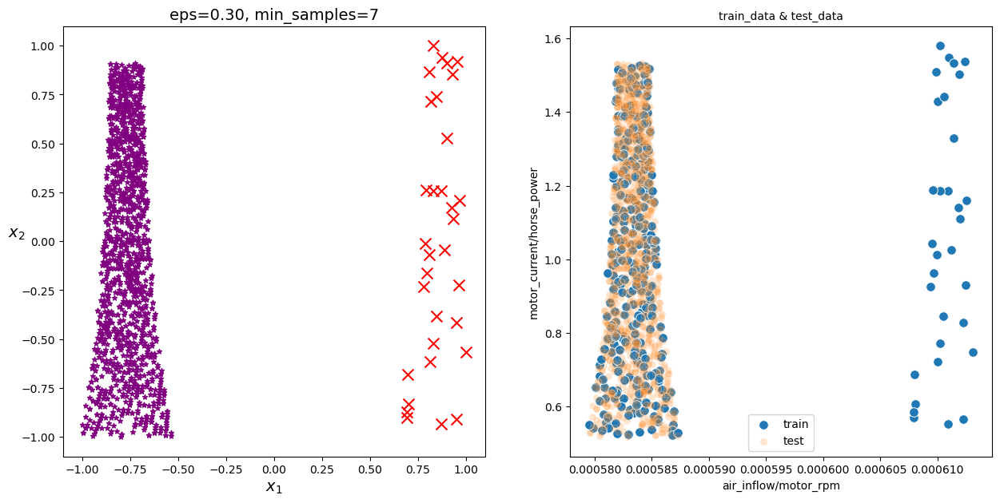

<Figure size 640x480 with 0 Axes>

In [1004]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'air_inflow/motor_rpm', 'motor_current/horse_power')

plt.tight_layout()

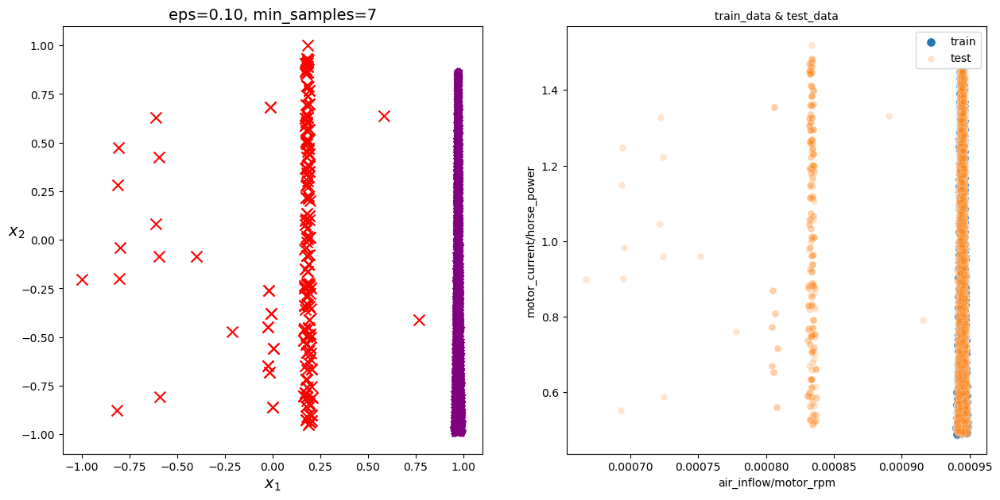

<Figure size 640x480 with 0 Axes>

In [1005]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'air_inflow/motor_rpm', 'motor_current/horse_power')

plt.tight_layout()

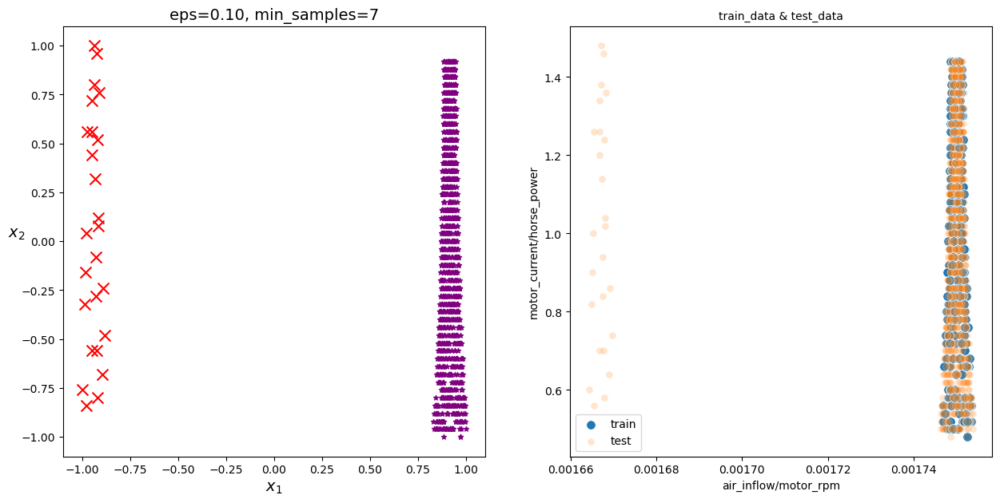

<Figure size 640x480 with 0 Axes>

In [1006]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'air_inflow/motor_rpm', 'motor_current/horse_power')

plt.tight_layout()

In [1009]:
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index] = 0
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index]

610    0
611    0
Name: label, dtype: int32

In [1010]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)

In [1013]:
submission = pd.read_csv('dataset/answer_sample.csv')
submission['label'] = 0
submission['label'].value_counts()

0    7389
Name: label, dtype: int64

In [670]:
submission4['label'].value_counts()

0    7047
1     342
Name: label, dtype: int64

In [1014]:
submission['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission['label'].value_counts()

0    7071
1     318
Name: label, dtype: int64

In [1015]:
submission['label'][test_data[test_data['out_pressure'] != 0.7]['out_pressure'].index] = 1
submission['label'].value_counts()

0    7064
1     325
Name: label, dtype: int64

In [672]:
test_data['type'][[2647, 2648]]

2647    2
2648    2
Name: type, dtype: int64

In [673]:
submission5[submission4['label'] != submission5['label']].index

Int64Index([2647, 2648], dtype='int64')

In [674]:
submission5.value_counts('label')

label
0    7045
1     344
dtype: int64

In [675]:
submission5['label'][2647] = 0

In [770]:
submission5['label'][2647] = 1
submission5['label'][2648] = 1

In [771]:
submission5.value_counts('label')

label
0    7045
1     344
dtype: int64

In [772]:
submission5.to_csv('real_submission4.csv', index=True)

# 흡입량/rpm 당 진동

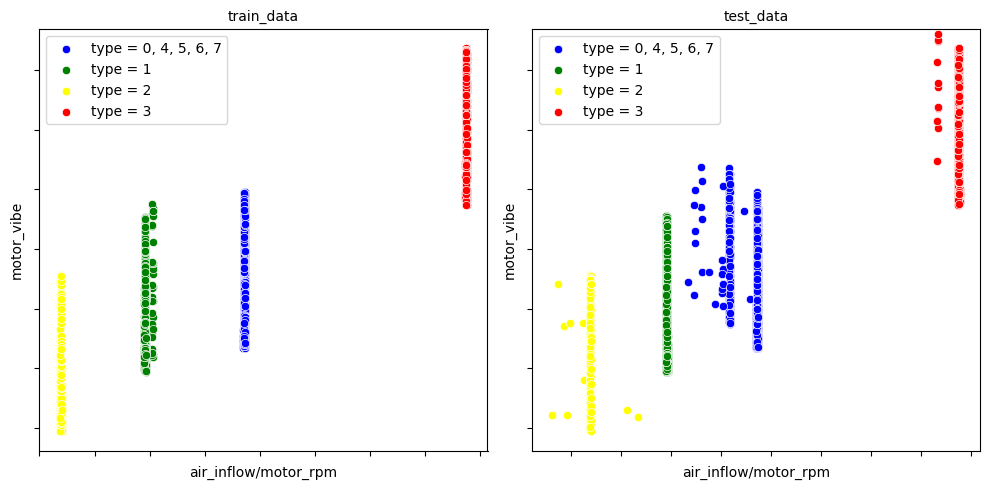

In [1016]:
sub_plot_corr(train_data, test_data, 'air_inflow/motor_rpm', 'motor_vibe')

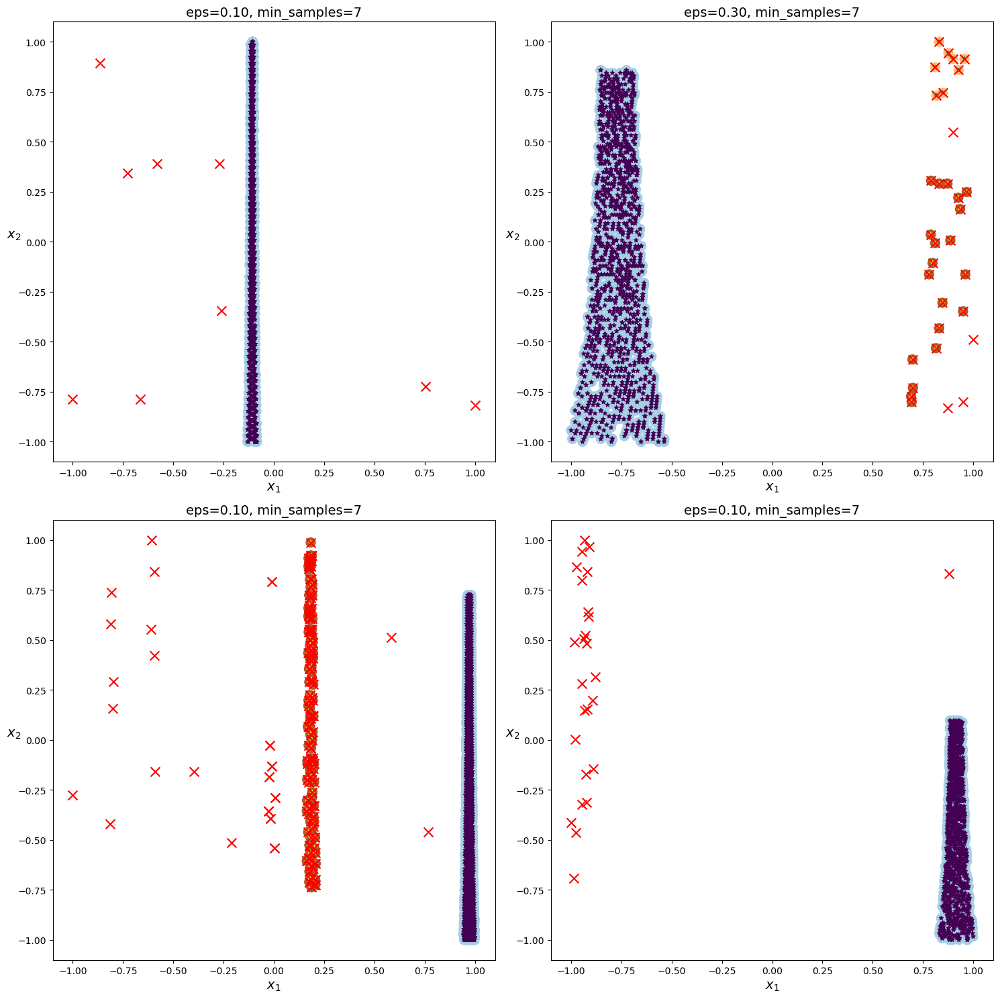

In [1017]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'air_inflow/motor_rpm', 'motor_vibe', eps=0.1)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'air_inflow/motor_rpm', 'motor_vibe', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'air_inflow/motor_rpm', 'motor_vibe', eps=0.1)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'air_inflow/motor_rpm', 'motor_vibe', eps=0.1)
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1018]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

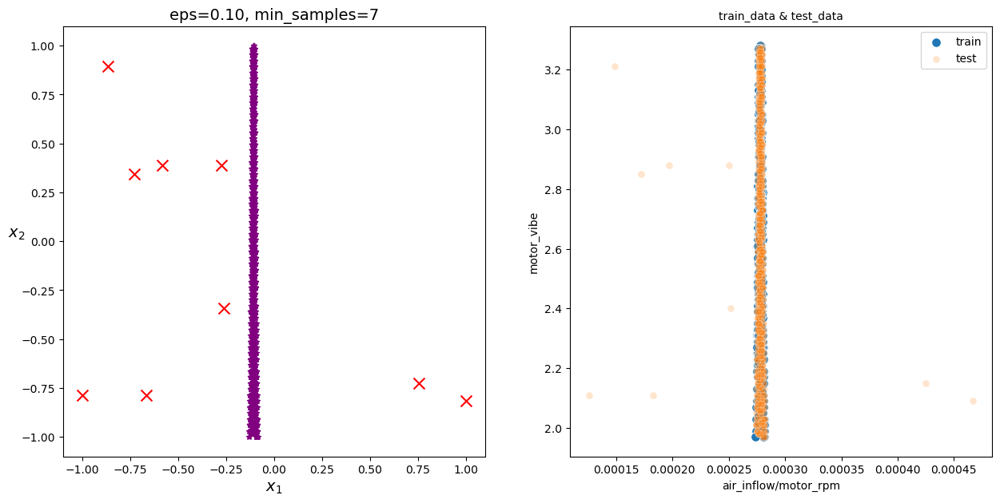

<Figure size 640x480 with 0 Axes>

In [1019]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'air_inflow/motor_rpm', 'motor_vibe')

plt.tight_layout()

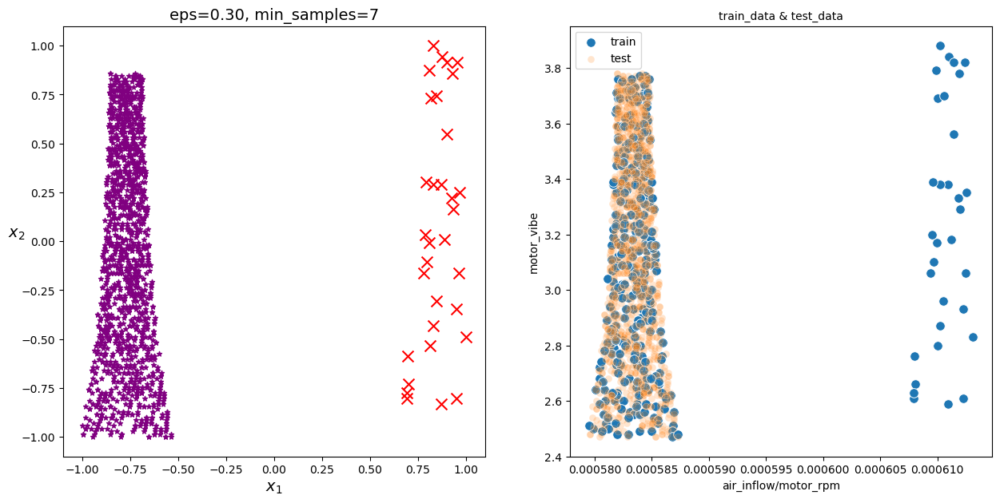

<Figure size 640x480 with 0 Axes>

In [1020]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'air_inflow/motor_rpm', 'motor_vibe')

plt.tight_layout()

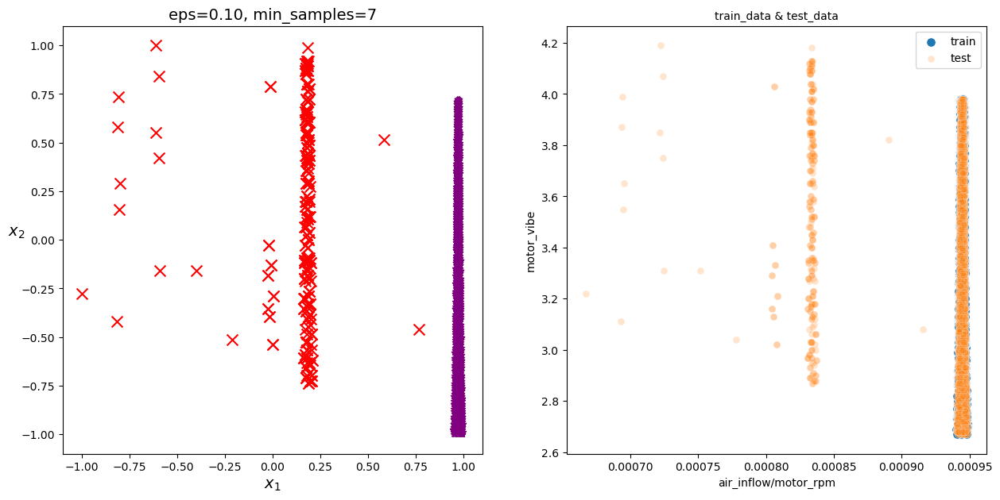

<Figure size 640x480 with 0 Axes>

In [1021]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'air_inflow/motor_rpm', 'motor_vibe')

plt.tight_layout()

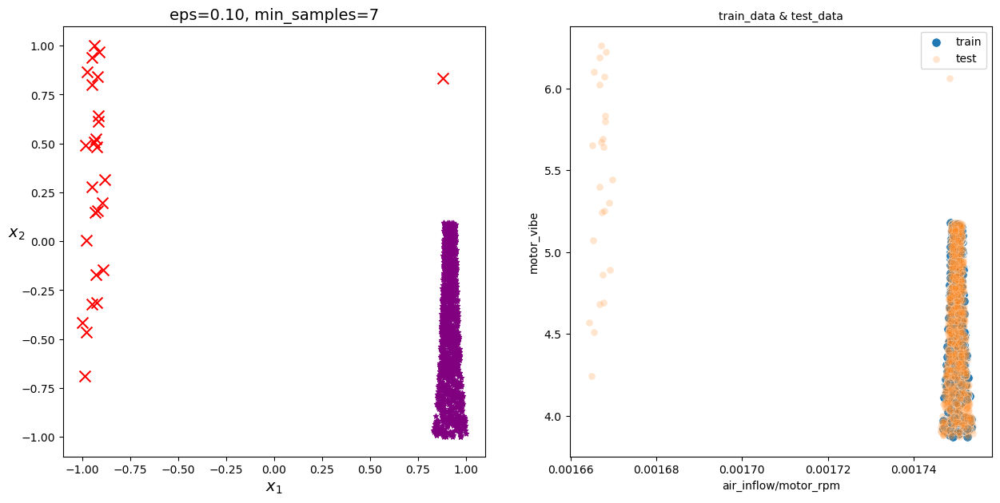

<Figure size 640x480 with 0 Axes>

In [1022]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'air_inflow/motor_rpm', 'motor_vibe')

plt.tight_layout()

In [1023]:
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index] = 0
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index]

610    0
611    0
Name: label, dtype: int32

In [1024]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)
submission['label'].value_counts()

0    7064
1     325
Name: label, dtype: int64

In [1025]:
submission2 = submission.copy()
submission2['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission2['label'].value_counts()

0    7063
1     326
Name: label, dtype: int64

# 흡입량/rpm 당 온도

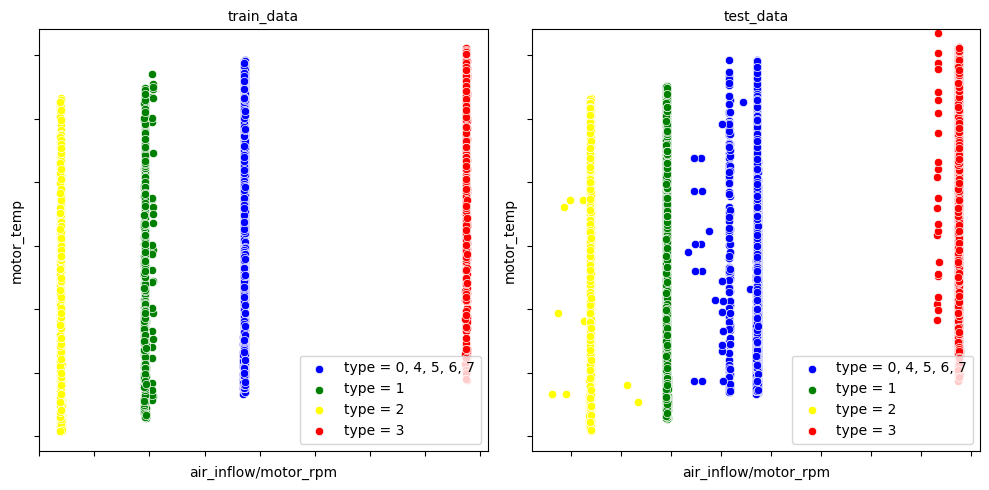

In [1026]:
sub_plot_corr(train_data, test_data, 'air_inflow/motor_rpm', 'motor_temp')

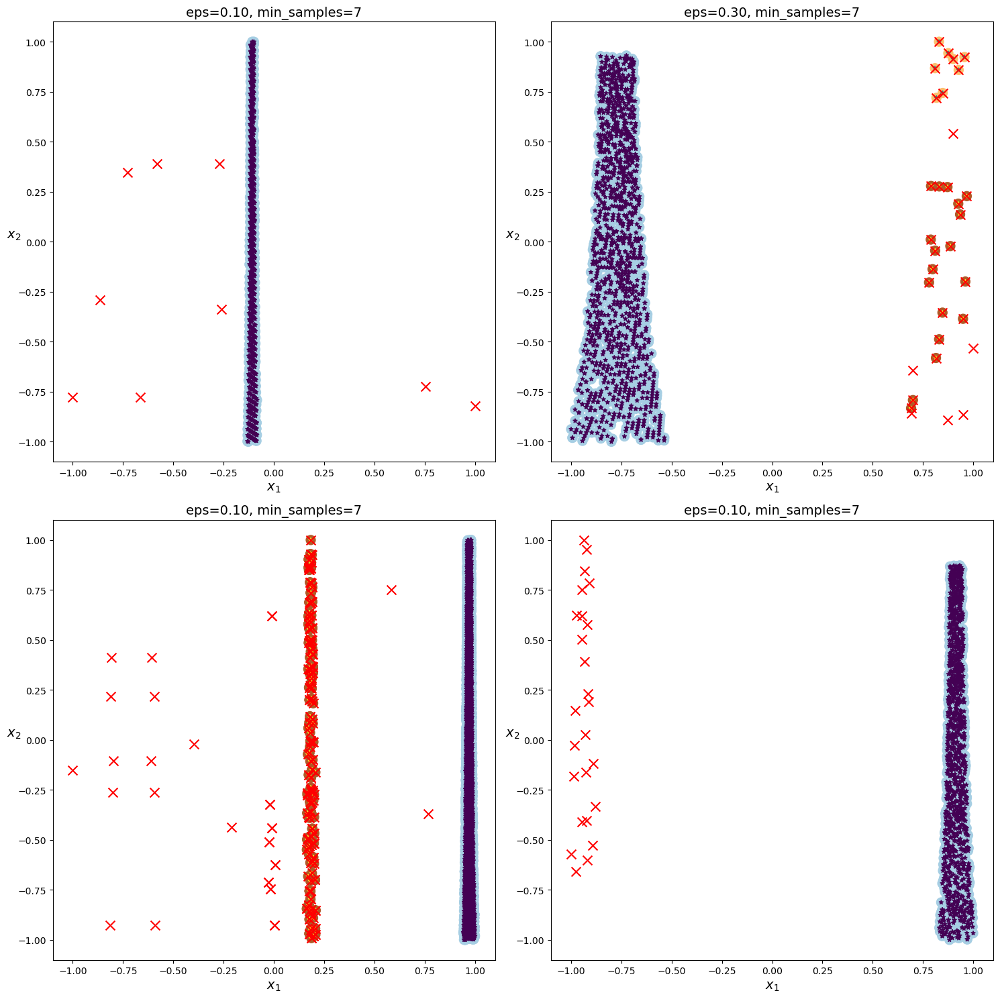

In [1027]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'air_inflow/motor_rpm', 'motor_temp', eps=0.1)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'air_inflow/motor_rpm', 'motor_temp', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'air_inflow/motor_rpm', 'motor_temp', eps=0.1)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'air_inflow/motor_rpm', 'motor_temp', eps=0.1)
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1030]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

In [1031]:
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index] = 0
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index]

610    0
611    0
Name: label, dtype: int32

In [1032]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)
submission2['label'].value_counts()

0    7063
1     326
Name: label, dtype: int64

In [1033]:
submission3 = submission2.copy()
submission3['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission3['label'].value_counts()

0    7063
1     326
Name: label, dtype: int64

# 흡입량/rpm 당 말단 온도

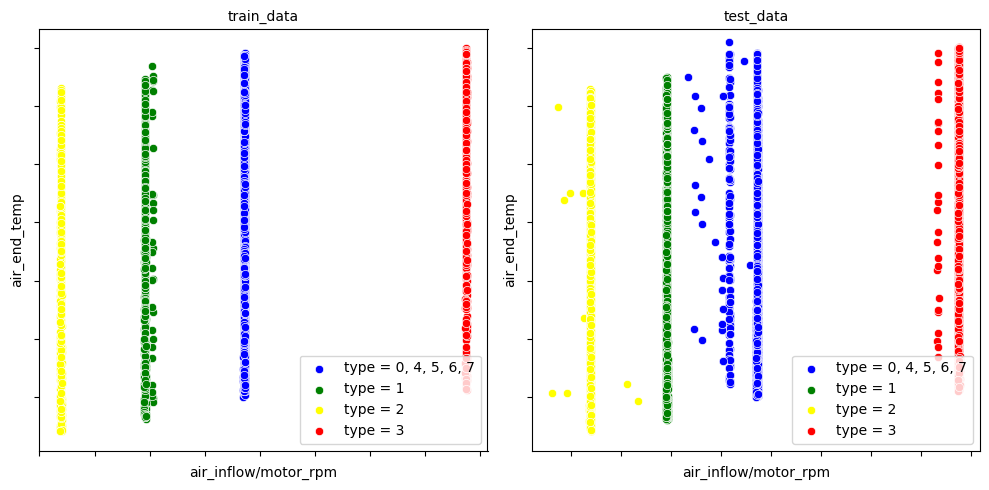

In [1034]:
sub_plot_corr(train_data, test_data, 'air_inflow/motor_rpm', 'air_end_temp')

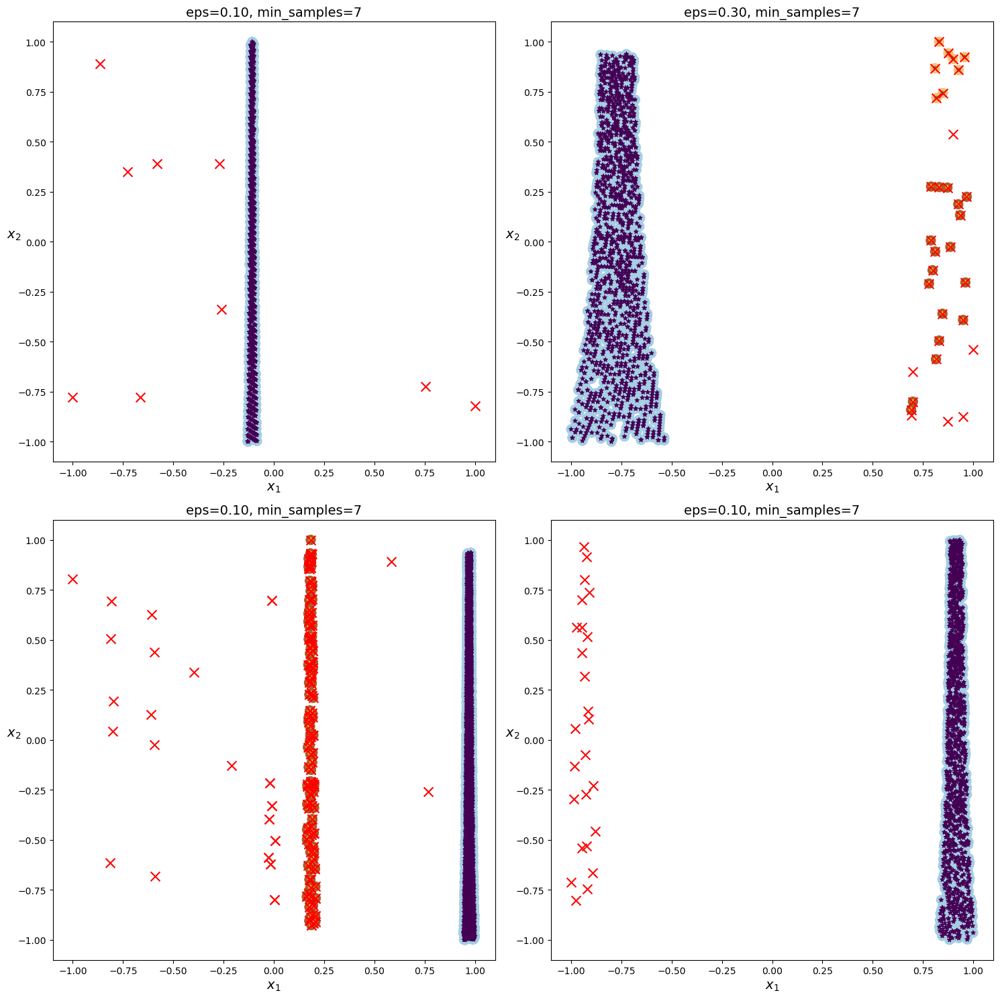

In [1035]:
dbscan, z_scaled, labels1 = train_dbscan(sum_data_power_10, 'air_inflow/motor_rpm', 'air_end_temp', eps=0.1)
dbscan2, z_scaled2, labels2 = train_dbscan(sum_data_power_20, 'air_inflow/motor_rpm', 'air_end_temp', eps=0.3)
dbscan3, z_scaled3, labels3 = train_dbscan(sum_data_power_30, 'air_inflow/motor_rpm', 'air_end_temp', eps=0.1)
dbscan4, z_scaled4, labels4 = train_dbscan(sum_data_power_50, 'air_inflow/motor_rpm', 'air_end_temp', eps=0.1)
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
plot_dbscan2(dbscan, z_scaled, size=100)

plt.subplot(2,2,2)
plot_dbscan2(dbscan2, z_scaled2, size=100)

plt.subplot(2,2,3)
plot_dbscan2(dbscan3,z_scaled3, size=100)

plt.subplot(2,2,4)
plot_dbscan2(dbscan4, z_scaled4, size=100)

plt.tight_layout()

In [1036]:
real_data_power_10 = pd.concat([pd.DataFrame(z_scaled, columns=['x1', 'x2']),pd.DataFrame(labels1, columns=['label']),
                                sum_data_power_10['index'],sum_data_power_10['data_type']], axis=1).reset_index(drop=True)
real_data_power_20 = pd.concat([pd.DataFrame(z_scaled2, columns=['x1', 'x2']),pd.DataFrame(labels2, columns=['label']),
                               sum_data_power_20['index'],sum_data_power_20['data_type']], axis=1).reset_index(drop=True)
real_data_power_30 = pd.concat([pd.DataFrame(z_scaled3, columns=['x1', 'x2']),pd.DataFrame(labels3, columns=['label']),
                               sum_data_power_30['index'],sum_data_power_30['data_type']], axis=1).reset_index(drop=True)
real_data_power_50 = pd.concat([pd.DataFrame(z_scaled4, columns=['x1', 'x2']),pd.DataFrame(labels4, columns=['label']),
                                sum_data_power_50['index'],sum_data_power_50['data_type']], axis=1).reset_index(drop=True)
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
test_data_power_30 = pd.concat([test_data_0, test_data_4, test_data_5, test_data_6, test_data_7]).reset_index()
test_data_power_20 = test_data_1
test_data_power_10 = test_data_2
test_data_power_50 = test_data_3

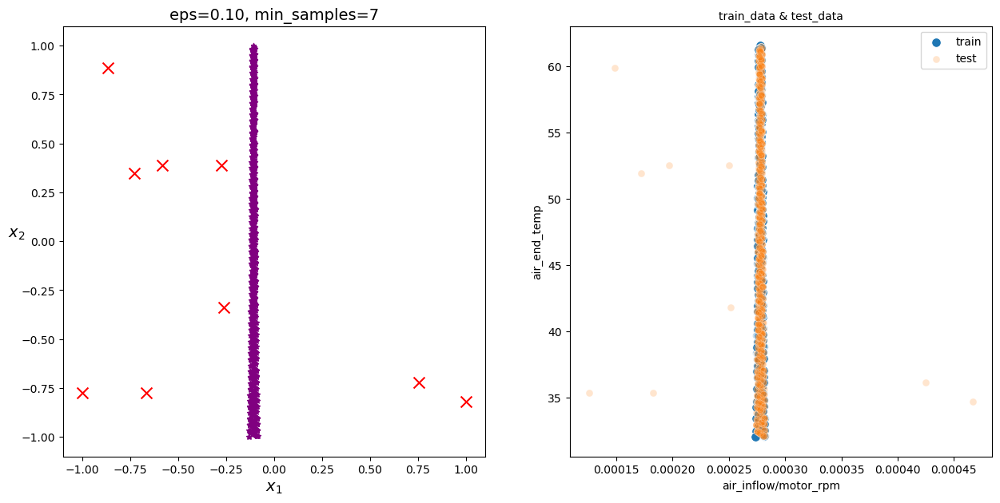

<Figure size 640x480 with 0 Axes>

In [1037]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan, real_data_power_10, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_10, test_data_power_10, 'air_inflow/motor_rpm', 'air_end_temp')

plt.tight_layout()

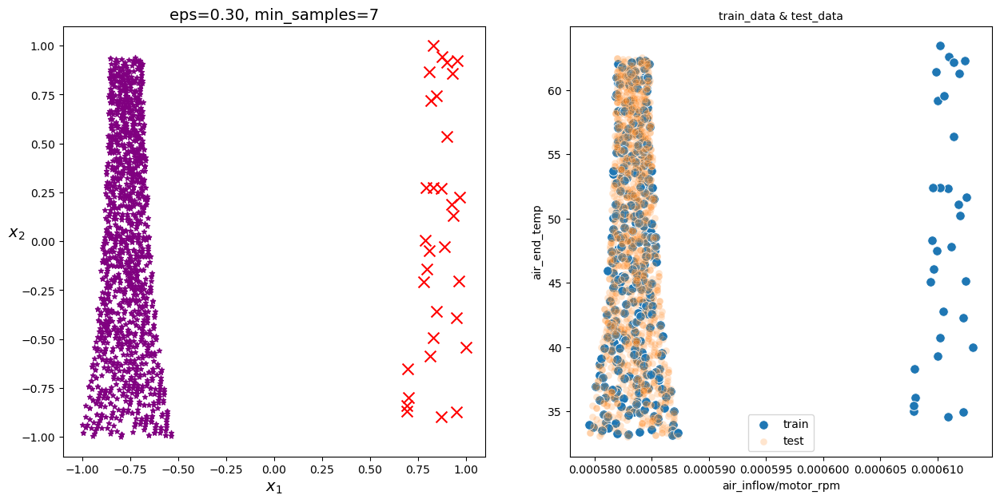

<Figure size 640x480 with 0 Axes>

In [1038]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan2, real_data_power_20, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_20, test_data_power_20, 'air_inflow/motor_rpm', 'air_end_temp')

plt.tight_layout()

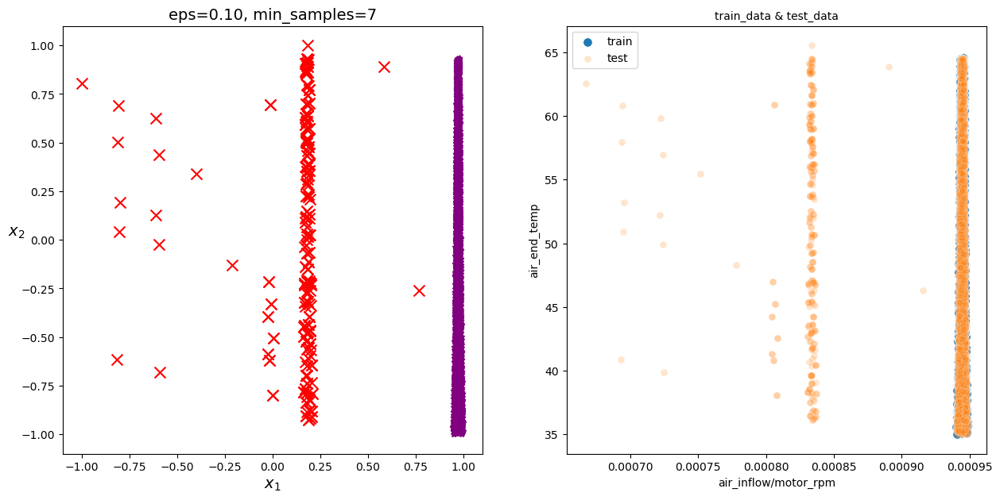

<Figure size 640x480 with 0 Axes>

In [1039]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan3, real_data_power_30, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_30, test_data_power_30, 'air_inflow/motor_rpm', 'air_end_temp')

plt.tight_layout()

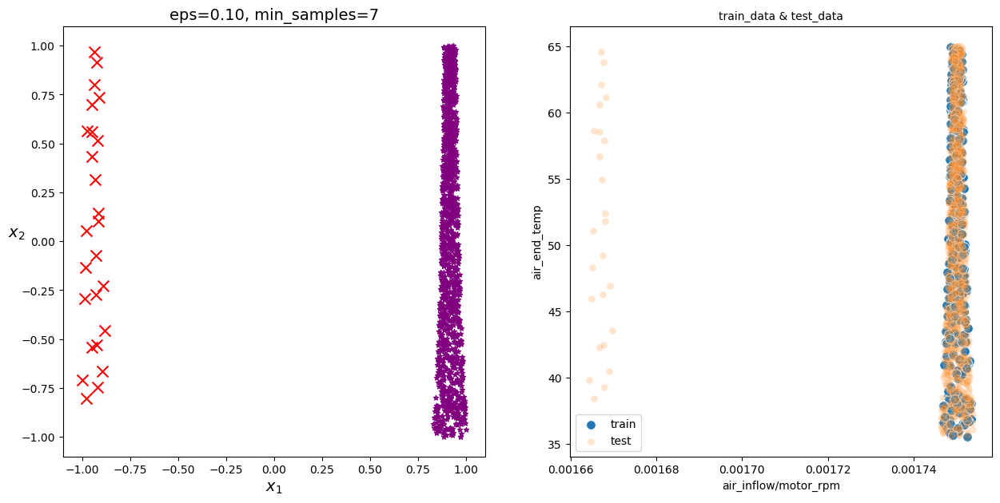

<Figure size 640x480 with 0 Axes>

In [1040]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3(dbscan4, real_data_power_50, size=100)

plt.subplot(1,2,2)
sub_plot_corr2(train_data_power_50, test_data_power_50, 'air_inflow/motor_rpm', 'air_end_temp')

plt.tight_layout()

In [1041]:
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index] = 0
real_data_power_10['label'][real_data_power_10[real_data_power_10['x1'] > 0]['label'].index]

610    0
611    0
Name: label, dtype: int32

In [1042]:
final_data = pd.concat([real_data_power_10[real_data_power_10['data_type'] == 'test'], real_data_power_20[real_data_power_20['data_type'] == 'test'],
           real_data_power_30[real_data_power_30['data_type'] == 'test'], real_data_power_50[real_data_power_50['data_type'] == 'test']])
final_data.sort_values(by='index', inplace=True)
final_data.reset_index(drop=True, inplace=True)
submission3['label'].value_counts()

0    7063
1     326
Name: label, dtype: int64

In [1043]:
submission4 = submission3.copy()
submission4['label'][final_data[final_data['label'] == 1]['label'].index] = 1
submission4['label'].value_counts()

0    7063
1     326
Name: label, dtype: int64

In [1044]:
submission4.to_csv('final_submission.csv',index=False)

#  새롭게

In [765]:
import numpy as np
import scipy as sp

def dbscan_predict(train_data, eps, X_new, metric=sp.spatial.distance.euclidean):
    # Result is noise by default
    y_new = np.ones(shape=len(X_new), dtype=int)*-1 

    # Iterate all input samples for a label
    for j, x_new in enumerate(X_new):
        # Find a core sample closer than EPS
        for i, x_core in enumerate(train_data): 
            if metric(x_new, x_core) < eps:
                # Assign label of x_core to x_new
                y_new[j] = 0
                break

    return y_new

In [722]:
def sub_plot_type_plus(data1, data2, type1, name1, name2):
  plt.figure(figsize=(10,5))
  color = ['#03ffee', 'green', 'yellow', 'red', '#003ea1','#0b9630','#7e02ab','#a1790d']
  plt.subplot(1,2,1)
  g = sns.scatterplot(data=data1, x=name1, y=name2, color=color[type1])
  g.set_title('train_data', size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = '+str(type1)])

  plt.subplot(1,2,2)
  g2 = sns.scatterplot(data=data2, x=name1, y=name2, color=color[type1])
  if type1 == 4:
    data_ = data2[data2['out_pressure']!=0.7] 
    g2 = sns.scatterplot(data=data_, x=name1, y=name2, color='black')
  g2.set_title('test_data', size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_xlim(g.get_xlim())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = '+str(type1)])
  plt.tight_layout()
  plt.show()

In [1676]:
def sub_plot_corr2_plus(train_data, test_data, name1, name2):
    g = sns.scatterplot(data=train_data, x=name1, y=name2, s=70, alpha=0.2)
    mask = test_data['label'] == 1
    g2 = sns.scatterplot(data=test_data, x=name1, y=name2, s= 20, markers='*' )
    g2 = sns.scatterplot(data=test_data[mask], x=name1, y=name2, color='black')
    g.set_title("train_data & test_data", size=10)
#     g.set_xticklabels(g.get_xticklabels())
#     g.set_yticklabels(g.get_yticklabels())
    plt.legend(labels=['train','test'])
    plt.show()

In [714]:
def sub_plot_type(data1, data2, type1, name1, name2):
  plt.figure(figsize=(10,5))
  color = ['#03ffee', 'green', 'yellow', 'red', '#003ea1','#0b9630','#7e02ab','#a1790d']
  plt.subplot(1,2,1)
  g = sns.scatterplot(data=data1, x=name1, y=name2, color=color[type1])
  if type1 == 4:
    data_ = data1[data1['out_pressure']!=0.7] 
    g = sns.scatterplot(data=data_, x=name1, y=name2, color='black')
  g.set_title('test_data', size=10)
  g.set_xticklabels(g.get_xticklabels())
  g.set_yticklabels(g.get_yticklabels())
  plt.legend(labels=['type = '+str(type1)])

  plt.subplot(1,2,2)
  g2 = sns.scatterplot(data=data2, x=name1, y=name2, color=color[type1])
    
  g2.set_title('train_data', size=10)
  g2.set_xticklabels(g.get_xticklabels())
  g2.set_yticklabels(g.get_yticklabels())
  g2.set_xlim(g.get_xlim())
  g2.set_ylim(g.get_ylim())
  plt.legend(labels=['type = '+str(type1)])
  plt.tight_layout()
  plt.show()

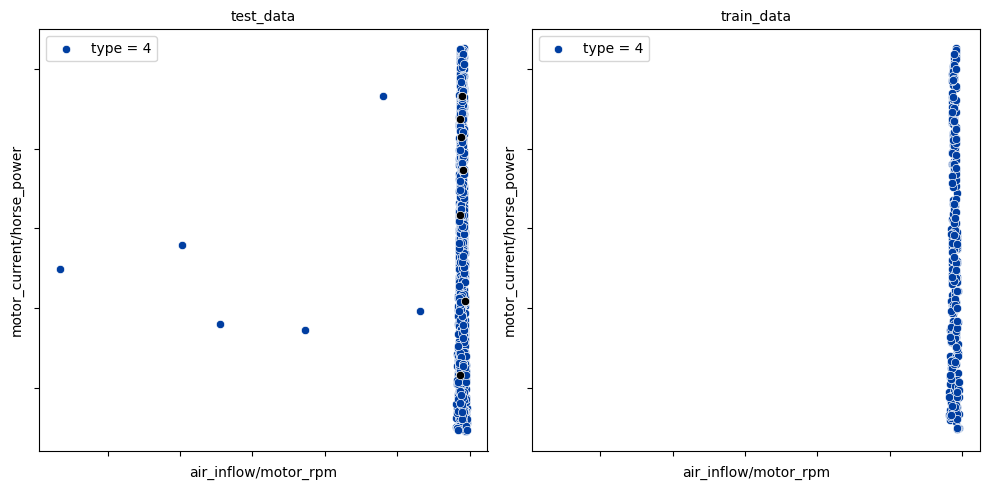

In [840]:
sub_plot_type(test_data_4, train_data_4, 4, 'air_inflow/motor_rpm', 'motor_current/horse_power')

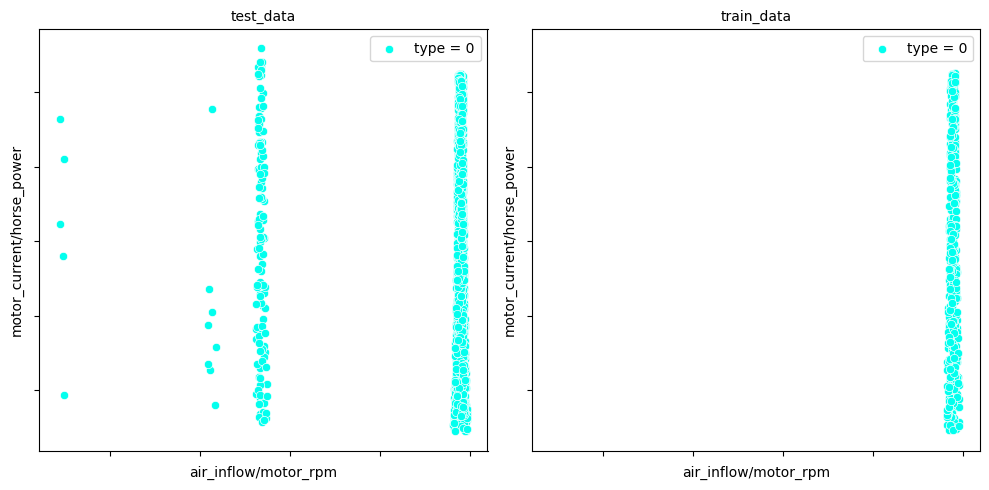

In [741]:
sub_plot_type(test_data_0, train_data_0, 0, 'air_inflow/motor_rpm', 'motor_current/horse_power')

In [781]:
train_new_data_1 = train_data_1.drop(train_data_1[train_data_1['air_inflow/motor_rpm'] > 0.0006].index)

In [ ]:
train_data_power_30 = pd.concat([train_data_0, train_data_4, train_data_5, train_data_6, train_data_7]).reset_index()
train_data_power_20 = train_data_1
train_data_power_10 = train_data_2
train_data_power_50 = train_data_3
sum_data_power_30 = pd.concat([sum_data_0, sum_data_4, sum_data_5, sum_data_6, sum_data_7]).reset_index(drop=True)
sum_data_power_20 = sum_data_1
sum_data_power_10 = sum_data_2
sum_data_power_50 = sum_data_3

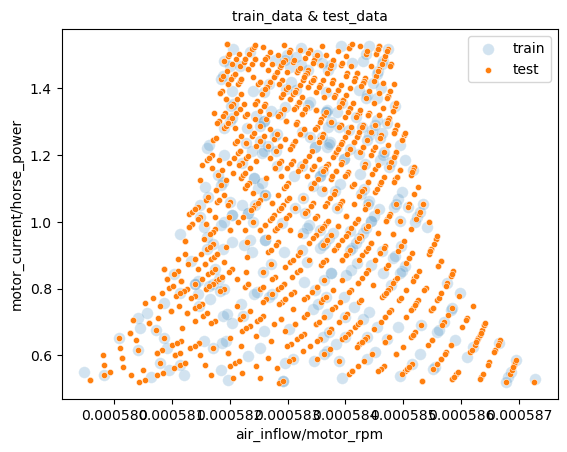

In [782]:
sub_plot_corr2_plus(train_new_data_1, test_data_1, 'air_inflow/motor_rpm', 'motor_current/horse_power')

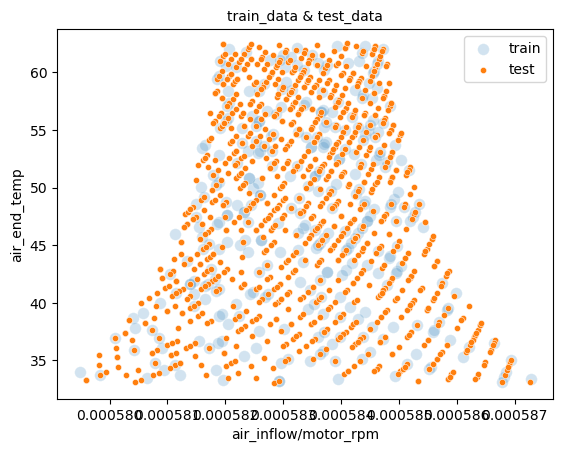

In [783]:
sub_plot_corr2_plus(train_new_data_1, test_data_1, 'air_inflow/motor_rpm', 'air_end_temp')

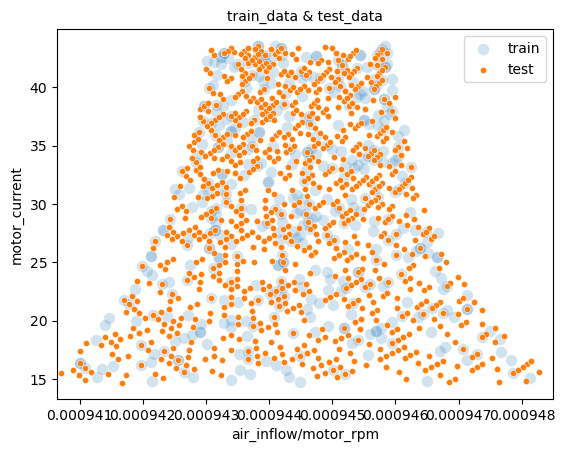

In [760]:
sub_plot_corr2_plus(train_data_0, test_data_0, 'air_inflow/motor_rpm', 'motor_current')

## 수정

In [881]:
def plot_dbscan3_plus(data1, data2, label, show_xlabels=True, show_ylabels=True):
#     core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
#     core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = label != 0
    real_mask = label == 0
#     non_core_mask = ~(core_mask | anomalies_mask)

#     cores = dbscan.components_
#     print(anomalies_mask)
    anomalies = data2[anomalies_mask]
    real = data2[real_mask]
#     print(anomalies)
#     non_cores = X[non_core_mask]
    
#     plt.scatter(cores[:, 0], cores[:, 1],
#                 c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
#     plt.scatter(real[:,0], real[:,1], marker='*', s=20, c='purple')
    plt.scatter(anomalies[:,0], anomalies[:,1],
                c="r", marker="x", s=100)
    plt.scatter(data1[:,0], data1[:,1], s=70, alpha=0.2, color = 'yellow')
    plt.scatter(data2[:,0], data2[:,1], s=70, alpha=0.2)
#     plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
#     plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)

In [959]:
scaler_1 = MinMaxScaler(feature_range = (-1, 1))
scaler_2 = MinMaxScaler(feature_range = (-1, 1))
def dbscan_predict(data1, x1, x2, eps, data2, metric=sp.spatial.distance.euclidean):
    # Result is noise by default
    X = data1[x1]
    y = data1[x2]
    z_= np.empty((len(X),2))
    z_[:,0] = X
    z_[:,1] = y
    
    x_new = data2[x1]
    y_new = data2[x2]
    z_new = np.empty((len(x_new), 2))
    z_new[:,0] = x_new
    z_new[:,1] = y_new
    
    X_scaled_ = scaler_1.fit_transform(z_[:,0].reshape(-1,1))
    x_new_scaled = scaler_1.fit_transform(z_new[:,0].reshape(-1,1))
    y_scaled_ = scaler_2.fit_transform(z_[:,1].reshape(-1,1))
    y_new_scaled = scaler_2.fit_transform(z_new[:,1].reshape(-1,1))

    
    z_scaled_ = np.empty((len(X_scaled_),2))
    z_scaled_[:,0] = X_scaled_.reshape(1,-1)
    z_scaled_[:,1] = y_scaled_.reshape(1,-1)
    y_new2 = np.ones(shape=len(data2), dtype=int) 
    
    z_scaled_new =np.empty((len(x_new_scaled),2))
    z_scaled_new[:,0] = x_new_scaled.reshape(1,-1)
    z_scaled_new[:,1] = y_new_scaled.reshape(1,-1)

    # Iterate all input samples for a label
    for j, x_new_ in enumerate(z_scaled_new):
        # Find a core sample closer than EPS
        for i, x_core in enumerate(z_scaled): 
            if metric(x_new_, x_core) < eps:
                # Assign label of x_core to x_new
                y_new2[j] = 0
                break
#         print(x_new_.shape)
        if (x_new_[0] > 0) | (x_new_[1] <= 0.875):
            y_new2[j] = 0

    return z_scaled, z_scaled_new, y_new2

In [842]:
test_data.shape

(7389, 16)

In [810]:
test_new_data = test_data.copy()
test_new_data.drop(index=submission5[submission5['label'] == 1].index, inplace=True)
test_new_data.shape

(7045, 16)

In [816]:
for i in range(8):
  globals()['test_new_data_{}'.format(i)] = test_new_data[test_new_data['type'] == i].reset_index()
test_new_data_4

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,data_type,motor_rpm/motor_current,air_inflow/motor_current,air_inflow/motor_rpm,motor_current/motor_rpm,motor_current/horse_power,motor_vibe/motor_temp,motor_temp/air_end_temp
0,4419,2.20,49.14,0.7,28.49,2331.0,65.90,3.30,4,test,81.818182,0.077220,0.000944,0.012222,0.949667,0.050076,1.341066
1,4420,2.02,46.78,0.7,26.18,2142.0,63.80,3.19,4,test,81.818182,0.077158,0.000943,0.012222,0.872667,0.050000,1.363831
2,4421,1.57,40.78,0.7,20.31,1662.0,58.47,2.92,4,test,81.831610,0.077302,0.000945,0.012220,0.677000,0.049940,1.433791
3,4422,2.45,52.36,0.7,31.64,2589.0,68.77,3.44,4,test,81.826802,0.077434,0.000946,0.012221,1.054667,0.050022,1.313407
4,4423,1.90,45.20,0.7,24.64,2016.0,62.40,3.12,4,test,81.818182,0.077110,0.000942,0.012222,0.821333,0.050000,1.380531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
900,5332,2.53,53.45,0.7,32.71,2676.0,69.73,3.49,4,test,81.809844,0.077346,0.000945,0.012223,1.090333,0.050050,1.304584
901,5333,2.54,53.65,0.7,32.90,2692.0,69.91,3.50,4,test,81.823708,0.077204,0.000944,0.012221,1.096667,0.050064,1.303075
902,5334,2.16,48.56,0.7,27.93,2285.0,65.39,3.27,4,test,81.811672,0.077336,0.000945,0.012223,0.931000,0.050008,1.346582
903,5335,1.76,43.26,0.7,22.75,1861.0,60.68,3.03,4,test,81.802198,0.077363,0.000946,0.012225,0.758333,0.049934,1.402681


In [ ]:
test_data_4['index']

In [802]:
test_data_4_ = test_data_4.copy()

In [ ]:
test_data_4_['index'].apply()

In [804]:
submission5[submission5['label'] == 1].index

Int64Index([ 585,  586,  587,  588,  589,  590,  591,  592,  593,  594,
            ...
            6795, 6796, 6797, 6798, 6799, 6800, 7342, 7348, 7359, 7360],
           dtype='int64', length=344)

In [892]:
tmp1[:,0][tmp1[:,0] < -0.5]

array([-0.7606708 , -0.82165798, -0.97400636, -0.79058513, -0.50142028,
       -0.55039428, -0.6395256 , -0.52805102, -0.5997552 , -0.68609375,
       -0.64416472, -0.87707715, -0.61826093, -0.63003599, -0.54122052,
       -1.        , -0.53844625, -0.67524277, -0.75074006, -0.69323208,
       -0.86370218, -0.76975573, -0.70204949, -0.57609924, -0.5394779 ,
       -0.5792185 , -0.64161703, -0.50945071, -0.50422563, -0.71649058,
       -0.61826093, -0.72782021, -0.92157783, -0.9499627 , -0.54957641,
       -0.5997552 , -0.58075986, -0.93019761, -0.82165798, -0.58350419])

In [960]:
tmp1, tmp2, result = dbscan_predict(train_data_4, 'air_inflow/motor_rpm', 'motor_current', 0.06, test_new_data_4)

In [930]:
train_data_4_plus = train_data_4.copy()
train_data_4_plus['air_inflow/motor_rpm'] = np.round(train_data_4['air_inflow/motor_rpm'], 5)

In [917]:
test_new_data_4_plus = test_new_data_4.copy()

In [928]:
test_new_data_4_plus['air_inflow/motor_rpm'] = np.round(test_new_data_4['air_inflow/motor_rpm'], 5)

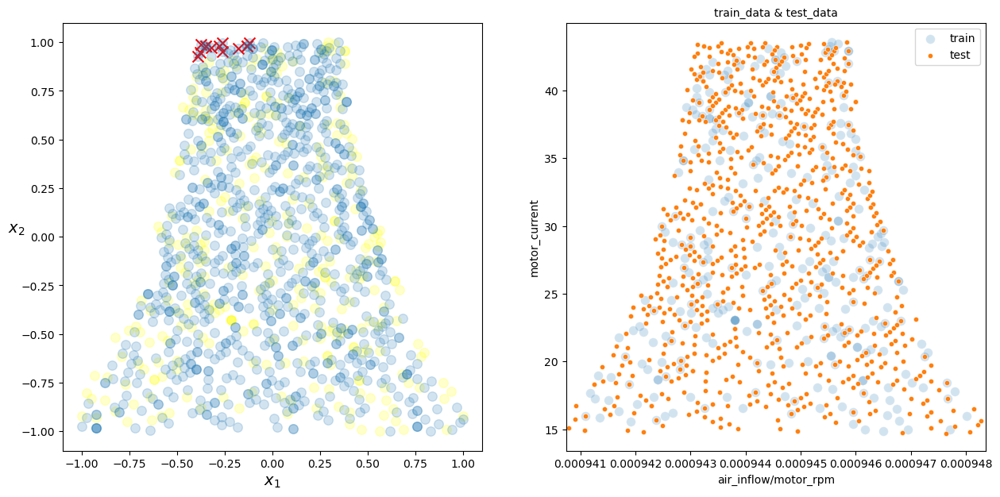

<Figure size 640x480 with 0 Axes>

In [961]:
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plot_dbscan3_plus(tmp1, tmp2, result)

plt.subplot(1,2,2)
sub_plot_corr2_plus(train_data_4, test_new_data_4, 'air_inflow/motor_rpm', 'motor_current')

plt.tight_layout()

In [962]:
test_new_data_4['result'] = result
test_new_data_4['result']

0      0
1      0
2      0
3      0
4      0
      ..
900    0
901    0
902    0
903    0
904    0
Name: result, Length: 905, dtype: int32

In [968]:
submission5['label'][test_new_data_4[test_new_data_4['result'] == 1]['index']]

4436    0
4582    0
4633    0
4653    0
4661    0
4689    0
4726    0
4825    0
4853    0
4905    0
4992    0
5007    0
5236    0
Name: label, dtype: int32

In [969]:
index = test_new_data_4[test_new_data_4['result'] == 1]['index']

In [971]:
submission5['label'][index] = 1
submission5['label'][index]

4436    1
4582    1
4633    1
4653    1
4661    1
4689    1
4726    1
4825    1
4853    1
4905    1
4992    1
5007    1
5236    1
Name: label, dtype: int32

In [973]:
submission5['label'].unique()

array([0, 1])

In [974]:
submission5.to_csv('revised.csv', index=False)

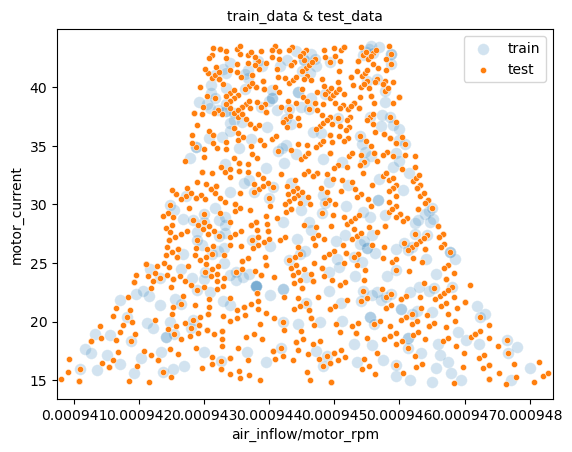

In [761]:
sub_plot_corr2_plus(train_data_4, test_data_4, 'air_inflow/motor_rpm', 'motor_current')

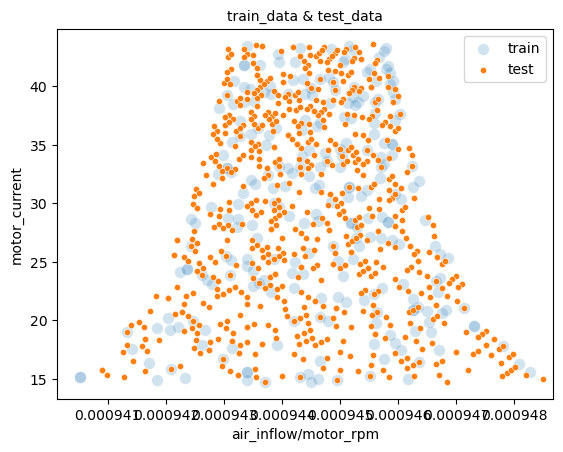

In [762]:
sub_plot_corr2_plus(train_data_5, test_data_5, 'air_inflow/motor_rpm', 'motor_current')

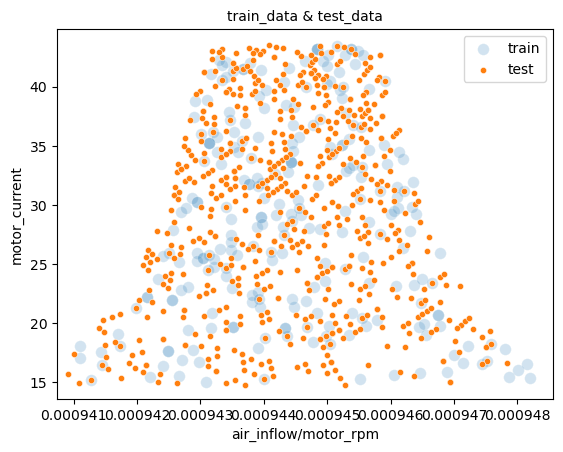

In [763]:
sub_plot_corr2_plus(train_data_6, test_data_6, 'air_inflow/motor_rpm', 'motor_current')

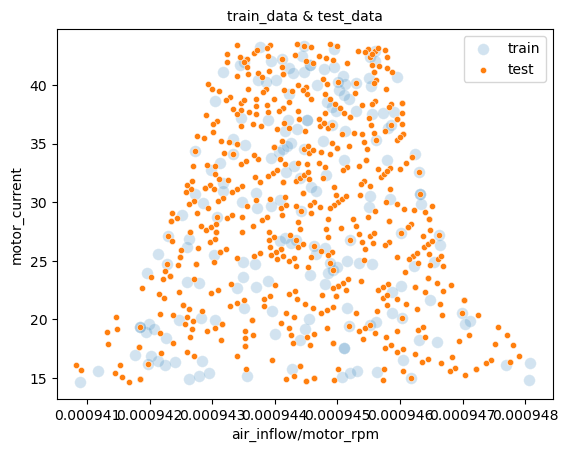

In [764]:
sub_plot_corr2_plus(train_data_7, test_data_7, 'air_inflow/motor_rpm', 'motor_current')

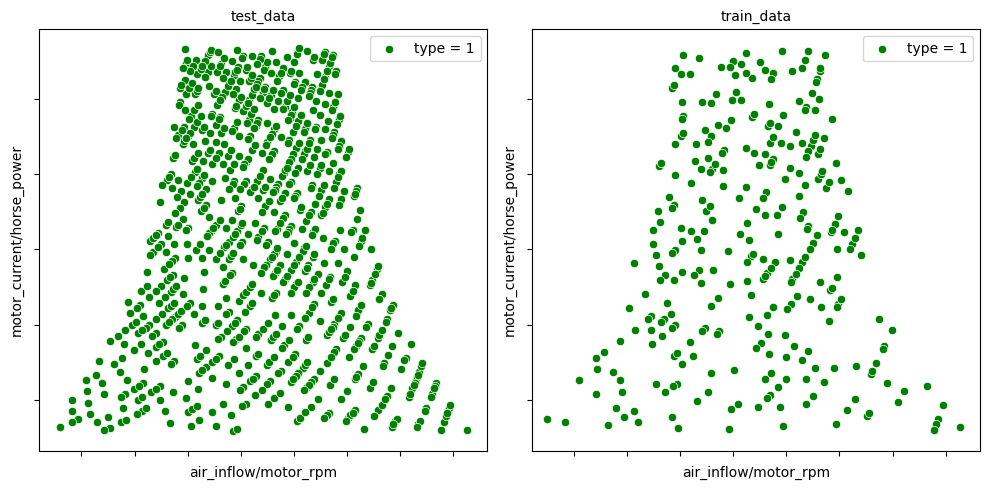

In [703]:
sub_plot_type(test_data_1, train_data_1, 1, 'air_inflow/motor_rpm', 'motor_current/horse_power')

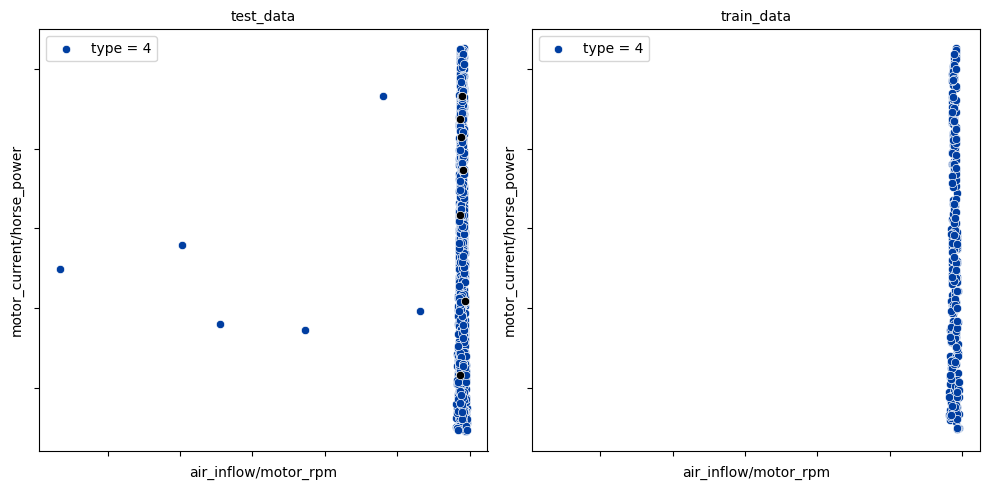

In [715]:
sub_plot_type(test_data_4, train_data_4, 4, 'air_inflow/motor_rpm', 'motor_current/horse_power')

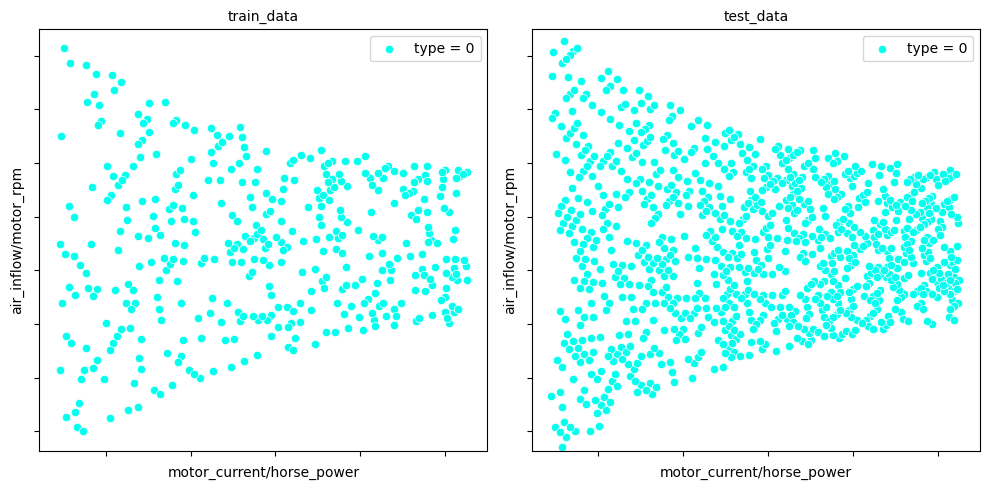

In [725]:
sub_plot_type_plus(train_data_0, test_data_0, 0, 'motor_current/horse_power', 'air_inflow/motor_rpm')

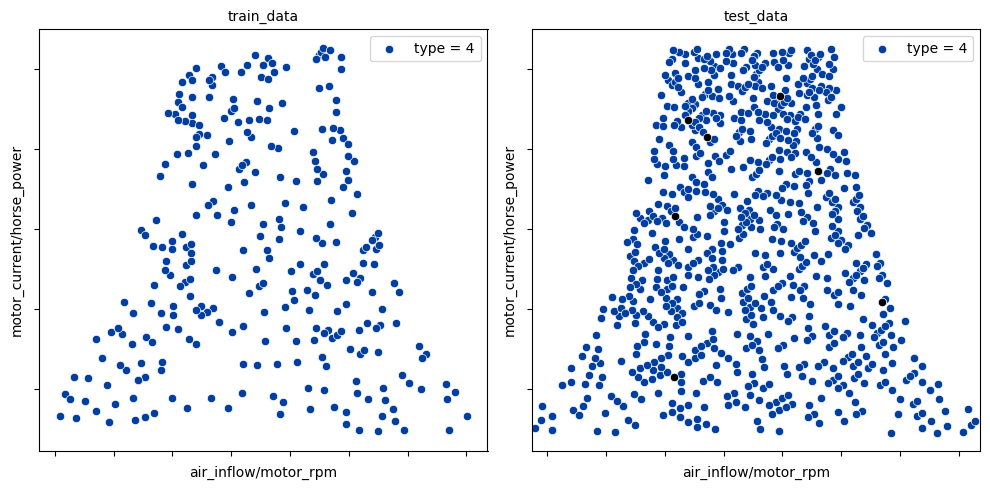

In [723]:
sub_plot_type_plus(train_data_4, test_data_4, 4, 'air_inflow/motor_rpm', 'motor_current/horse_power')

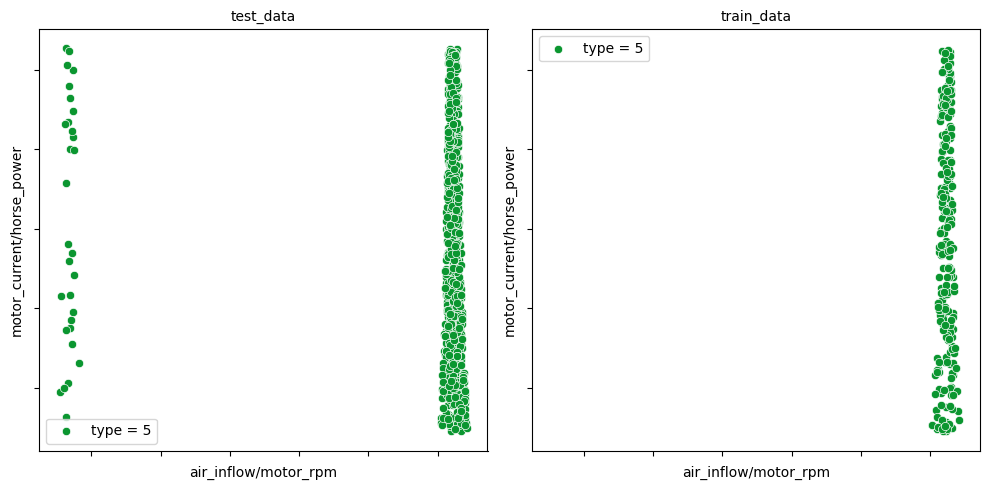

In [706]:
sub_plot_type(test_data_5, train_data_5, 5, 'air_inflow/motor_rpm', 'motor_current/horse_power')

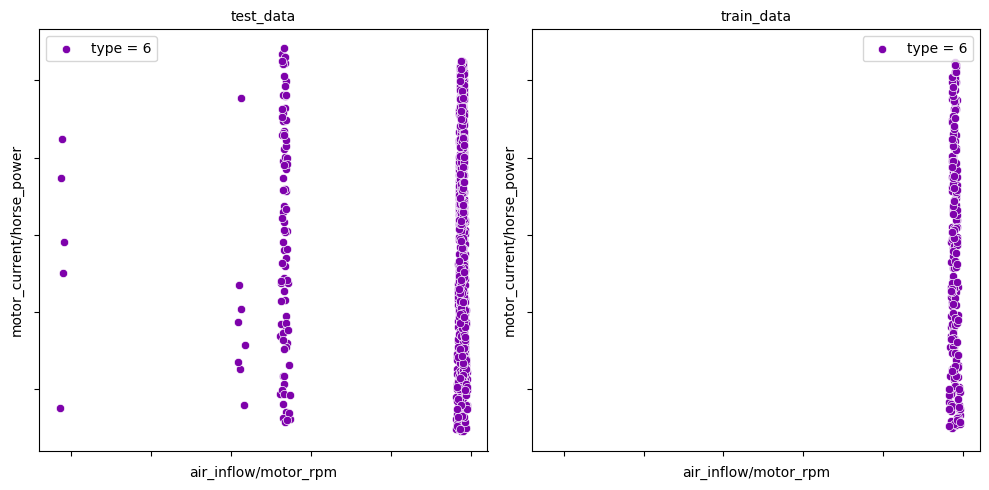

In [707]:
sub_plot_type(test_data_6, train_data_6, 6, 'air_inflow/motor_rpm', 'motor_current/horse_power')

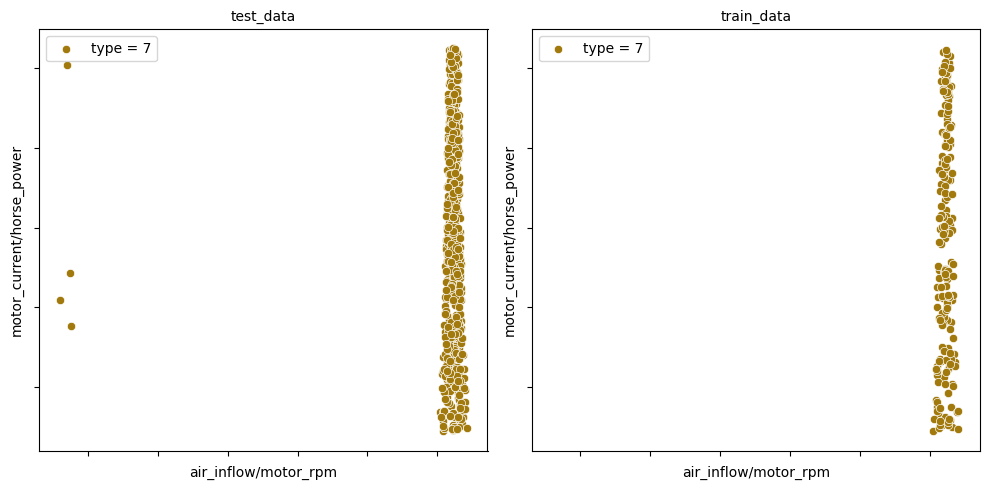

In [708]:
sub_plot_type(test_data_7, train_data_7, 7, 'air_inflow/motor_rpm', 'motor_current/horse_power')

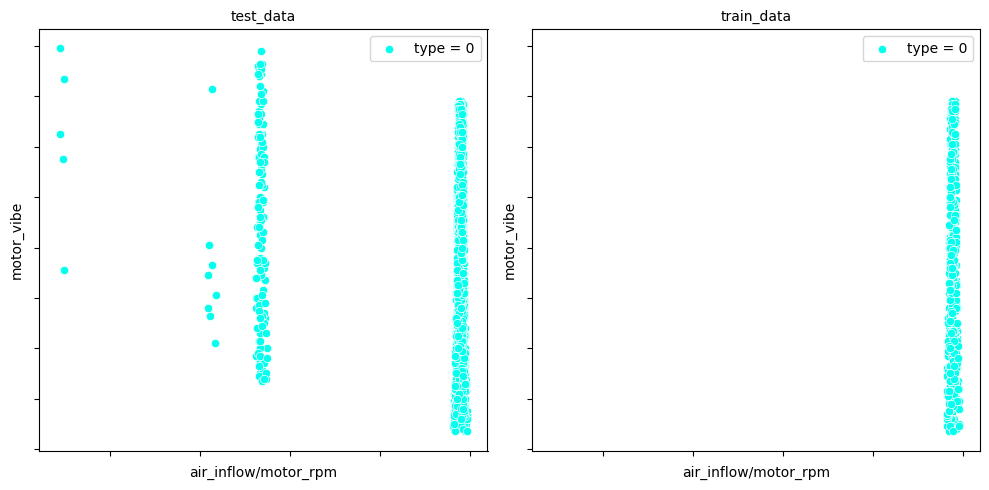

In [710]:
sub_plot_type(test_data_0, train_data_0, 0, 'air_inflow/motor_rpm', 'motor_vibe')

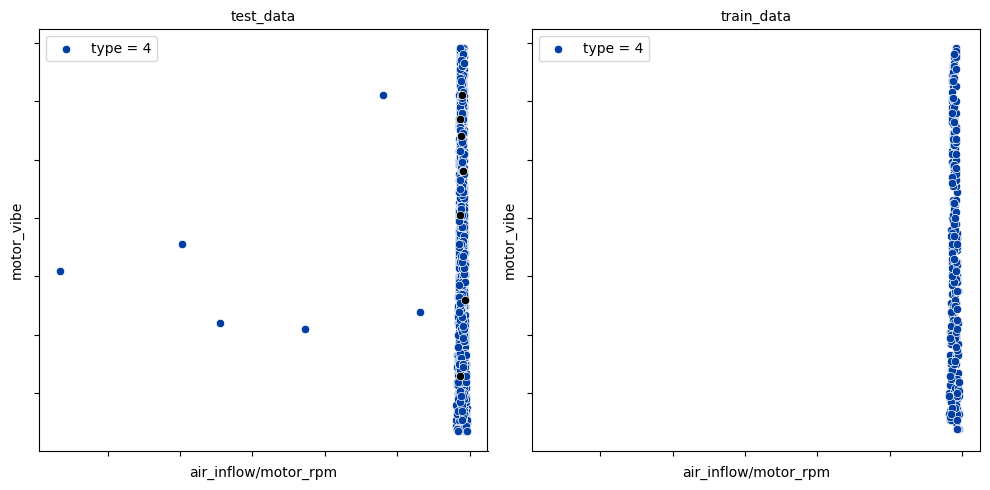

In [716]:
sub_plot_type(test_data_4, train_data_4, 4, 'air_inflow/motor_rpm', 'motor_vibe')

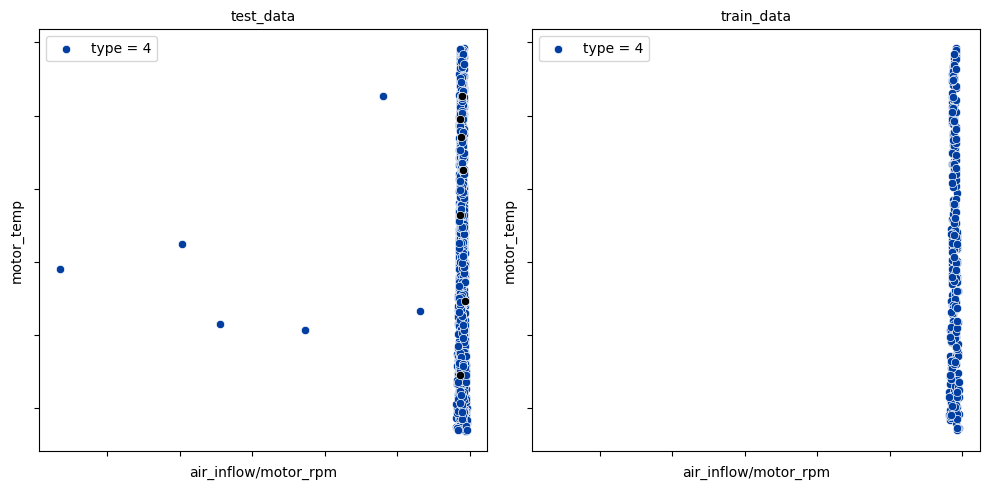

In [717]:
sub_plot_type(test_data_4, train_data_4, 4, 'air_inflow/motor_rpm', 'motor_temp')

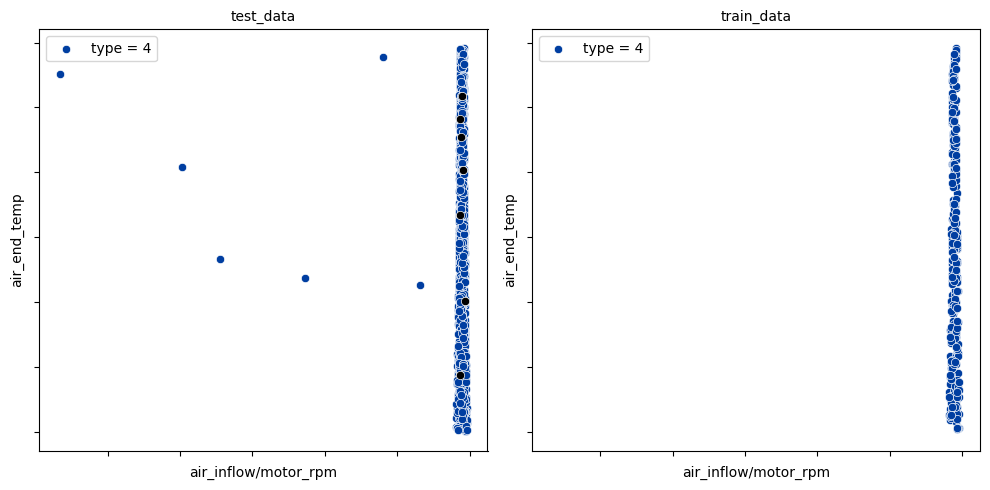

In [718]:
sub_plot_type(test_data_4, train_data_4, 4, 'air_inflow/motor_rpm', 'air_end_temp')